In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Since our "2024 UW ENGINE Capstone" drive folder is inside share with me folder which can't be directly access from Google Colab through MyDrive path, we have a way to walk around with this:
1.   Go to "Shared with me" on the left navigation bar of Google Drive
2.   Find the folder named "2024 UW ENGINE Capstone"
3.   Right click or click on 3 vertical dots, then Organize > Add shortcut > All locations > Choose the MyDrive > Click Add.
4.   Now you can access the '2024 UW ENGINE Capstone' folder from Google Colab.



In [ ]:
%cd /content/drive/MyDrive/'2024 UW ENGINE Capstone'

/content/drive/.shortcut-targets-by-id/1oyb6sI_Gh8b_o0AIjqSCq4UljphkuJTI/2024 UW ENGINE Capstone


In [ ]:
!ls data/'SuperMAG & NERC'/raw/
!ls data/OMNI/raw/
!ls data/NERC_GCI/raw/

resample_2010.csv  resample_2013.csv  resample_2016.csv  resample_2019.csv  resample_2022.csv
resample_2011.csv  resample_2014.csv  resample_2017.csv  resample_2020.csv  resample_2023.csv
resample_2012.csv  resample_2015.csv  resample_2018.csv  resample_2021.csv
IMF_CLOCK_ANGLE_2010.csv  IMF_CLOCK_ANGLE_2015.csv  IMF_CLOCK_ANGLE_2020.csv
IMF_CLOCK_ANGLE_2011.csv  IMF_CLOCK_ANGLE_2016.csv  IMF_CLOCK_ANGLE_2021.csv
IMF_CLOCK_ANGLE_2012.csv  IMF_CLOCK_ANGLE_2017.csv  IMF_CLOCK_ANGLE_2022.csv
IMF_CLOCK_ANGLE_2013.csv  IMF_CLOCK_ANGLE_2018.csv  IMF_CLOCK_ANGLE_2023.csv
IMF_CLOCK_ANGLE_2014.csv  IMF_CLOCK_ANGLE_2019.csv  OMNI_2010_2023.csv
2023GCIData.csv


In [ ]:
import pandas as pd

From SM data, we will need:

* datetime
* glon
* glat
* mlon
* mlat
* mlt  
* dbn_nez
* dbe_nez

From OMNI:

* DateTime
* BX_GSE
* BY_GSM
* BZ_GSM
* flow_speed
* proton_density
* T
* Pressure
* clock angle of the IMF(θc)



# Construct Machine Learning model: Multivariate Linear Regression

In [ ]:
!pip install mlflow

  Using cached entrypoints-0.4-py3-none-any.whl (5.3 kB)


In [1]:
from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import accuracy_score
import pandas as pd
import datetime as dt
import numpy as np
from tqdm import tqdm

In [2]:
def subsample_of_num_stations(df, stations_glon_glat=None):
    if stations_glon_glat == None:
        return df

    condition = False

    for glon, glat in stations_glon_glat:
        condition = condition | (df['glon'] == glon) & (df['glat'] == glat)

    return df[condition]

In [3]:
BASE_PATH = "/Users/longnguyen/Documents/LongBm/UW_Engine_Capstone/"

def create_official_dataset(files):
    result = pd.DataFrame()

    total_entries = 0

    for file in tqdm(files):
        dataset = pd.read_csv(BASE_PATH + file)
        total_entries += len(dataset)
        result = pd.concat([result, dataset], ignore_index=True)

    assert(total_entries == len(result))

    print('Num entries:', total_entries)

    return result

In [4]:
def generate_file_names(start, end):

    return [f'dataset_{i}.csv' for i in range(start, end + 1)]

In [5]:
train_files = generate_file_names(2010, 2019)
test_files = generate_file_names(2020, 2023)

In [6]:
train_dataset =  create_official_dataset(train_files) # Concatenate and reset index
# result = result.reindex(range(8))
train_dataset

  0%|          | 0/10 [00:00<?, ?it/s]

100%|██████████| 10/10 [34:32<00:00, 207.27s/it]


Num entries: 270731078


,datetime,glon,glat,mlon,mlat,mlt,dbn_nez,dbe_nez,BX_GSE,BY_GSM,BZ_GSM,flow_speed,proton_density,T,Pressure,SYM_H,CLOCK_ANGLE_GSM
0,2010-01-01 00:00:00,2.930,36.85,77.884224,27.490238,14.398300,-0.961335,2.232730,0.08,2.99,0.38,283.6,3.91,24946.0,0.63,1,81.40
1,2010-01-01 00:05:00,2.930,36.85,77.884224,27.490238,0.082257,-1.188596,2.232202,0.08,2.96,0.60,284.1,3.90,25642.0,0.63,1,80.82
2,2010-01-01 00:10:00,2.930,36.85,77.884224,27.490238,0.166704,-1.039363,2.223046,0.15,2.94,1.04,284.9,3.65,25423.0,0.59,1,70.72
3,2010-01-01 00:15:00,2.930,36.85,77.884224,27.490238,0.251440,-0.996011,2.120424,0.09,2.81,1.17,284.5,3.63,24643.0,0.58,1,67.95
4,2010-01-01 00:20:00,2.930,36.85,77.884224,27.490238,0.336487,-1.116696,1.921184,-0.12,2.64,1.41,282.9,3.53,24771.0,0.57,1,61.08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
270731073,2019-12-31 23:35:00,245.518,62.48,-56.854180,69.424225,14.601374,-4.964983,-1.253583,0.24,0.05,-0.79,302.3,8.05,28546.0,1.47,-7,136.68
270731074,2019-12-31 23:40:00,245.518,62.48,-56.854180,69.424225,14.684576,-2.425964,-0.768775,-1.38,0.91,-1.10,296.8,6.26,26910.0,1.10,-7,156.24
270731075,2019-12-31 23:45:00,245.518,62.48,-56.854180,69.424225,14.767933,-0.896954,-0.782651,-0.65,0.39,-1.03,300.9,7.76,29161.0,1.42,-6,144.88
270731076,2019-12-31 23:50:00,245.518,62.48,-56.854180,69.424225,14.851412,-0.341447,-1.462580,-2.21,1.94,-0.81,297.0,6.40,27451.0,1.14,-7,131.18


In [7]:
test_dataset =  create_official_dataset(test_files) # Concatenate and reset index
# result = result.reindex(range(8))
test_dataset

100%|██████████| 4/4 [05:12<00:00, 78.00s/it]

Num entries: 75897418


,datetime,glon,glat,mlon,mlat,mlt,dbn_nez,dbe_nez,BX_GSE,BY_GSM,BZ_GSM,flow_speed,proton_density,T,Pressure,SYM_H,CLOCK_ANGLE_GSM
0,2020-01-01 00:00:00,76.920,43.25,150.22480,38.829740,4.824365,3.734044,3.025891,-2.93,3.02,-0.51,295.60,5.310000,24010.000000,0.930000,-6,98.88
1,2020-01-01 00:05:00,76.920,43.25,150.22480,38.829740,4.908339,3.690294,3.105935,-2.58,2.88,-0.47,296.65,6.470000,28973.000000,1.140000,-6,101.62
2,2020-01-01 00:10:00,76.920,43.25,150.22480,38.829740,4.992806,3.848985,3.066320,2.03,1.07,0.63,297.70,7.630000,33936.000000,1.350000,-6,64.08
3,2020-01-01 00:15:00,76.920,43.25,150.22480,38.829740,5.077563,4.146138,3.051936,0.81,1.11,-0.03,296.30,8.610000,34855.000000,1.510000,-6,78.68
4,2020-01-01 00:20:00,76.920,43.25,150.22480,38.829740,5.162632,4.603361,2.818436,0.11,0.12,-0.24,295.20,8.930000,27156.000000,1.560000,-6,194.86
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75897413,2023-05-26 01:50:00,245.518,62.48,-56.85418,69.424225,17.354526,82.314190,0.890782,2.39,0.10,-2.55,512.00,1.550000,136874.000000,0.820000,-17,175.34
75897414,2023-05-26 01:55:00,245.518,62.48,-56.85418,69.424225,17.432081,70.770140,17.823336,2.91,-0.10,-2.20,490.90,1.580000,130945.000000,0.760000,-17,181.70
75897415,2023-05-26 02:00:00,245.518,62.48,-56.85418,69.424225,17.509791,79.602571,32.362805,1.76,-1.19,-3.51,503.90,1.560000,145751.000000,0.790000,-18,195.40
75897416,2023-05-26 02:05:00,245.518,62.48,-56.85418,69.424225,17.587575,85.544673,45.955596,1.87,-0.58,-3.32,500.10,1.586667,145173.333333,0.793333,-19,188.32


In [8]:
stations = [(76.920, 43.250)]

train_dataset_subsample = subsample_of_num_stations(train_dataset, stations)
test_dataset_subsample = subsample_of_num_stations(test_dataset, stations)

In [9]:
print(len(train_dataset_subsample))
print(len(test_dataset_subsample))

1051708
317820


In [10]:
train_dataset_subsample['datetime'] = pd.to_datetime(train_dataset_subsample['datetime'])
test_dataset_subsample['datetime'] = pd.to_datetime(test_dataset_subsample['datetime'])

/var/folders/s5/c0srr8h95f92h_ycrd0zy_xr0000gp/T/ipykernel_1108/3092735595.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_dataset_subsample['datetime'] = pd.to_datetime(train_dataset_subsample['datetime'])
/var/folders/s5/c0srr8h95f92h_ycrd0zy_xr0000gp/T/ipykernel_1108/3092735595.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_dataset_subsample['datetime'] = pd.to_datetime(test_dataset_subsample['datetime'])


In [ ]:
from datetime import datetime

def check_align_with_correct_datetime(df):
        # start date
    start_date = datetime.strptime("2010-01-01 00:00:00", "%Y-%m-%d %H:%M:%S")
    end_date = datetime.strptime("2019-12-31 23:55:00", "%Y-%m-%d %H:%M:%S")

    # difference between each date. D means one day
    D = 'D'

    date_list = pd.date_range(start_date, end_date, freq='5T')
    print(f"Creating list of dates starting from {start_date} to {end_date}")
    fixed_dates = pd.DataFrame(date_list, columns=['datetime'])
    fixed_dates['datetime'] = pd.to_datetime(fixed_dates['datetime'])
    fixed_dates.dtypes

    merged_data = fixed_dates.merge(df, on='datetime', how='left')

    nan_cols = merged_data.isna().any()
    nan_cols = list(nan_cols[nan_cols == True].keys())
    print(nan_cols)

    if len(nan_cols) != 0:
        # print(f'There is NaN inside {name} data')
        merged_data[nan_cols] = merged_data[nan_cols].interpolate(method ='linear', axis=0, limit_direction='both')

    assert(merged_data.isna().any().sum() == 0)
    assert(len(merged_data) == len(date_list))
    print("Length data:", len(merged_data))

    return merged_data

train_dataset_subsample = check_align_with_correct_datetime(train_dataset_subsample)

In [10]:
def num_of_days_in(year):
    """
    Check if the given year is a leap year or not.
    """
    if year % 4 == 0:
        if year % 100 == 0:
            if year % 400 == 0:
                return 366
            else:
                return 365
        else:
            return 366
    else:
        return 365


In [11]:
import datetime as dt

def datetime_to_numeric(df):
    df['datetime'] = pd.to_datetime(df['datetime'])

    # Calculate day of the year
    day_of_year = df['datetime'].dt.dayofyear
    # Calculate universal time (UT) in hours
    ut_hours = df['datetime'].dt.hour + df['datetime'].dt.minute / 60

    # Convert day of year and UT to angles
    # print(len(day_of_year))
    # print(len(df['datetime'].dt.year.apply(num_of_days_in)))
    # return
    day_angle = 2 * np.pi * day_of_year / df['datetime'].dt.year.apply(num_of_days_in)
    ut_angle = 2 * np.pi * ut_hours / 24

    # Calculate sine and cosine of angles
    df['day_sin'] = np.sin(day_angle)
    df['day_cos'] = np.cos(day_angle)
    df['ut_sin'] = np.sin(ut_angle)
    df['ut_cos'] = np.cos(ut_angle)

    return df

In [14]:
import datetime as dt

datetime_to_numeric(train_dataset_subsample)
datetime_to_numeric(test_dataset_subsample)
print("")

/var/folders/s5/c0srr8h95f92h_ycrd0zy_xr0000gp/T/ipykernel_1108/2663889556.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['datetime'] = pd.to_datetime(df['datetime'])
/var/folders/s5/c0srr8h95f92h_ycrd0zy_xr0000gp/T/ipykernel_1108/2663889556.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['day_sin'] = np.sin(day_angle)
/var/folders/s5/c0srr8h95f92h_ycrd0zy_xr0000gp/T/ipykernel_1108/2663889556.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
T

/var/folders/s5/c0srr8h95f92h_ycrd0zy_xr0000gp/T/ipykernel_1108/2663889556.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ut_sin'] = np.sin(ut_angle)
/var/folders/s5/c0srr8h95f92h_ycrd0zy_xr0000gp/T/ipykernel_1108/2663889556.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ut_cos'] = np.cos(ut_angle)


In [129]:
from sklearn.preprocessing import StandardScaler

def normalization(x_train, x_tes):
    exclude_cols = ['day_sin', 'day_cos', 'ut_sin', 'ut_cos']
    data_cols = x_train.columns.difference(exclude_cols)
    data = pd.concat([x_train[data_cols], x_tes[data_cols]], ignore_index=True)

    assert len(data) == (len(x_train) + len(x_test))

    scaler = StandardScaler()
    scaler.fit(data)

    # print(scaler.get_feature_names_out())
    print(scaler.scale_)
    print(scaler.mean_)
    print(scaler.var_)

    x_train[data_cols] = scaler.transform(x_train[data_cols])
    x_test[data_cols] = scaler.transform(x_test[data_cols])

# normalization(x_train, x_test)

In [5]:
# import mlflow
# from mlflow.models import infer_signature

def experiment(model, x_train, y_train, x_test, y_test, model_name):
    # model.fit(x_train, y_train)

    y_train_pred = model.predict(x_train)
    y_test_pred = model.predict(x_test)

    train_mse = np.sqrt(mse(y_train, y_train_pred, multioutput='raw_values'))
    train_mae = mae(y_train, y_train_pred, multioutput='raw_values')

    test_mse = np.sqrt(mse(y_test, y_test_pred, multioutput='raw_values'))
    test_mae = mae(y_test, y_test_pred, multioutput='raw_values')

    # mlflow.set_tracking_uri(uri="http://localhost:8080")

    # mlflow.set_experiment(f"{model_name} Experiement")

    # # Start an MLflow run
    # with mlflow.start_run():
    #     # Log the hyperparameters
    #     mlflow.log_params(model.get_params())

    #     # Log the loss metric
    #     mlflow.log_metric("Train MSE on dbn", train_mse[0])
    #     mlflow.log_metric("Train MAE on dbn", train_mae[0])
    #     mlflow.log_metric("Train MSE on dbe", train_mse[1])
    #     mlflow.log_metric("Train MAE on dbe", train_mae[1])

    #     mlflow.log_metric("Test MSE on dbn", test_mse[0])
    #     mlflow.log_metric("Test MAE on dbn", test_mae[0])
    #     mlflow.log_metric("Test MSE on dbe", test_mse[1])
    #     mlflow.log_metric("Test MAE on dbe", test_mae[1])

    #     # Set a tag that we can use to remind ourselves what this run was for
    #     mlflow.set_tag("Training Info", f"{model_name} model for Magnetic Perturbation Data")

    #     # Infer the model signature
    #     signature = infer_signature(x_train, model.predict(x_train))

    #     # Log the model
    #     model_info = mlflow.sklearn.log_model(
    #         sk_model=model,
    #         artifact_path=f"{model_name}",
    #         signature=signature,
    #         input_example=x_train,
    #         registered_model_name=f"{model_name}",
    #     )

    print(f"{model_name} metrics:")

    print("Train MSE:", train_mse)
    print("Train MAE:", train_mae)
    print("Test MSE:", test_mse)
    print("Test MAE:", test_mae)

    return model, y_train_pred, y_test_pred

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

def generate_single_scatter_graph(datetime, y_truth, y_pred, data_type):
    plt.figure(figsize=(15, 6))

    plt.subplot(1, 2, 1)
    plt.plot(list(datetime), list(y_truth['dbn_nez']), 'bo', label='Truth')
    plt.plot(list(datetime), list(y_pred[:, 0]), 'ro', label='Prediction')
    plt.xlabel('datetime')
    plt.xticks(rotation=60)
    plt.ylabel('dbn')
    plt.legend()
    plt.title(data_type + "-" + "DBN")

    plt.subplot(1, 2, 2)
    plt.plot(list(datetime), list(y_truth['dbe_nez']), 'bo', label='Truth')
    plt.plot(list(datetime), list(y_pred[:, 1]), 'ro', label='Prediction')
    plt.xlabel('datetime')
    plt.xticks(rotation=60)
    plt.ylabel('dbe')
    plt.legend()
    plt.title(data_type + "-" + "DBE")

    plt.show()

def generate_single_distribution_graph(y_truth, y_pred, data_type):
    plt.figure(figsize=(15, 6))

    plt.subplot(1, 2, 1)
    sns.kdeplot(y_truth['dbn_nez'], fill=True, label='Truth')
    # lr_y_train_pred
    sns.kdeplot(y_pred[:, 0], fill=True, label='Prediction')

    plt.title(data_type + '- Kernel Density Plot for DBN')
    plt.legend()


    plt.subplot(1, 2, 2)
    sns.kdeplot(y_truth['dbe_nez'], fill=True, label='Truth')
    sns.kdeplot(y_pred[:, 1], fill=True, label='Prediction')
    plt.title(data_type + '- Kernel Density Plot for DBE')
    plt.legend()
    plt.show()

In [7]:
def metric_visualization(
        y_train_pred,
        y_test_pred,
        targets=["dbn_nez", "dbe_nez"],
        train_sample=None,
        test_sample=None,
        y_train=None,
        y_test=None):

    datas = [train_sample, test_sample]
    truths = [y_train, y_test]
    preds = [y_train_pred, y_test_pred]

    for i in range(2):
        type = "train" if i == 0 else "test"
        data = datas[i]
        truth = truths[i]
        pred = preds[i]

        # for idx, target in enumerate(targets):
        # generate_single_scatter_graph(data['datetime'], truth[target], pred[:, idx], target, type)
        generate_single_scatter_graph(data['datetime'], truth, pred, type)


        generate_single_distribution_graph(truth, pred, type)

In [8]:
from datetime import datetime
def get_short_period_data(data, start, end):
    start_date = datetime.strptime(start, "%Y-%m-%d %H:%M:%S")
    end_date = datetime.strptime(end, "%Y-%m-%d %H:%M:%S")

    return data[(data['datetime'] >= start_date) & (data['datetime'] <= end_date)]

In [26]:
# train_dataset_subsample = train_dataset_subsample.sort_values(by='datetime')
# test_dataset_subsample = test_dataset_subsample.sort_values(by='datetime')

In [27]:
# train_dataset_subsample.columns

Index(['datetime', 'glon', 'glat', 'mlon', 'mlat', 'mlt', 'dbn_nez', 'dbe_nez',
       'BX_GSE', 'BY_GSM', 'BZ_GSM', 'flow_speed', 'proton_density', 'T',
       'Pressure', 'SYM_H', 'CLOCK_ANGLE_GSM', 'day_sin', 'day_cos', 'ut_sin',
       'ut_cos'],
      dtype='object')

In [9]:
def create_historical_features(df, col):
    lag = 4

    for i in range(1, lag + 1):
        df[col + "_past_" + str(i*15) + "_mins"] = df[col].shift(i*3)

    df.fillna(0, inplace=True)


In [211]:
# create_historical_features(train_dataset_subsample, 'BX_GSE')
# create_historical_features(train_dataset_subsample, 'BY_GSM')
# create_historical_features(train_dataset_subsample, 'BZ_GSM')

# create_historical_features(test_dataset_subsample, 'BX_GSE')
# create_historical_features(test_dataset_subsample, 'BY_GSM')
# create_historical_features(test_dataset_subsample, 'BZ_GSM')

##### Missing Data

In [98]:
# temp_df = None
# for i in range(2016, 2018):
#     temp_df = get_short_period_data(merged_data[merged_data.isna().any(axis=1)], f"{i}-1-1 00:00:00", f"{i}-12-31 23:59:00")
#     temp_df = temp_df[['datetime']]
#     # print(temp_df.iloc[0, 0])
#     # print(temp_df.iloc[-1, 0])

#     print(temp_df)

                  datetime
736384 2016-12-31 21:20:00
736385 2016-12-31 21:25:00
736386 2016-12-31 21:30:00
736387 2016-12-31 21:35:00
736388 2016-12-31 21:40:00
736389 2016-12-31 21:45:00
736390 2016-12-31 21:50:00
736391 2016-12-31 21:55:00
736392 2016-12-31 22:00:00
736393 2016-12-31 22:05:00
736394 2016-12-31 22:10:00
736395 2016-12-31 22:15:00
736396 2016-12-31 22:20:00
736397 2016-12-31 22:25:00
736398 2016-12-31 22:30:00
736399 2016-12-31 22:35:00
736400 2016-12-31 22:40:00
736401 2016-12-31 22:45:00
736402 2016-12-31 22:50:00
736403 2016-12-31 22:55:00
736404 2016-12-31 23:00:00
736405 2016-12-31 23:05:00
736406 2016-12-31 23:10:00
736407 2016-12-31 23:15:00
736408 2016-12-31 23:20:00
736409 2016-12-31 23:25:00
736410 2016-12-31 23:30:00
736411 2016-12-31 23:35:00
736412 2016-12-31 23:40:00
736413 2016-12-31 23:45:00
736414 2016-12-31 23:50:00
736415 2016-12-31 23:55:00
                  datetime
736416 2017-01-01 00:00:00
736417 2017-01-01 00:05:00
736418 2017-01-01 00:10:00
7

#### Different Range of Dataset

In [10]:
train_dataset_subsample = pd.read_csv("station_76_43_training_data.csv", index_col=[0])
test_dataset_subsample = pd.read_csv("station_76_43_test_data.csv", index_col=[0])

In [11]:
train_dataset_subsample['datetime'] = pd.to_datetime(train_dataset_subsample['datetime'])
test_dataset_subsample['datetime'] = pd.to_datetime(test_dataset_subsample['datetime'])

##### Full Dataset

In [12]:
train_dataset_subsample

,datetime,glon,glat,mlon,mlat,mlt,dbn_nez,dbe_nez,BX_GSE,BY_GSM,...,flow_speed,proton_density,T,Pressure,SYM_H,CLOCK_ANGLE_GSM,day_sin,day_cos,ut_sin,ut_cos
0,2010-01-01 00:00:00,76.92,43.25,150.2248,38.82974,4.821004,-0.730745,0.071910,0.08,2.99,...,283.6,3.91,24946.0,0.63,1.0,81.40,1.721336e-02,0.999852,0.000000,1.000000
1,2010-01-01 00:05:00,76.92,43.25,150.2248,38.82974,4.904961,-0.772826,0.070373,0.08,2.96,...,284.1,3.90,25642.0,0.63,1.0,80.82,1.721336e-02,0.999852,0.021815,0.999762
2,2010-01-01 00:10:00,76.92,43.25,150.2248,38.82974,4.989408,-0.419695,0.031294,0.15,2.94,...,284.9,3.65,25423.0,0.59,1.0,70.72,1.721336e-02,0.999852,0.043619,0.999048
3,2010-01-01 00:15:00,76.92,43.25,150.2248,38.82974,5.074144,-0.664807,0.039026,0.09,2.81,...,284.5,3.63,24643.0,0.58,1.0,67.95,1.721336e-02,0.999852,0.065403,0.997859
4,2010-01-01 00:20:00,76.92,43.25,150.2248,38.82974,5.159191,0.086675,-0.041132,-0.12,2.64,...,282.9,3.53,24771.0,0.57,1.0,61.08,1.721336e-02,0.999852,0.087156,0.996195
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1051771,2019-12-31 23:35:00,76.92,43.25,150.2248,38.82974,4.406639,-1.636839,2.941474,0.24,0.05,...,302.3,8.05,28546.0,1.47,-7.0,136.68,6.432491e-16,1.000000,-0.108867,0.994056
1051772,2019-12-31 23:40:00,76.92,43.25,150.2248,38.82974,4.489840,-1.748652,2.433619,-1.38,0.91,...,296.8,6.26,26910.0,1.10,-7.0,156.24,6.432491e-16,1.000000,-0.087156,0.996195
1051773,2019-12-31 23:45:00,76.92,43.25,150.2248,38.82974,4.573198,-2.086913,2.632405,-0.65,0.39,...,300.9,7.76,29161.0,1.42,-6.0,144.88,6.432491e-16,1.000000,-0.065403,0.997859
1051774,2019-12-31 23:50:00,76.92,43.25,150.2248,38.82974,4.656677,-2.310278,3.100352,-2.21,1.94,...,297.0,6.40,27451.0,1.14,-7.0,131.18,6.432491e-16,1.000000,-0.043619,0.999048


In [13]:
# 317820
test_dataset_subsample

,datetime,glon,glat,mlon,mlat,mlt,dbn_nez,dbe_nez,BX_GSE,BY_GSM,...,flow_speed,proton_density,T,Pressure,SYM_H,CLOCK_ANGLE_GSM,day_sin,day_cos,ut_sin,ut_cos
0,2020-01-01 00:00:00,76.92,43.25,150.2248,38.82974,4.824365,3.734044,3.025891,-2.93,3.02,...,295.60,5.31,24010.0,0.93,-6,98.88,0.017166,0.999853,0.000000,1.000000
1,2020-01-01 00:05:00,76.92,43.25,150.2248,38.82974,4.908339,3.690294,3.105935,-2.58,2.88,...,296.65,6.47,28973.0,1.14,-6,101.62,0.017166,0.999853,0.021815,0.999762
2,2020-01-01 00:10:00,76.92,43.25,150.2248,38.82974,4.992806,3.848985,3.066320,2.03,1.07,...,297.70,7.63,33936.0,1.35,-6,64.08,0.017166,0.999853,0.043619,0.999048
3,2020-01-01 00:15:00,76.92,43.25,150.2248,38.82974,5.077563,4.146138,3.051936,0.81,1.11,...,296.30,8.61,34855.0,1.51,-6,78.68,0.017166,0.999853,0.065403,0.997859
4,2020-01-01 00:20:00,76.92,43.25,150.2248,38.82974,5.162632,4.603361,2.818436,0.11,0.12,...,295.20,8.93,27156.0,1.56,-6,194.86,0.017166,0.999853,0.087156,0.996195
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68518834,2023-05-28 20:35:00,76.92,43.25,150.2248,38.82974,2.132640,6.738408,-0.325583,-1.44,-2.47,...,458.80,2.26,104749.0,0.95,-11,291.44,0.559589,-0.828770,-0.779884,0.625923
68518835,2023-05-28 20:40:00,76.92,43.25,150.2248,38.82974,2.215281,9.084052,-1.683623,-1.31,-4.25,...,457.10,2.29,62340.0,0.96,-11,299.68,0.559589,-0.828770,-0.766044,0.642788
68518836,2023-05-28 20:45:00,76.92,43.25,150.2248,38.82974,2.297727,10.005060,-1.910381,-0.26,-3.75,...,457.10,2.29,62340.0,0.96,-12,297.86,0.559589,-0.828770,-0.751840,0.659346
68518837,2023-05-28 20:50:00,76.92,43.25,150.2248,38.82974,2.379977,9.777280,-1.955517,-0.99,-3.77,...,448.70,2.37,69774.0,0.95,-13,301.91,0.559589,-0.828770,-0.737277,0.675590


In [13]:
# train_dataset_subsample.to_csv("station_76_43_training_data.csv")
# test_dataset_subsample.to_csv("station_76_43_test_data.csv")

In [14]:
y_columns = ["dbn_nez", "dbe_nez"]
x_columns = train_dataset_subsample.columns.difference(["dbn_nez", "dbe_nez", "datetime", "glon", "glat"])

# train, test = train_test_split(dataset_2023, test_size=0.2)

x_train = train_dataset_subsample[x_columns]
y_train = train_dataset_subsample[y_columns]

x_test = test_dataset_subsample[x_columns]
y_test = test_dataset_subsample[y_columns]

In [15]:
# 1051776
x_train

,BX_GSE,BY_GSM,BZ_GSM,CLOCK_ANGLE_GSM,Pressure,SYM_H,T,day_cos,day_sin,flow_speed,mlat,mlon,mlt,proton_density,ut_cos,ut_sin
0,0.08,2.99,0.38,81.40,0.63,1.0,24946.0,0.999852,1.721336e-02,283.6,38.82974,150.2248,4.821004,3.91,1.000000,0.000000
1,0.08,2.96,0.60,80.82,0.63,1.0,25642.0,0.999852,1.721336e-02,284.1,38.82974,150.2248,4.904961,3.90,0.999762,0.021815
2,0.15,2.94,1.04,70.72,0.59,1.0,25423.0,0.999852,1.721336e-02,284.9,38.82974,150.2248,4.989408,3.65,0.999048,0.043619
3,0.09,2.81,1.17,67.95,0.58,1.0,24643.0,0.999852,1.721336e-02,284.5,38.82974,150.2248,5.074144,3.63,0.997859,0.065403
4,-0.12,2.64,1.41,61.08,0.57,1.0,24771.0,0.999852,1.721336e-02,282.9,38.82974,150.2248,5.159191,3.53,0.996195,0.087156
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1051771,0.24,0.05,-0.79,136.68,1.47,-7.0,28546.0,1.000000,6.432491e-16,302.3,38.82974,150.2248,4.406639,8.05,0.994056,-0.108867
1051772,-1.38,0.91,-1.10,156.24,1.10,-7.0,26910.0,1.000000,6.432491e-16,296.8,38.82974,150.2248,4.489840,6.26,0.996195,-0.087156
1051773,-0.65,0.39,-1.03,144.88,1.42,-6.0,29161.0,1.000000,6.432491e-16,300.9,38.82974,150.2248,4.573198,7.76,0.997859,-0.065403
1051774,-2.21,1.94,-0.81,131.18,1.14,-7.0,27451.0,1.000000,6.432491e-16,297.0,38.82974,150.2248,4.656677,6.40,0.999048,-0.043619


In [16]:
x_test

,BX_GSE,BY_GSM,BZ_GSM,CLOCK_ANGLE_GSM,Pressure,SYM_H,T,day_cos,day_sin,flow_speed,mlat,mlon,mlt,proton_density,ut_cos,ut_sin
0,-2.93,3.02,-0.51,98.88,0.93,-6,24010.0,0.999853,0.017166,295.60,38.82974,150.2248,4.824365,5.31,1.000000,0.000000
1,-2.58,2.88,-0.47,101.62,1.14,-6,28973.0,0.999853,0.017166,296.65,38.82974,150.2248,4.908339,6.47,0.999762,0.021815
2,2.03,1.07,0.63,64.08,1.35,-6,33936.0,0.999853,0.017166,297.70,38.82974,150.2248,4.992806,7.63,0.999048,0.043619
3,0.81,1.11,-0.03,78.68,1.51,-6,34855.0,0.999853,0.017166,296.30,38.82974,150.2248,5.077563,8.61,0.997859,0.065403
4,0.11,0.12,-0.24,194.86,1.56,-6,27156.0,0.999853,0.017166,295.20,38.82974,150.2248,5.162632,8.93,0.996195,0.087156
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68518834,-1.44,-2.47,2.28,291.44,0.95,-11,104749.0,-0.828770,0.559589,458.80,38.82974,150.2248,2.132640,2.26,0.625923,-0.779884
68518835,-1.31,-4.25,2.43,299.68,0.96,-11,62340.0,-0.828770,0.559589,457.10,38.82974,150.2248,2.215281,2.29,0.642788,-0.766044
68518836,-0.26,-3.75,1.86,297.86,0.96,-12,62340.0,-0.828770,0.559589,457.10,38.82974,150.2248,2.297727,2.29,0.659346,-0.751840
68518837,-0.99,-3.77,2.47,301.91,0.95,-13,69774.0,-0.828770,0.559589,448.70,38.82974,150.2248,2.379977,2.37,0.675590,-0.737277


##### Two Days Data

In [17]:
two_days_train_data = get_short_period_data(
                                            train_dataset_subsample, 
                                            "2015-03-17 00:00:00", 
                                            "2015-03-18 23:59:00"
                                            )
two_days_test_data = get_short_period_data(
                                           test_dataset_subsample, 
                                           "2023-04-23 00:00:00", 
                                           "2023-04-24 23:59:00"
                                           )
two_days_x_train = two_days_train_data[x_columns]
two_days_y_train = two_days_train_data[y_columns]

two_days_x_test = two_days_test_data[x_columns]
two_days_y_test = two_days_test_data[y_columns]

##### Few Hours Data

In [18]:
hours_train_data = get_short_period_data(
                                            train_dataset_subsample, 
                                            "2015-03-17 13:00:00", 
                                            "2015-03-17 18:00:00"
                                            )
hours_test_data = get_short_period_data(
                                           test_dataset_subsample, 
                                           "2023-04-24 01:00:00", 
                                           "2023-04-24 06:00:00"
                                           )
hours_x_train = hours_train_data[x_columns]
hours_y_train = hours_train_data[y_columns]

hours_x_test = hours_test_data[x_columns]
hours_y_test = hours_test_data[y_columns]

### Linear Regression

#### Train Model

In [220]:
multi_lr = LinearRegression()
multi_lr.fit(x_train, y_train)

LinearRegression()

#### Experiment and Visualization

##### Old Features

multi_lr metrics:
Train MSE: [8.42037878 6.47235114]
Train MAE: [5.73710346 4.33641923]
Test MSE: [8.25809035 6.53281562]
Test MAE: [5.76407315 4.44863485]


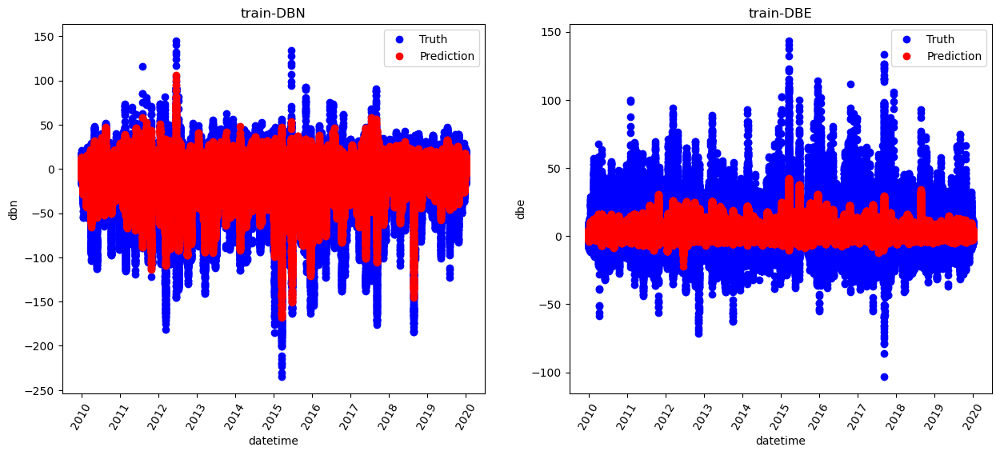

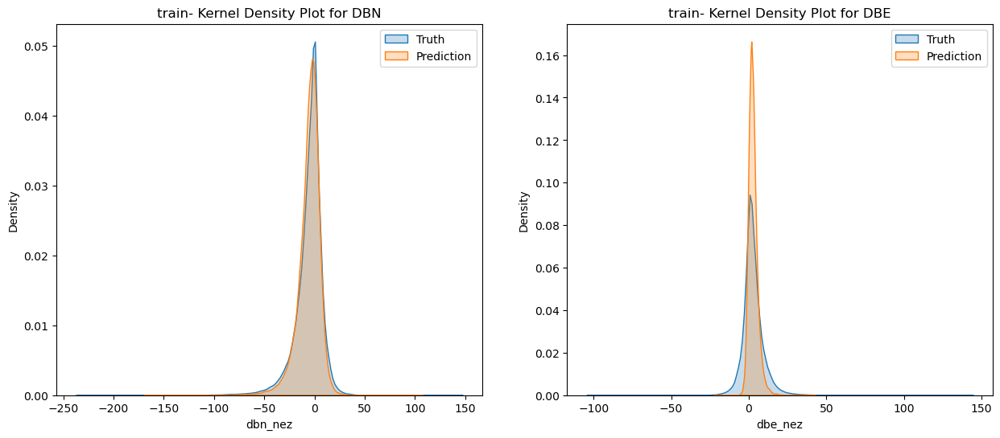

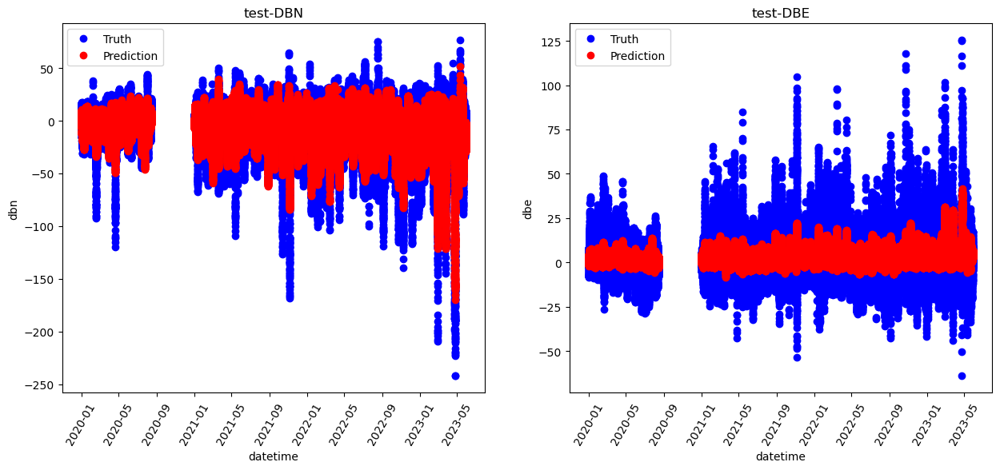

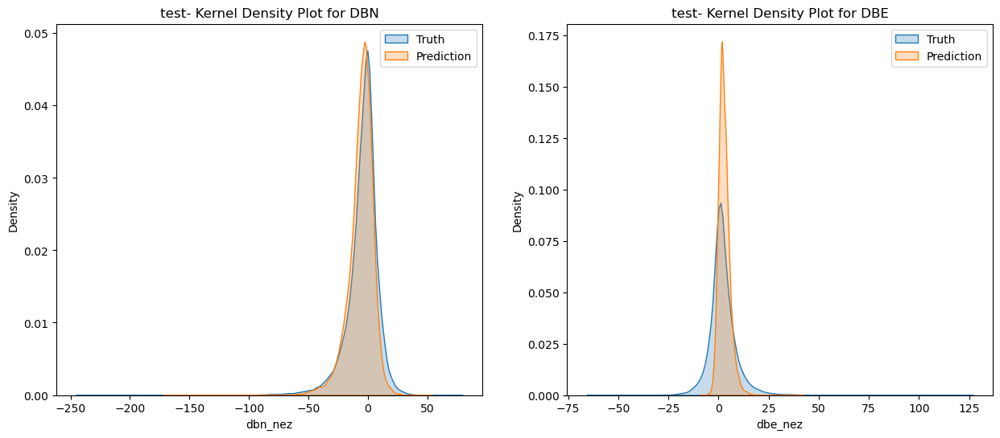

In [186]:
multi_lr, lr_y_train_pred, lr_y_test_pred = experiment(multi_lr, x_train, y_train, x_test, y_test, "multi_lr")
metric_visualization(lr_y_train_pred,
                     lr_y_test_pred,
                     train_sample=train_dataset_subsample,
                     test_sample=test_dataset_subsample,
                     y_train=y_train,
                     y_test=y_test)

multi_lr metrics:
Train MSE: [35.45740631 29.35966435]
Train MAE: [23.50140097 20.39611836]
Test MSE: [23.21294694 25.32445307]
Test MAE: [17.44777908 15.70560161]


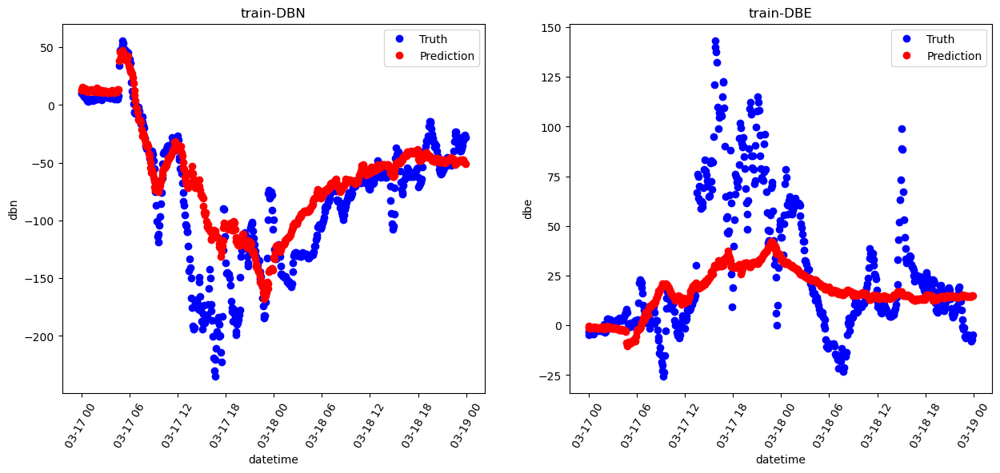

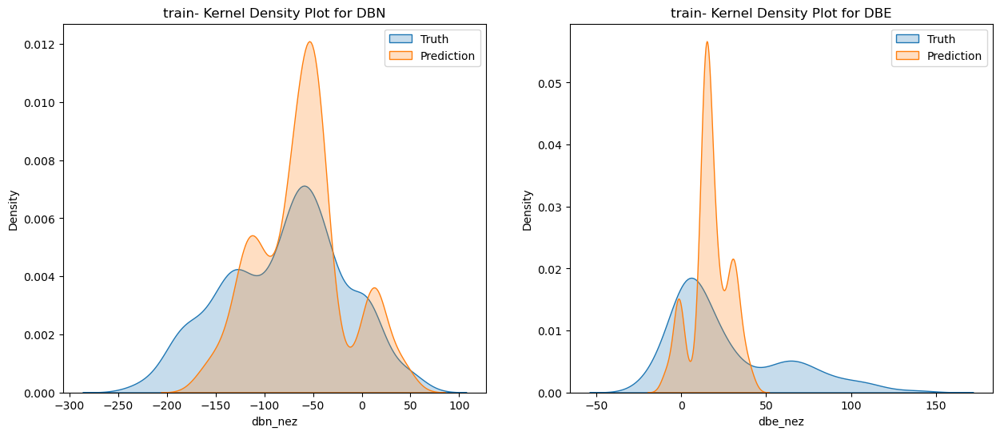

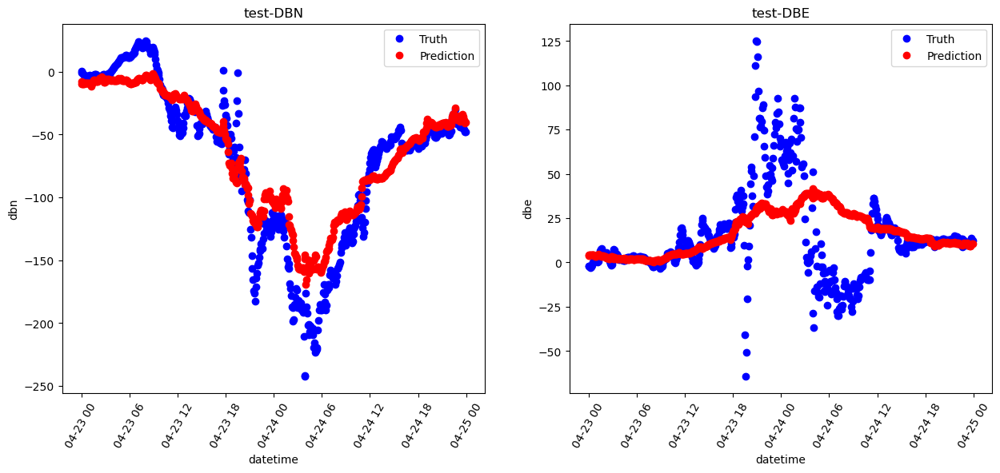

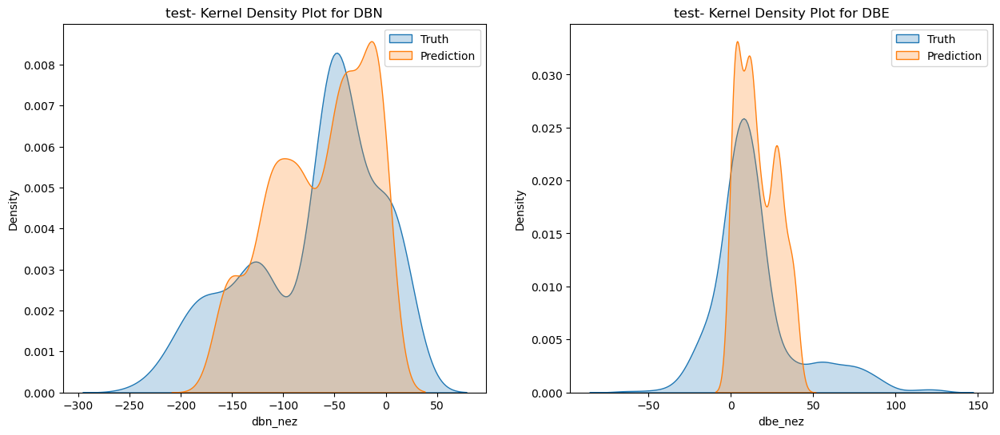

In [187]:
multi_lr, lr_two_days_y_train_pred, lr_two_days_y_test_pred = experiment(multi_lr, two_days_x_train, two_days_y_train, two_days_x_test, two_days_y_test, "multi_lr")
metric_visualization(
        lr_two_days_y_train_pred,
        lr_two_days_y_test_pred,
        targets=["dbn_nez", "dbe_nez"],
        train_sample=two_days_train_data,
        test_sample=two_days_test_data,
        y_train=two_days_y_train,
        y_test=two_days_y_test)

multi_lr metrics:
Train MSE: [85.43509765 57.31383304]
Train MAE: [79.64385037 49.55510937]
Test MSE: [46.46157969 42.68064367]
Test MAE: [42.93910787 39.74311821]


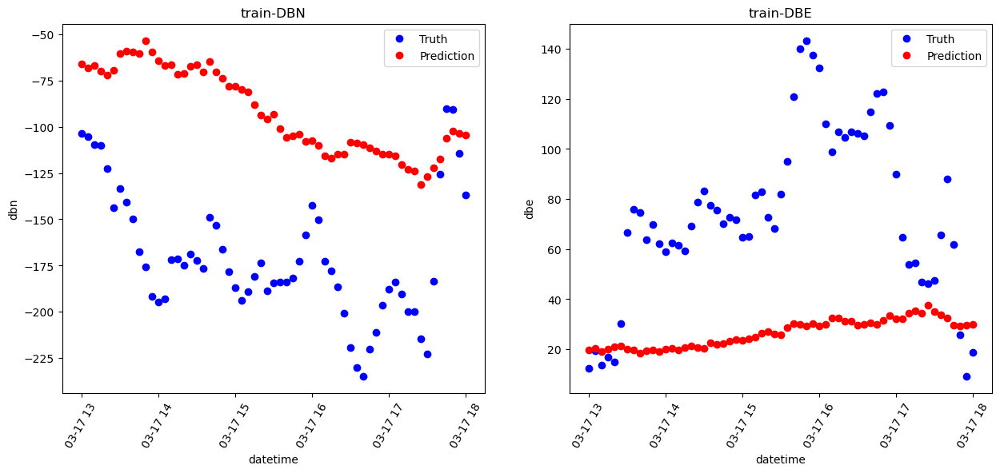

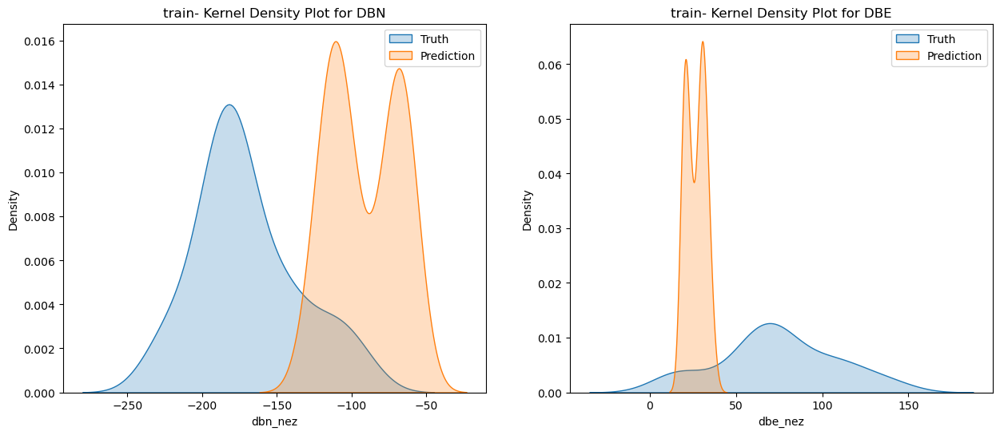

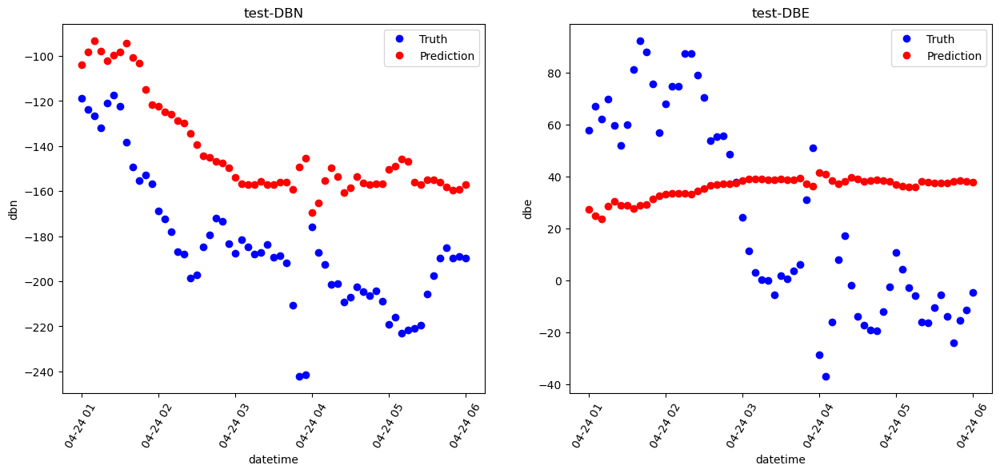

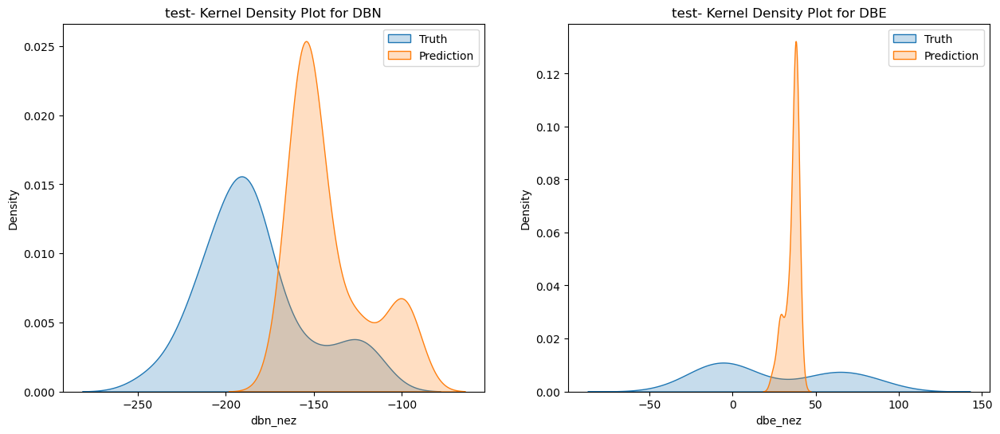

In [188]:
multi_lr, lr_hours_y_train_pred, lr_hours_y_test_pred = experiment(multi_lr, hours_x_train, hours_y_train, hours_x_test, hours_y_test, "multi_lr")
metric_visualization(
        lr_hours_y_train_pred,
        lr_hours_y_test_pred,
        targets=["dbn_nez", "dbe_nez"],
        train_sample=hours_train_data,
        test_sample=hours_test_data,
        y_train=hours_y_train,
        y_test=hours_y_test)

In [139]:
y_true = np.array([[0.5, 1],[-1, 1],[7, -6]])
y_pred = np.array([[0, 2],[-1, 2],[8, -5]])

mse(y_true[:,1], y_pred[:,1], multioutput='raw_values')

array([1.])

##### Historical Data

multi_lr metrics:
Train MSE: [8.39908424 6.46115283]
Train MAE: [5.72549555 4.32792463]
Test MSE: [8.23806875 6.51463338]
Test MAE: [5.7541146  4.43181999]


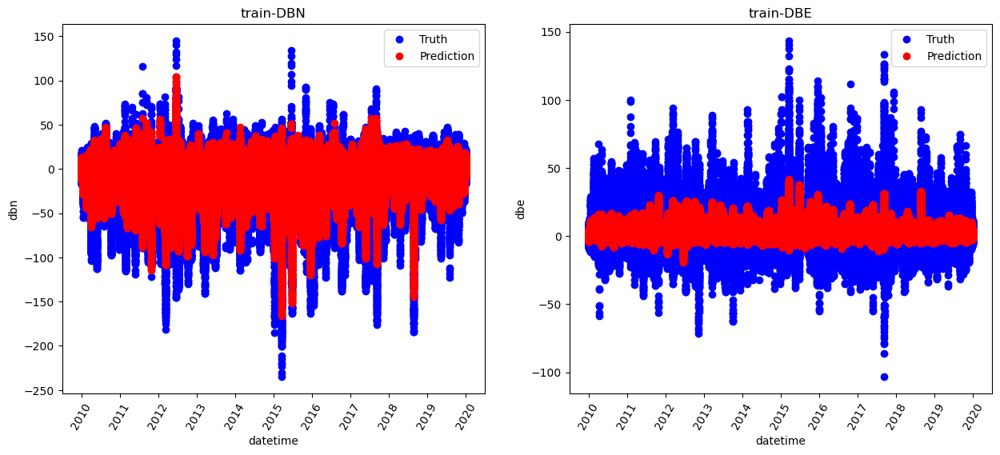

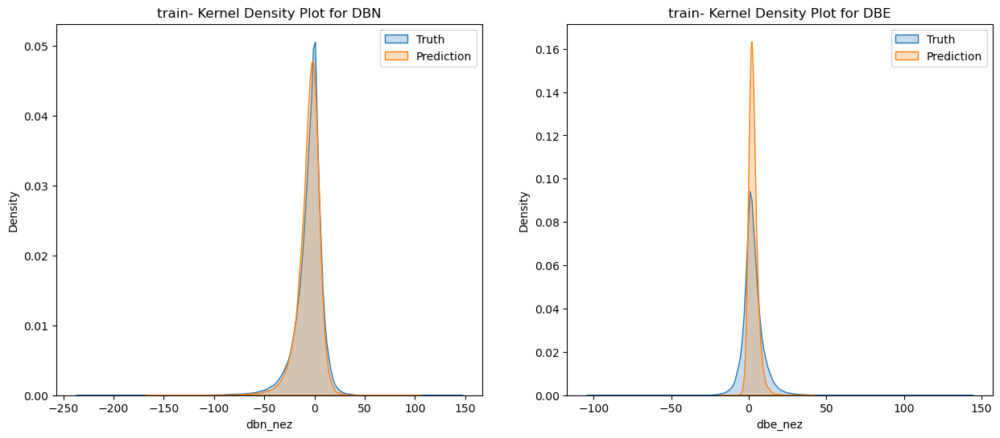

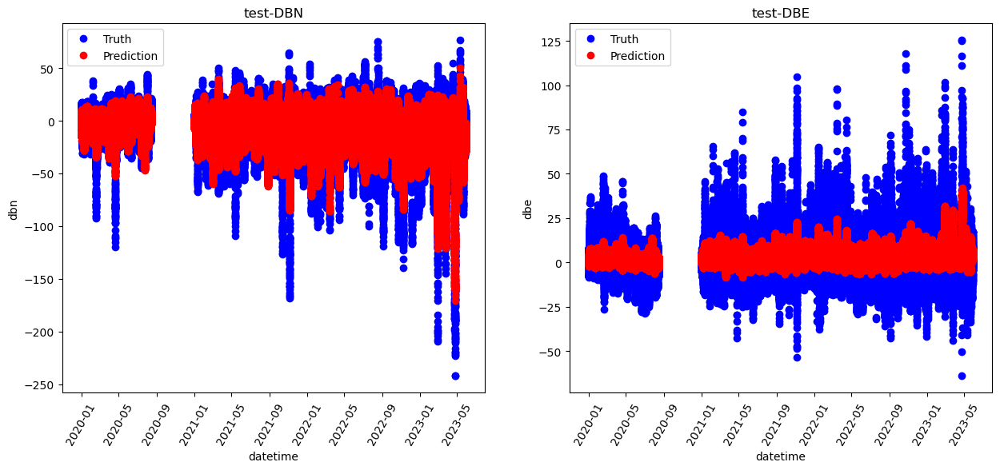

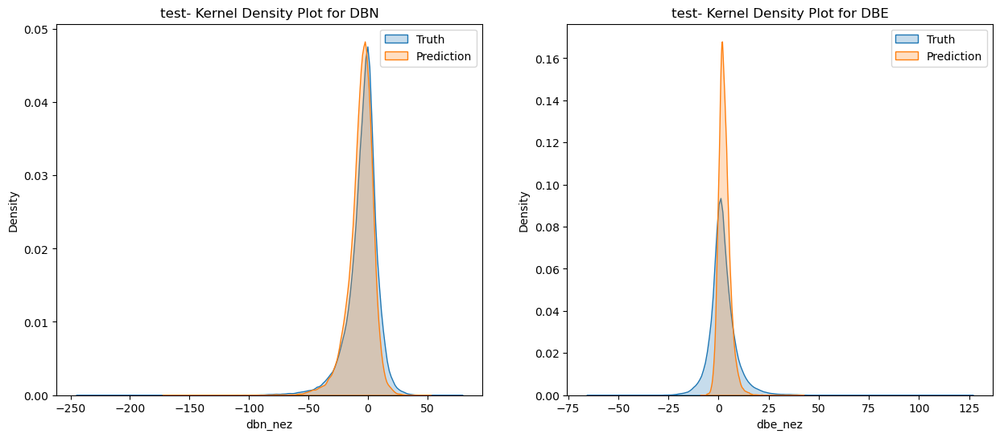

In [221]:
multi_lr, lr_y_train_pred, lr_y_test_pred = experiment(multi_lr, x_train, y_train, x_test, y_test, "multi_lr")
metric_visualization(lr_y_train_pred,
                     lr_y_test_pred,
                     train_sample=train_dataset_subsample,
                     test_sample=test_dataset_subsample,
                     y_train=y_train,
                     y_test=y_test)

multi_lr metrics:
Train MSE: [35.65114466 29.44049465]
Train MAE: [23.91923559 20.4432714 ]
Test MSE: [23.35730434 25.59224497]
Test MAE: [17.93128451 15.94906801]


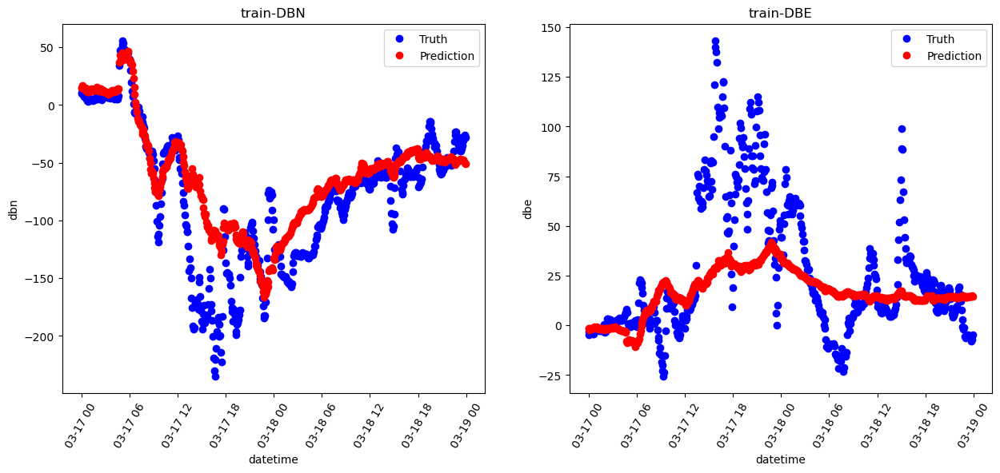

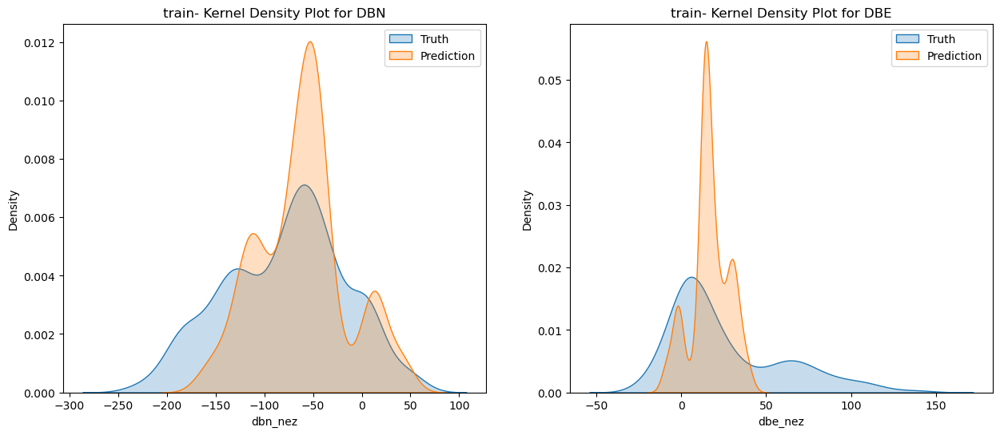

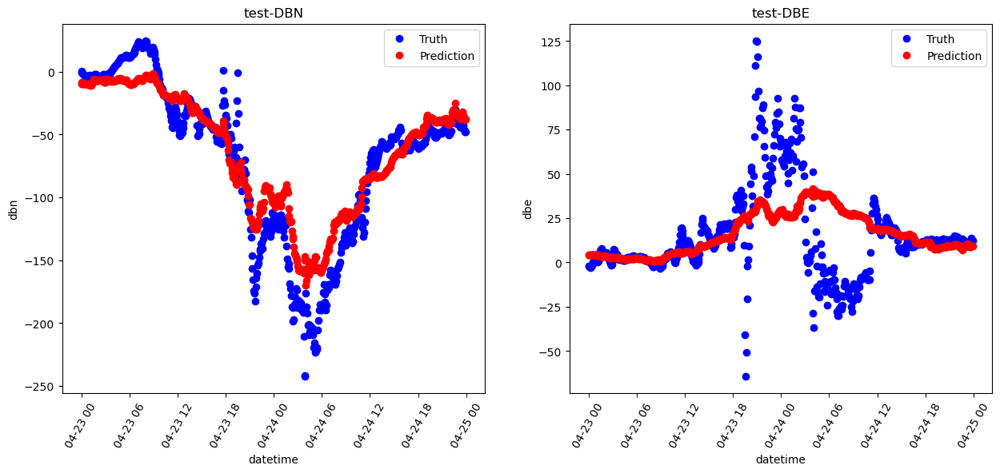

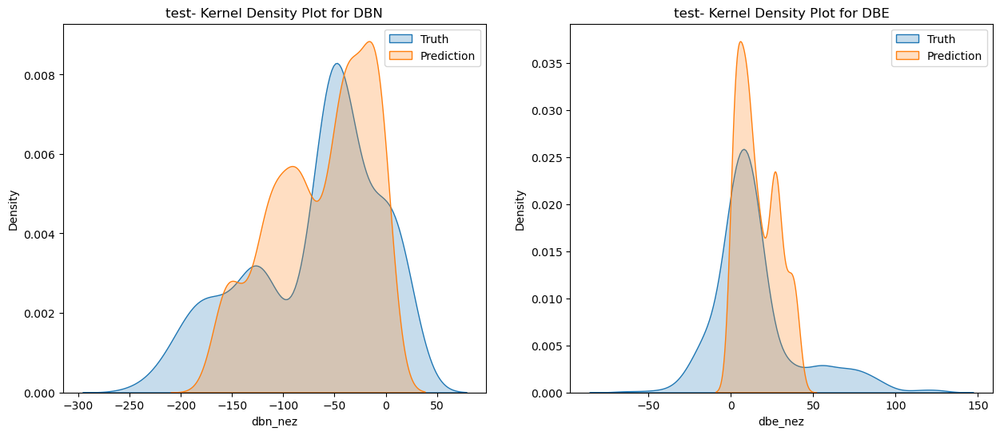

In [222]:
multi_lr, lr_two_days_y_train_pred, lr_two_days_y_test_pred = experiment(multi_lr, two_days_x_train, two_days_y_train, two_days_x_test, two_days_y_test, "multi_lr")
metric_visualization(
        lr_two_days_y_train_pred,
        lr_two_days_y_test_pred,
        targets=["dbn_nez", "dbe_nez"],
        train_sample=two_days_train_data,
        test_sample=two_days_test_data,
        y_train=two_days_y_train,
        y_test=two_days_y_test)

multi_lr metrics:
Train MSE: [85.12209416 57.23070046]
Train MAE: [79.38368253 49.49266701]
Test MSE: [46.83378956 43.48464862]
Test MAE: [43.37715004 40.53018573]


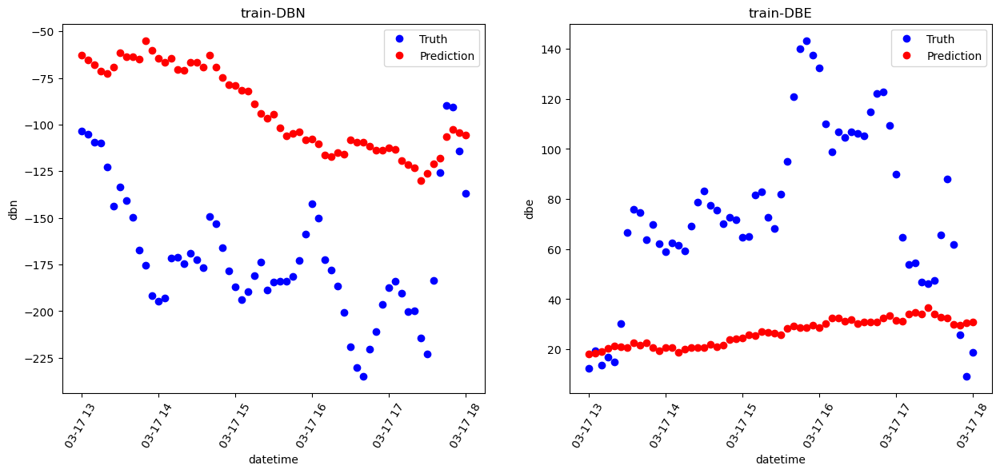

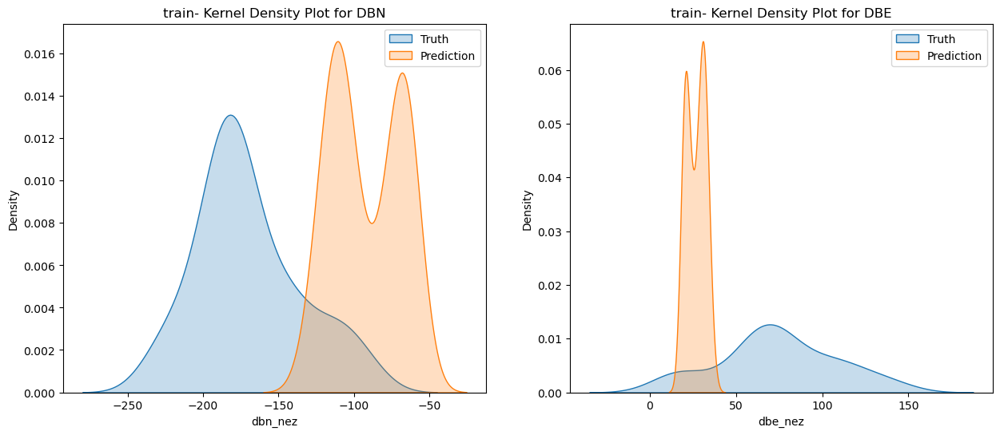

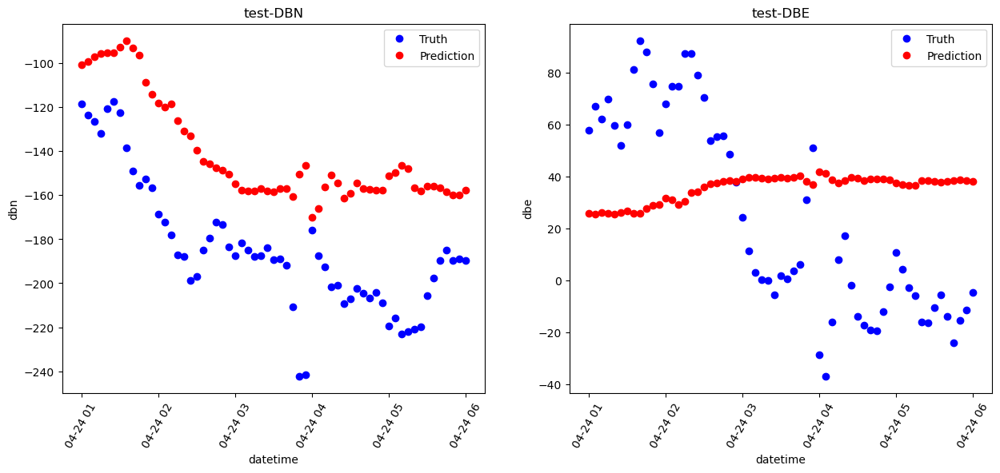

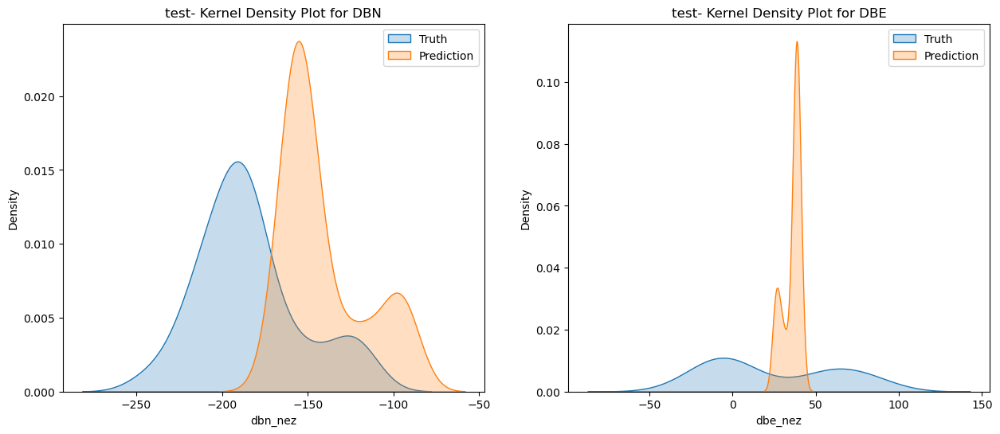

In [223]:
multi_lr, lr_hours_y_train_pred, lr_hours_y_test_pred = experiment(multi_lr, hours_x_train, hours_y_train, hours_x_test, hours_y_test, "multi_lr")
metric_visualization(
        lr_hours_y_train_pred,
        lr_hours_y_test_pred,
        targets=["dbn_nez", "dbe_nez"],
        train_sample=hours_train_data,
        test_sample=hours_test_data,
        y_train=hours_y_train,
        y_test=hours_y_test)

### RANDOM FOREST

In [189]:
from sklearn.ensemble import RandomForestRegressor

max_depth = 30
regr_rf = RandomForestRegressor(n_estimators=100, max_depth=max_depth, random_state=2)
regr_rf.fit(x_train, y_train)

RandomForestRegressor(max_depth=30, random_state=2)

##### Old Features

regression_rf metrics:
Train MSE: [1.24991633 1.08097603]
Train MAE: [0.74774826 0.63900194]
Test MSE: [8.00972017 6.14506778]
Test MAE: [5.63103744 4.21974   ]


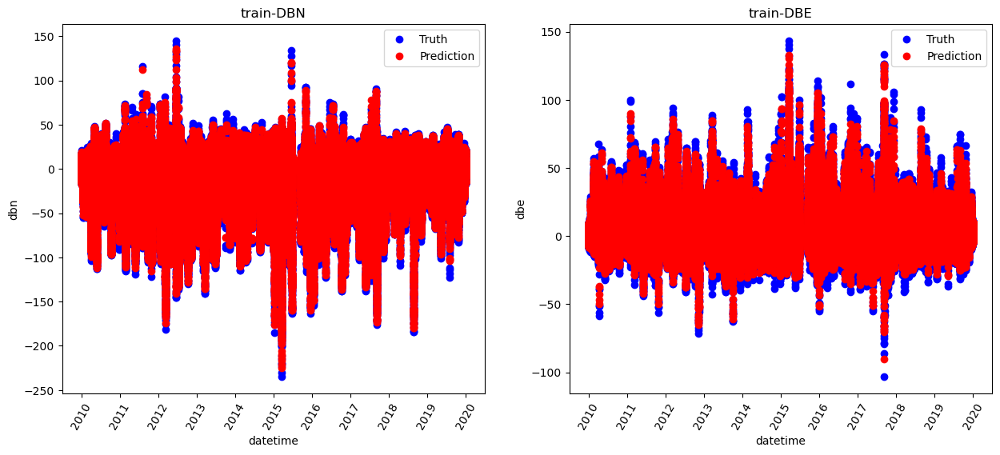

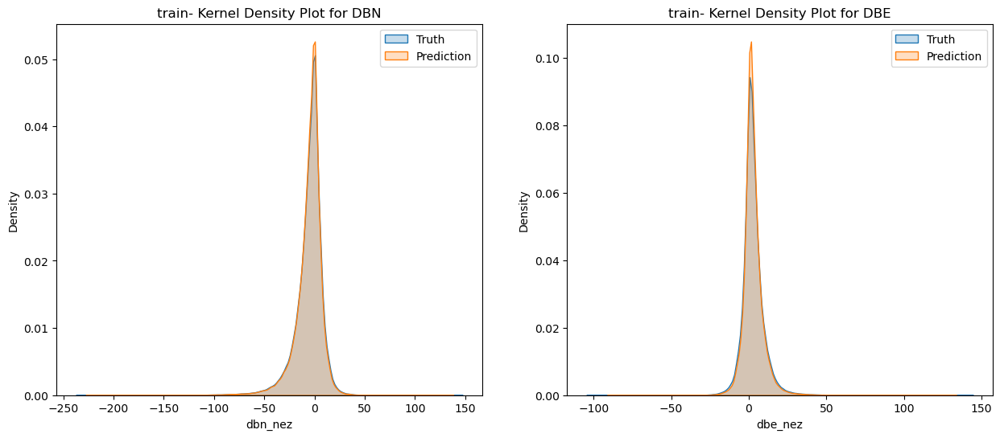

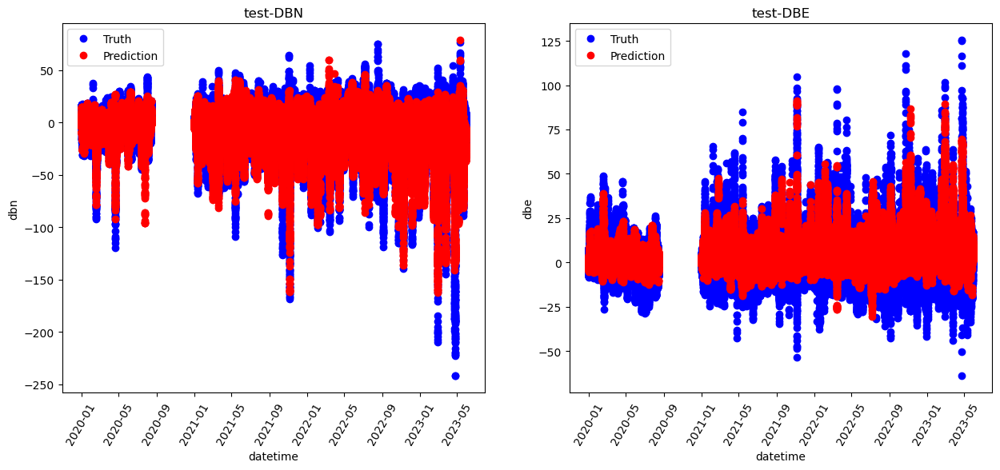

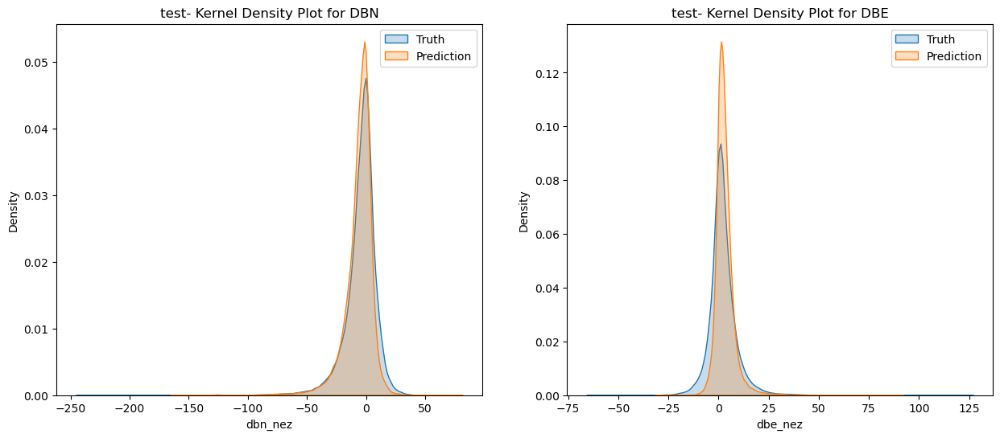

In [190]:
regr_rf, rf_y_train_pred, rf_y_test_pred = experiment(regr_rf, x_train, y_train, x_test, y_test, "regression_rf")
metric_visualization(rf_y_train_pred,
                     rf_y_test_pred,
                     train_sample=train_dataset_subsample,
                     test_sample=test_dataset_subsample,
                     y_train=y_train,
                     y_test=y_test)


regr_rf metrics:
Train MSE: [3.74044422 3.36589716]
Train MAE: [2.31607146 2.14852534]
Test MSE: [31.13486225 26.30561391]
Test MAE: [22.06959319 17.32676771]


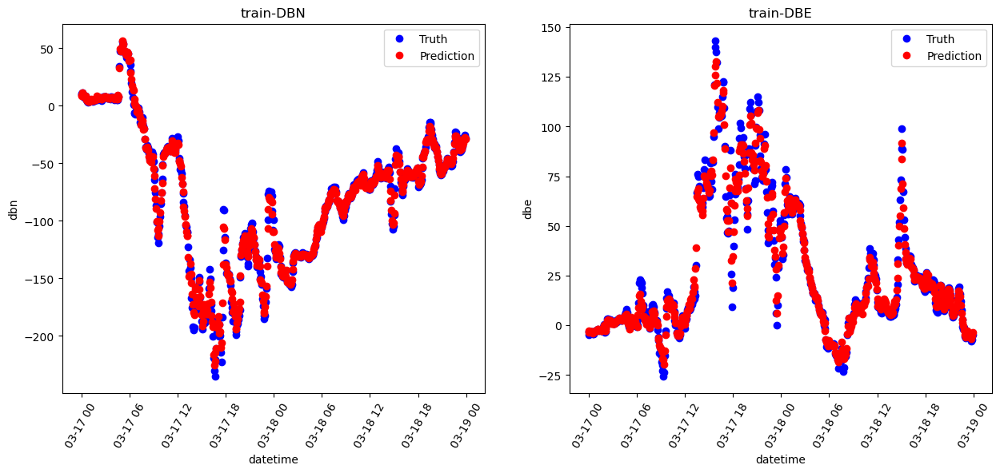

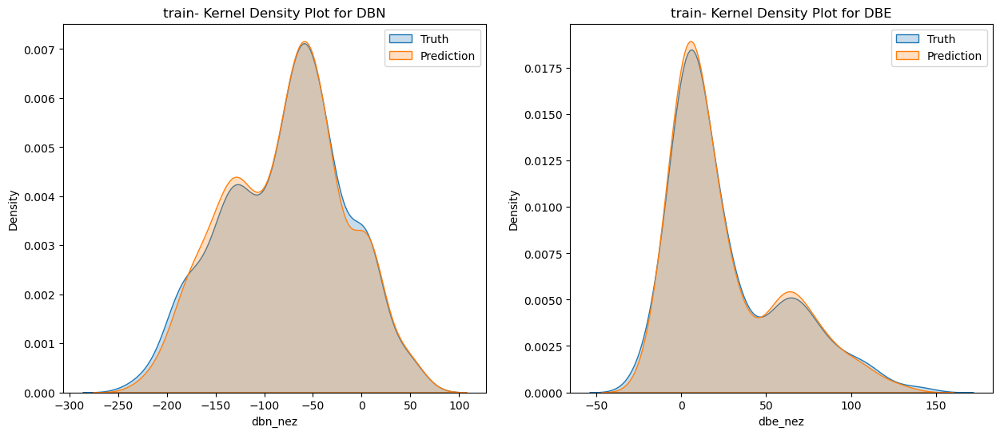

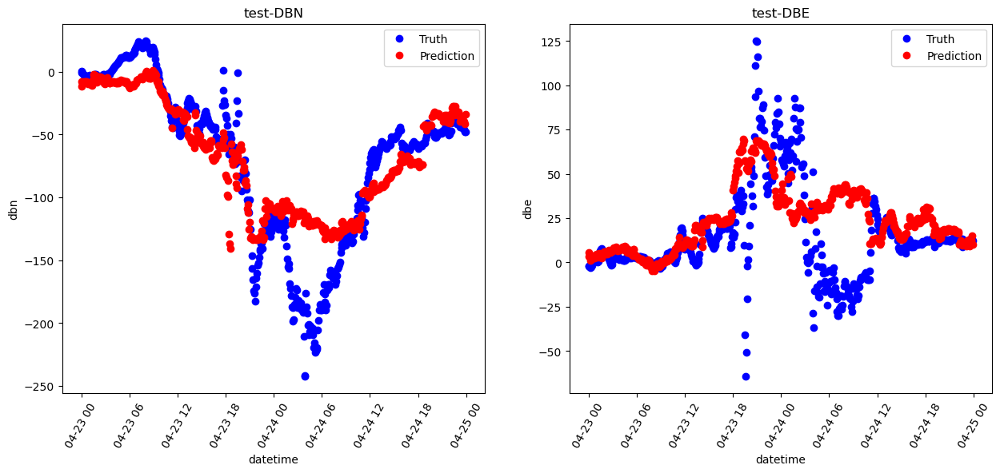

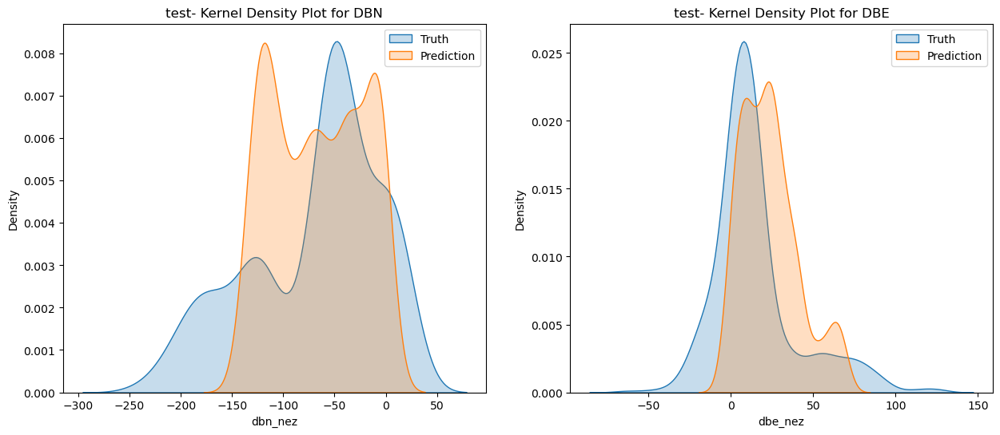

In [193]:
regr_rf, regr_rf_two_days_y_train_pred, regr_rf_two_days_y_test_pred = experiment(regr_rf, two_days_x_train, two_days_y_train, two_days_x_test, two_days_y_test, "regr_rf")
metric_visualization(
        regr_rf_two_days_y_train_pred,
        regr_rf_two_days_y_test_pred,
        targets=["dbn_nez", "dbe_nez"],
        train_sample=two_days_train_data,
        test_sample=two_days_test_data,
        y_train=two_days_y_train,
        y_test=two_days_y_test)

regr_rf metrics:
Train MSE: [7.99863065 6.12624121]
Train MAE: [6.2298255  4.83152909]
Test MSE: [73.72052607 38.50286754]
Test MAE: [69.13709107 35.60381507]


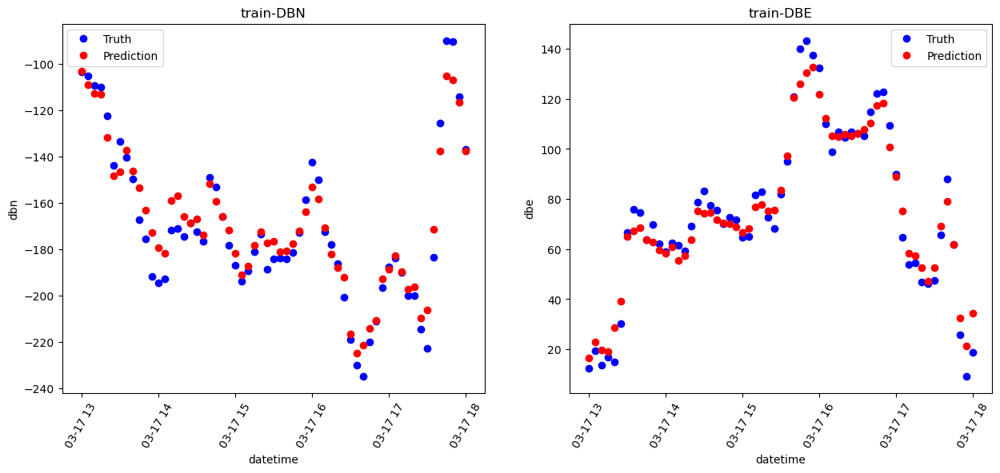

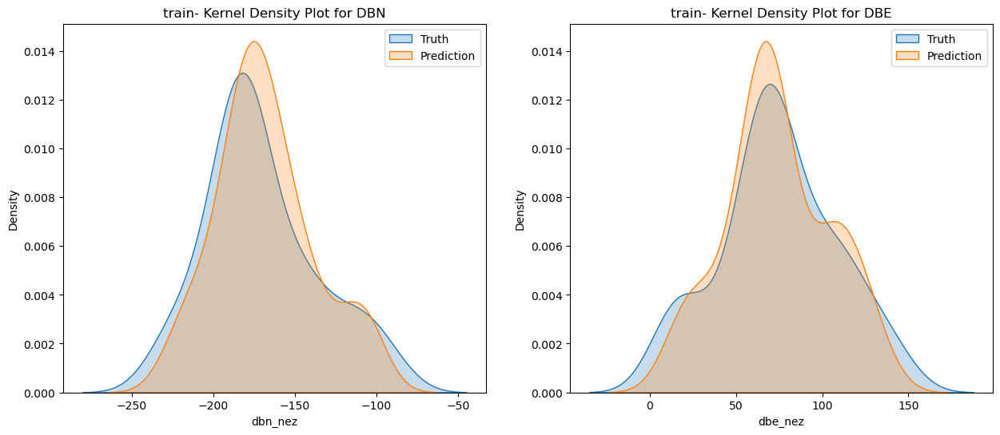

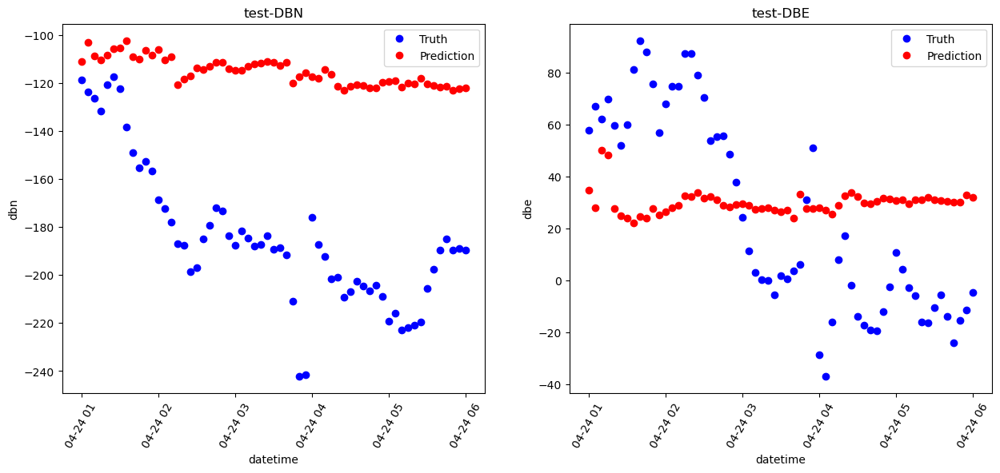

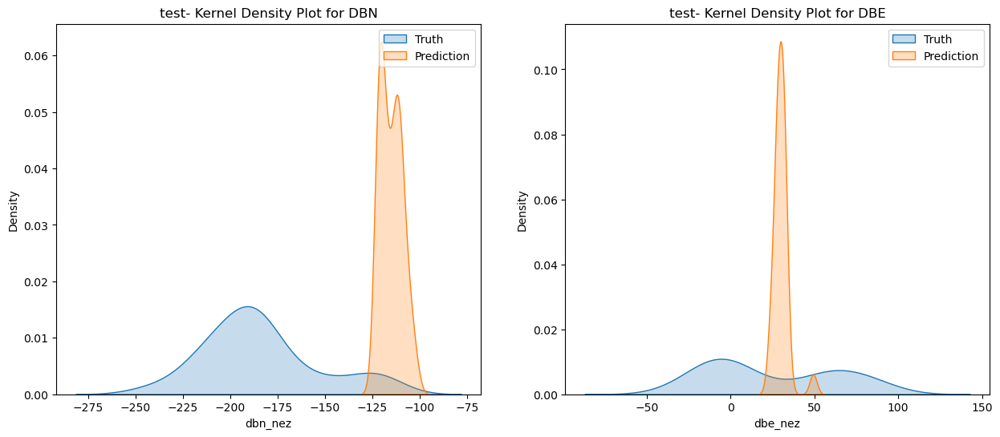

In [192]:
regr_rf, regr_rf_hours_y_train_pred, regr_rf_hours_y_test_pred = experiment(regr_rf, hours_x_train, hours_y_train, hours_x_test, hours_y_test, "regr_rf")
metric_visualization(
        regr_rf_hours_y_train_pred,
        regr_rf_hours_y_test_pred,
        targets=["dbn_nez", "dbe_nez"],
        train_sample=hours_train_data,
        test_sample=hours_test_data,
        y_train=hours_y_train,
        y_test=hours_y_test)

##### Experiments With Hyperparameters

In [195]:
from sklearn.ensemble import RandomForestRegressor

# max_depth = 30
random_state = 2
n_estimators = 100

# Experiment with different values of max_features
max_features_values = ['sqrt', 0.5, 0.8, 0.3]  # You can add more values as needed
max_depths = [15, 25, 30]
regr_rf_models = []

for max_features in max_features_values:
    for max_depth in max_depths:
        regr_rf = RandomForestRegressor(n_estimators=n_estimators, max_depth=max_depth, max_features=max_features, random_state=random_state)
        print(regr_rf)
        regr_rf.fit(x_train, y_train)
        regr_rf_models.append(regr_rf)

RandomForestRegressor(max_depth=15, max_features='sqrt', random_state=2)
RandomForestRegressor(max_depth=25, max_features='sqrt', random_state=2)
RandomForestRegressor(max_depth=30, max_features='sqrt', random_state=2)
RandomForestRegressor(max_depth=15, max_features=0.5, random_state=2)
RandomForestRegressor(max_depth=25, max_features=0.5, random_state=2)
RandomForestRegressor(max_depth=30, max_features=0.5, random_state=2)
RandomForestRegressor(max_depth=15, max_features=0.8, random_state=2)
RandomForestRegressor(max_depth=25, max_features=0.8, random_state=2)
RandomForestRegressor(max_depth=30, max_features=0.8, random_state=2)
RandomForestRegressor(max_depth=15, max_features=0.3, random_state=2)
RandomForestRegressor(max_depth=25, max_features=0.3, random_state=2)
RandomForestRegressor(max_depth=30, max_features=0.3, random_state=2)


RandomForestRegressor(max_depth=15, max_features='sqrt', random_state=2) metrics:
Train MSE: [5.30864174 4.51824975]
Train MAE: [3.92048139 3.19315589]
Test MSE: [7.78241886 5.90096673]
Test MAE: [5.44179341 4.05292575]


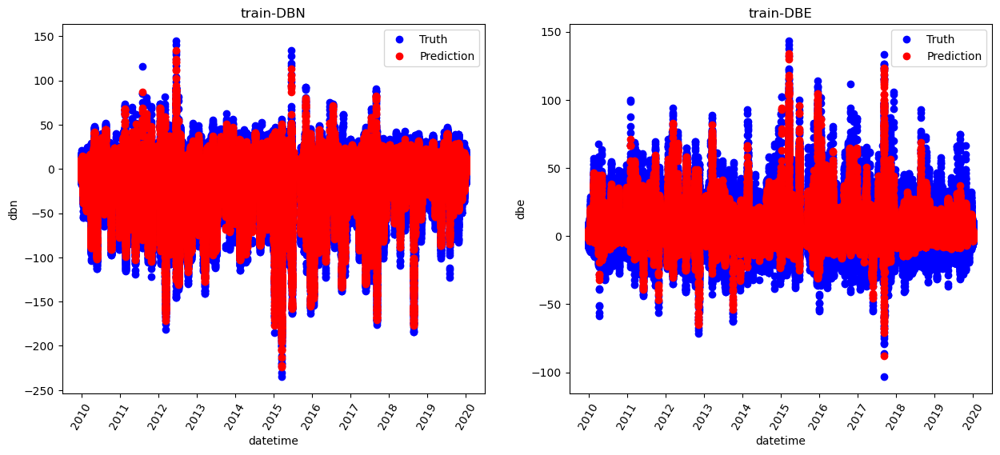

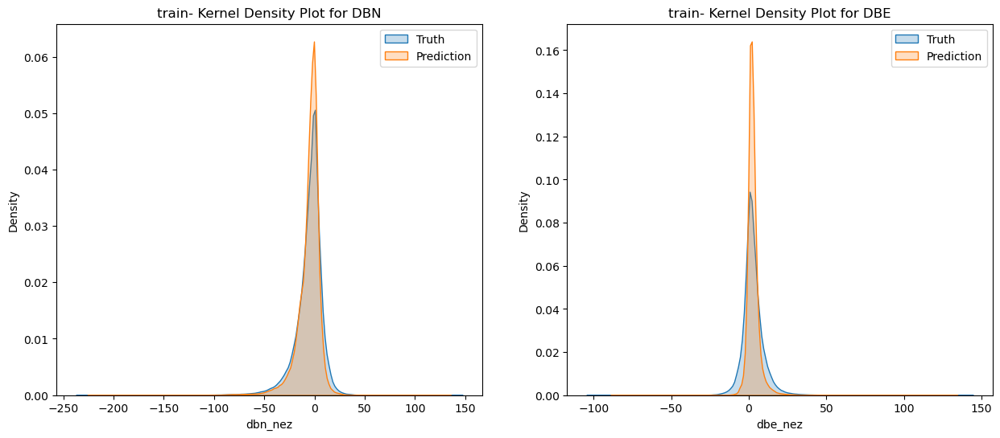

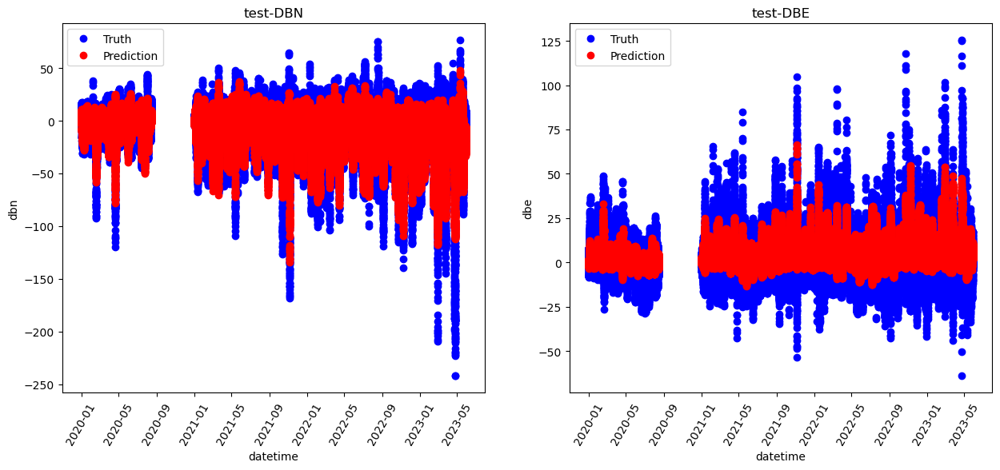

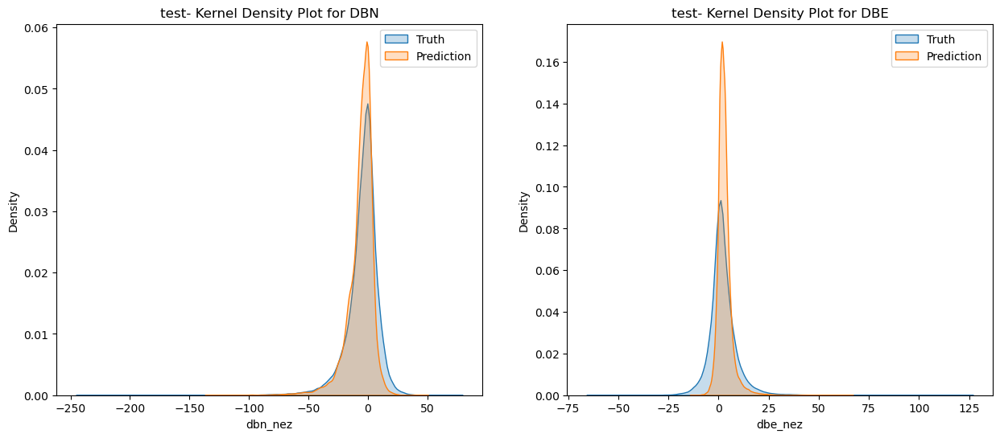

RandomForestRegressor(max_depth=25, max_features='sqrt', random_state=2) metrics:
Train MSE: [1.6923483  1.48058828]
Train MAE: [1.18489723 1.02111108]
Test MSE: [7.82803697 5.90813028]
Test MAE: [5.48929018 4.07330955]


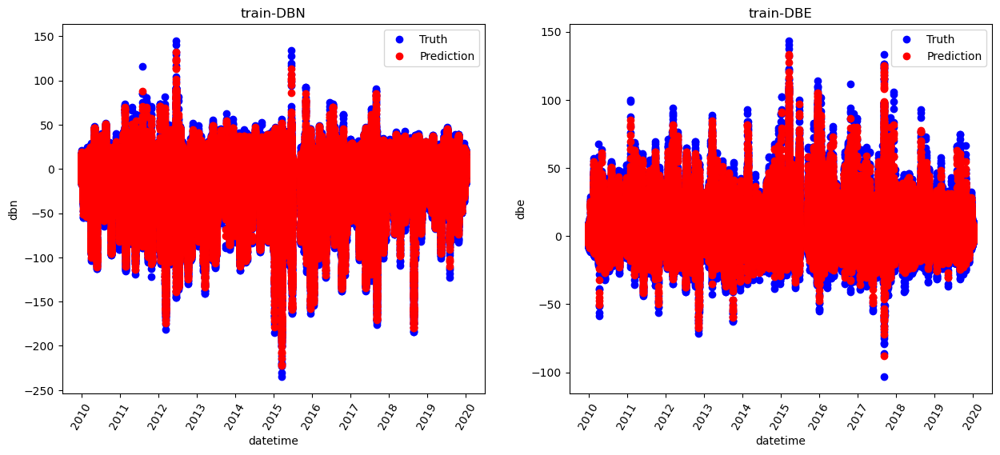

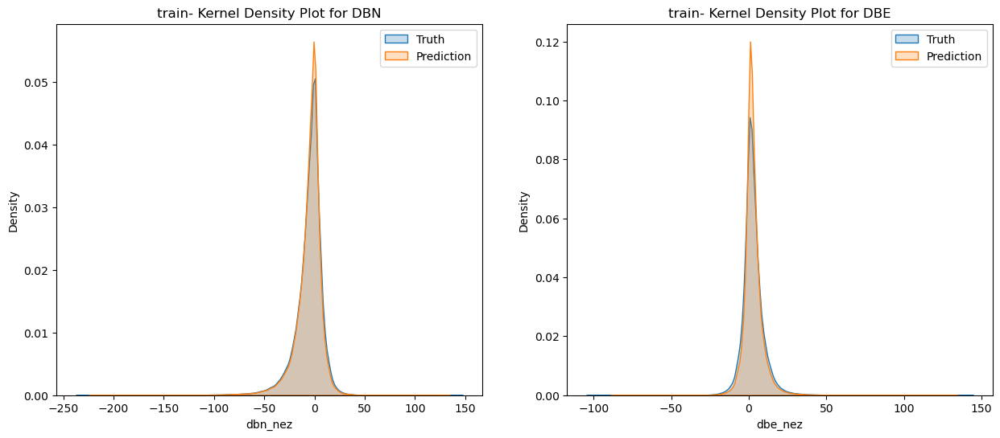

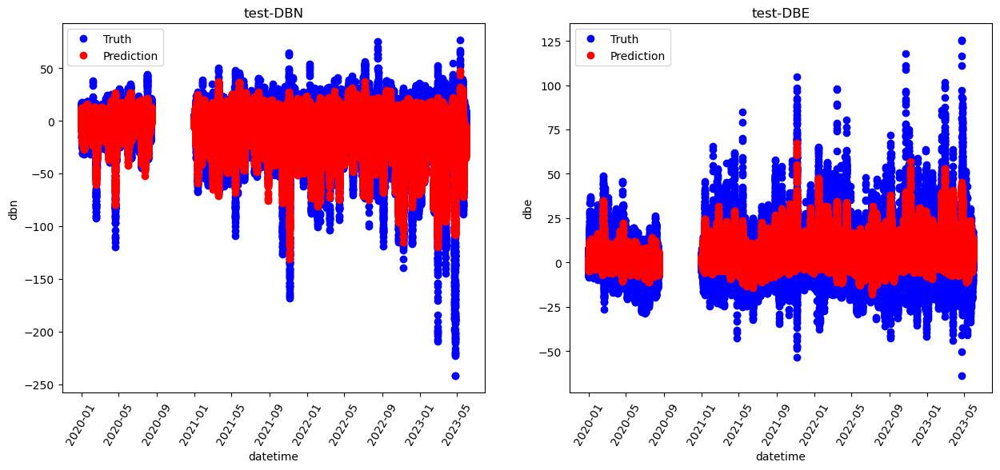

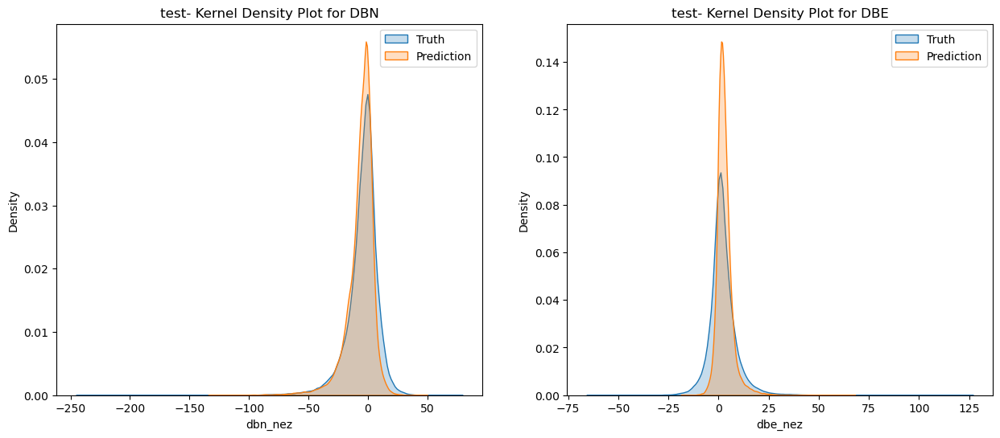

RandomForestRegressor(max_depth=30, max_features='sqrt', random_state=2) metrics:
Train MSE: [1.19395609 1.02023036]
Train MAE: [0.74977486 0.63260166]
Test MSE: [7.82108691 5.91381177]
Test MAE: [5.49415786 4.08382863]


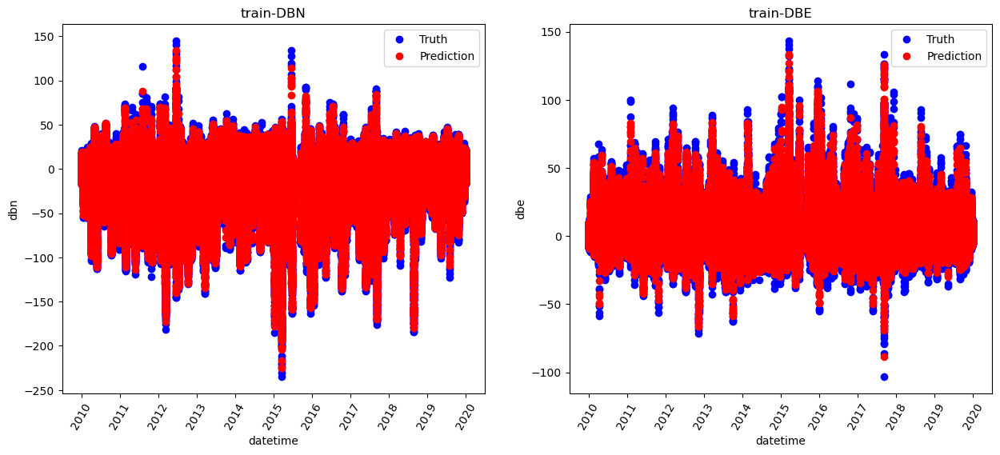

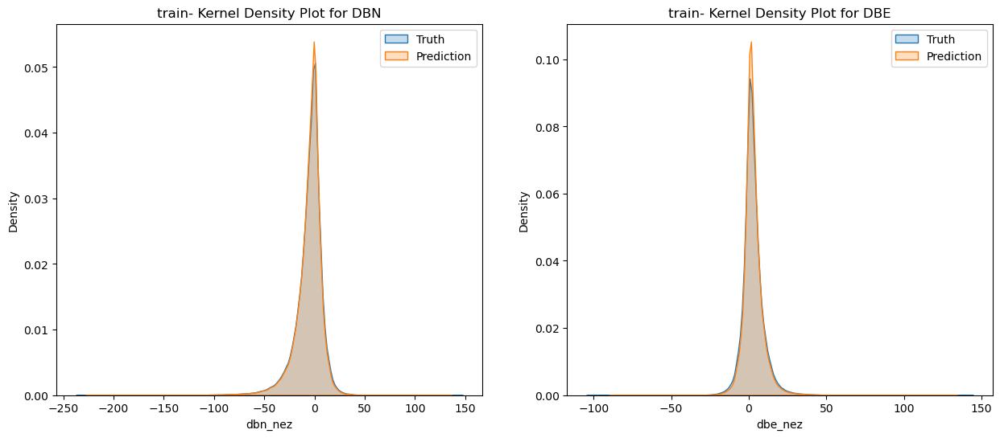

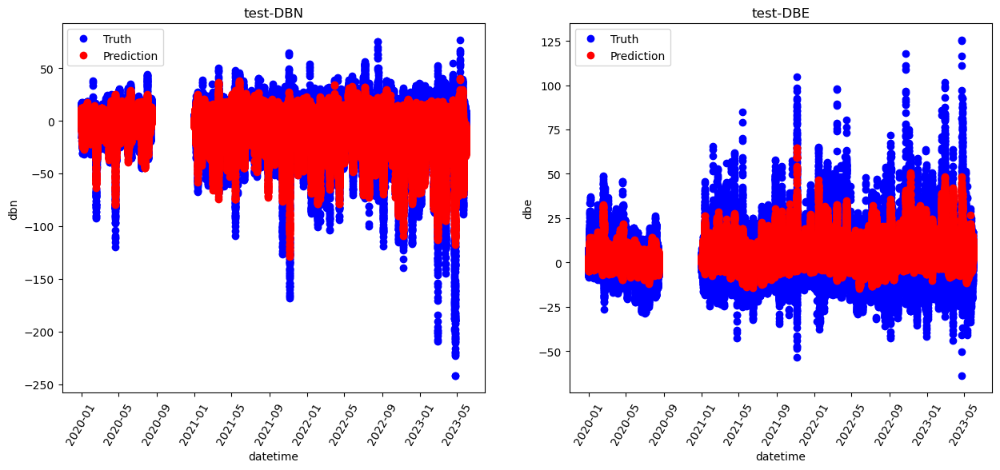

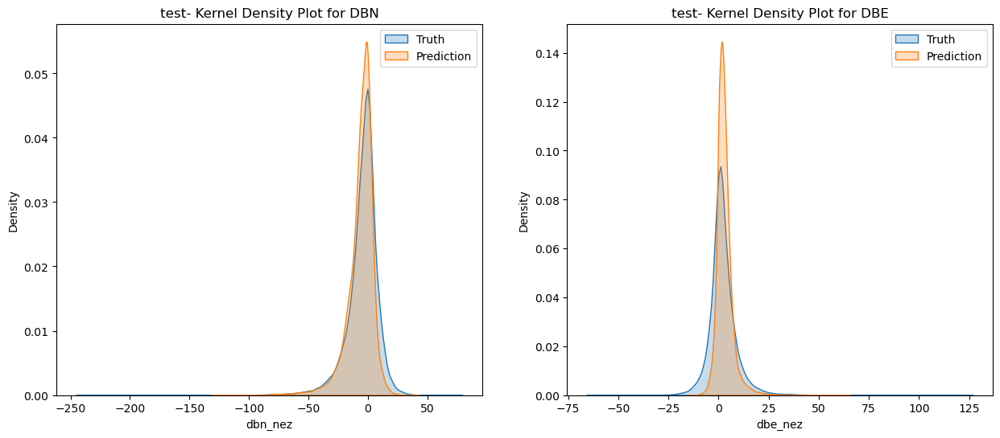

RandomForestRegressor(max_depth=15, max_features=0.5, random_state=2) metrics:
Train MSE: [5.03520889 4.31577178]
Train MAE: [3.70841851 3.05099046]
Test MSE: [7.69483076 5.87710586]
Test MAE: [5.40262243 4.04448623]


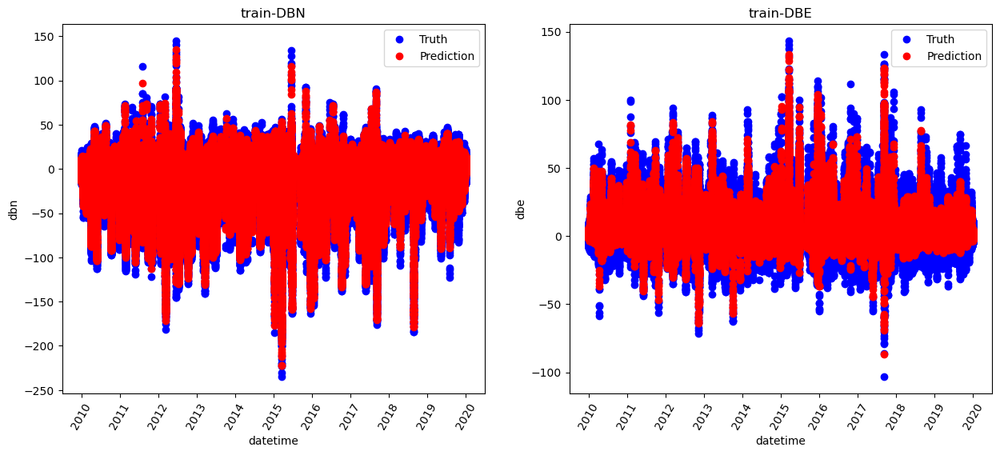

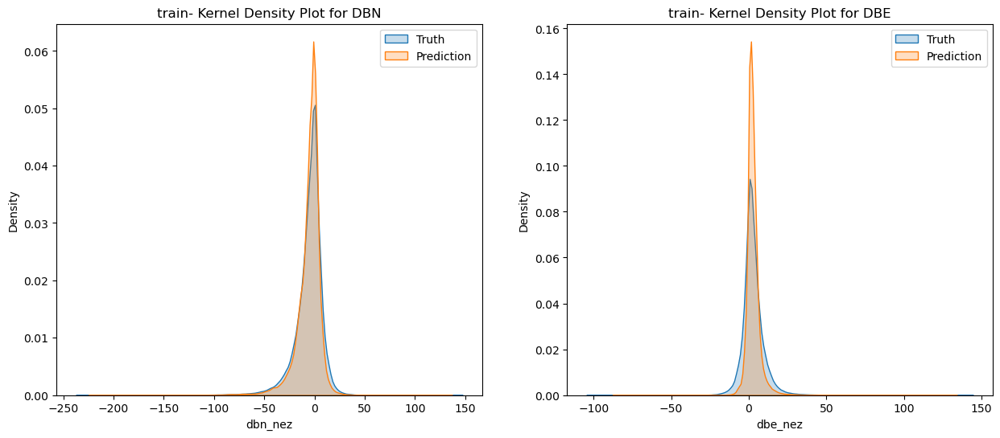

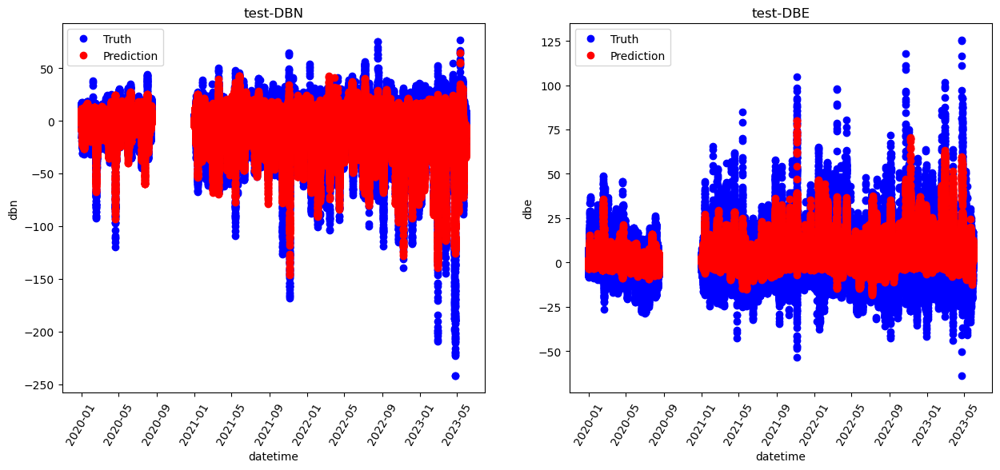

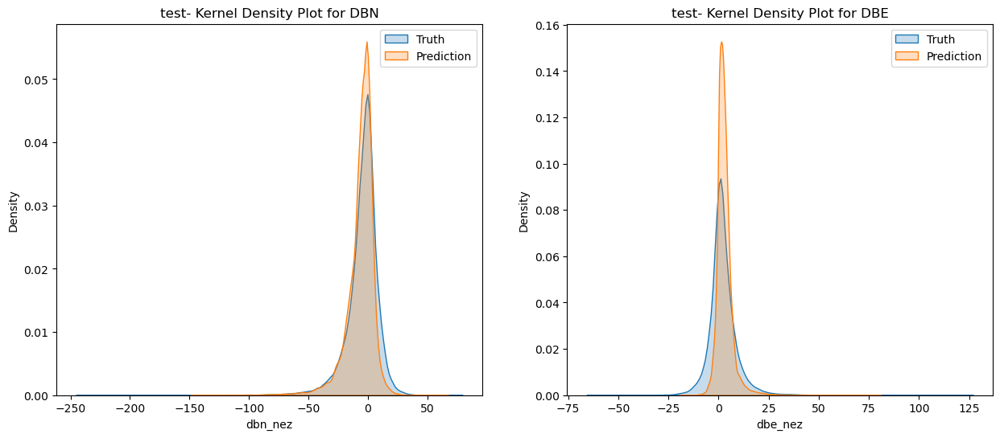

RandomForestRegressor(max_depth=25, max_features=0.5, random_state=2) metrics:
Train MSE: [1.58580273 1.39504098]
Train MAE: [1.08434322 0.94139522]
Test MSE: [7.78829314 5.93579792]
Test MAE: [5.49362361 4.10502187]


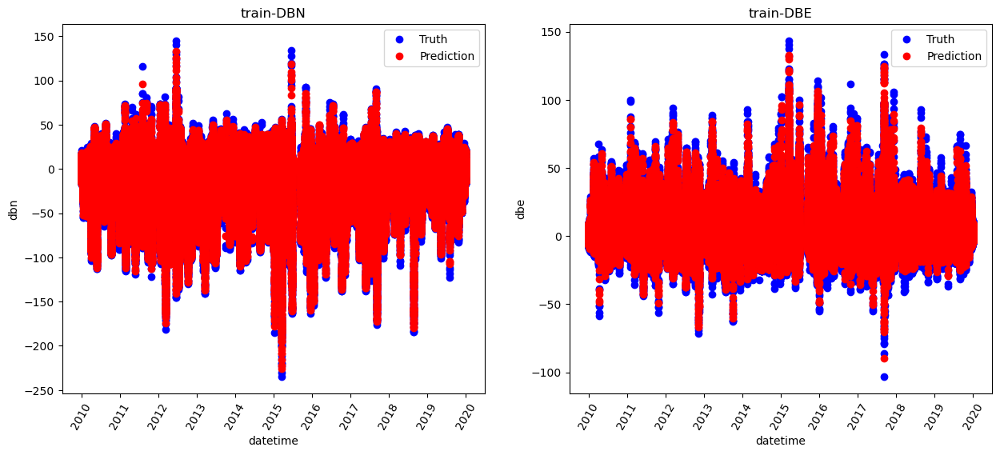

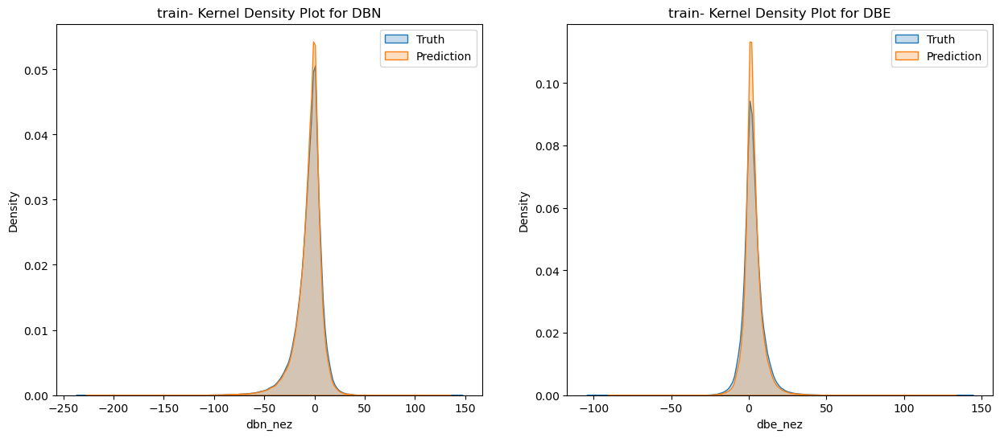

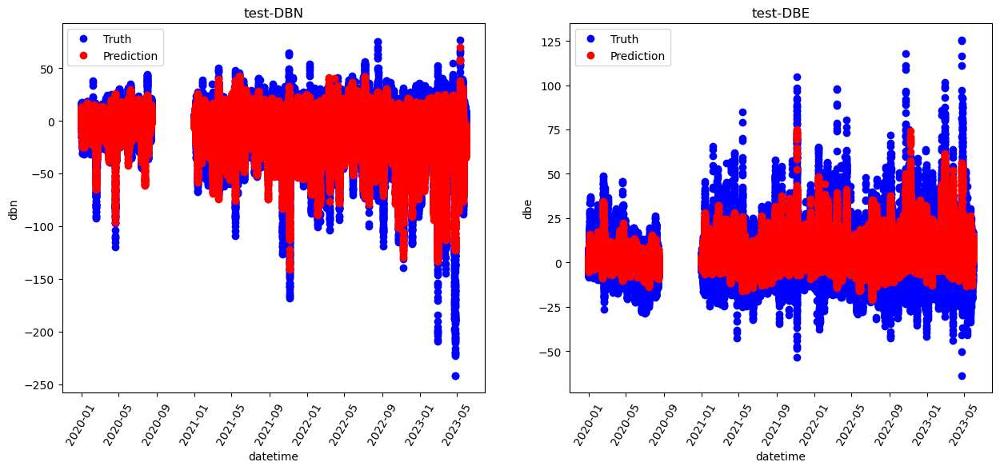

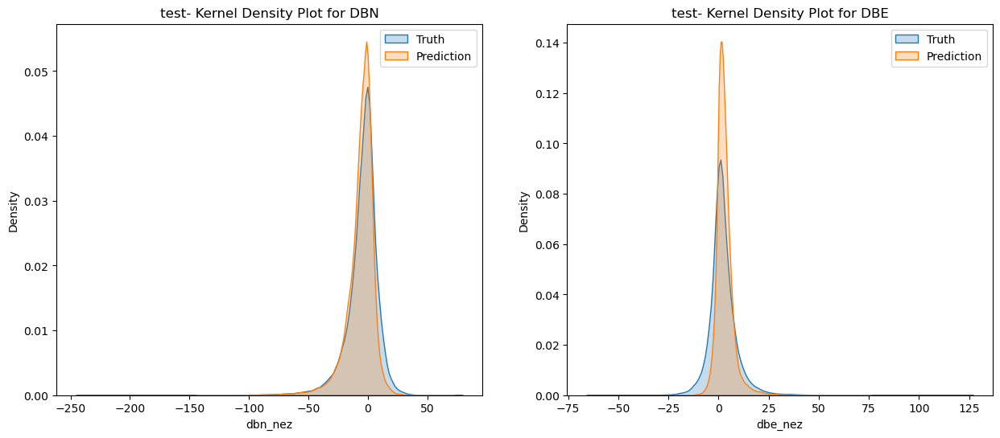

RandomForestRegressor(max_depth=30, max_features=0.5, random_state=2) metrics:
Train MSE: [1.14986231 0.99375743]
Train MAE: [0.70383791 0.60074466]
Test MSE: [7.80427371 5.94935359]
Test MAE: [5.51245927 4.11880869]


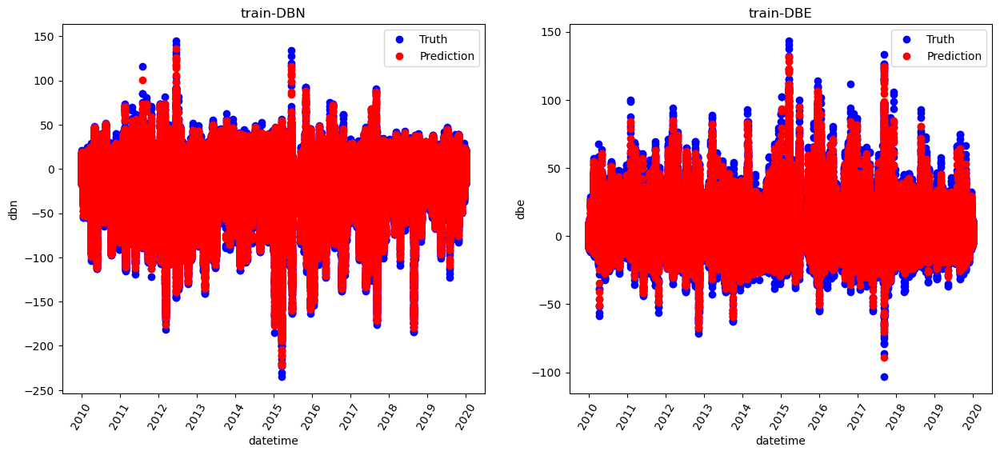

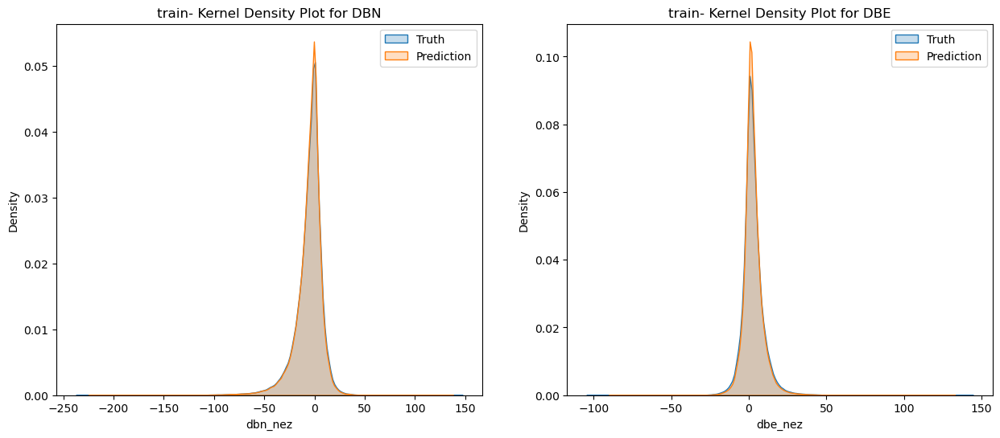

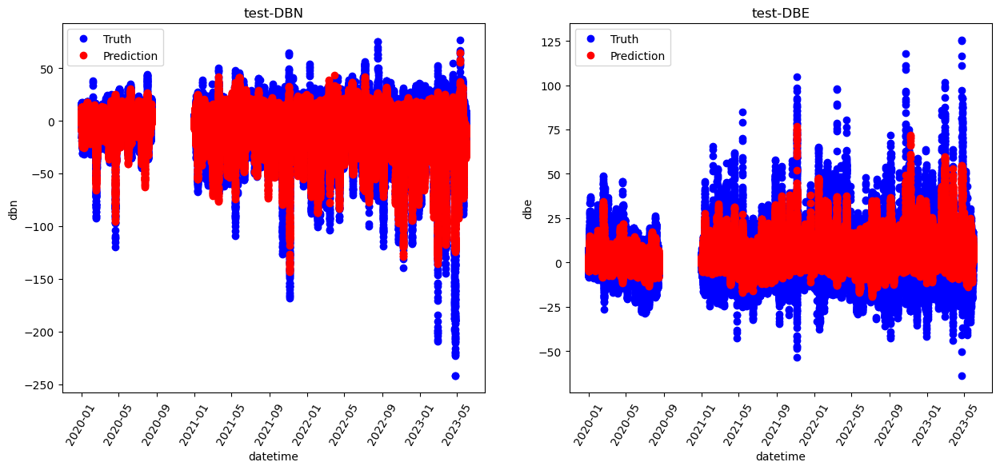

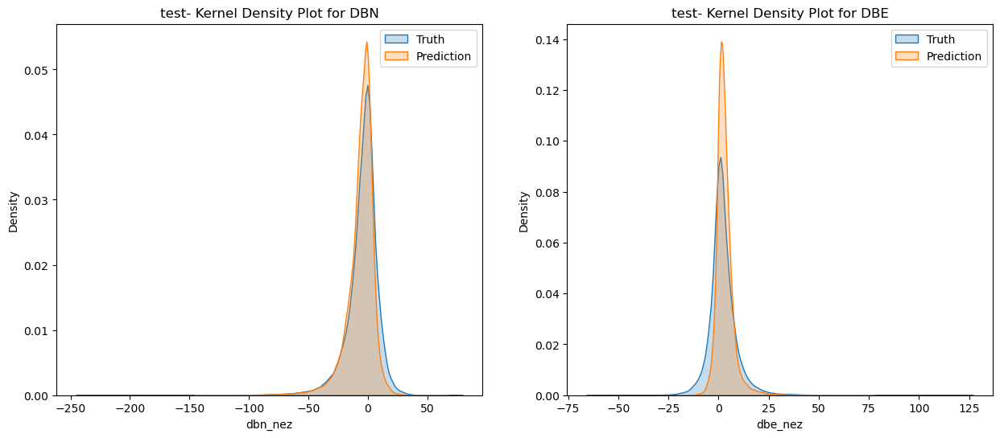

RandomForestRegressor(max_depth=15, max_features=0.8, random_state=2) metrics:
Train MSE: [5.02184007 4.30755539]
Train MAE: [3.67833459 3.03126488]
Test MSE: [7.74270298 5.92358456]
Test MAE: [5.43098043 4.06355088]


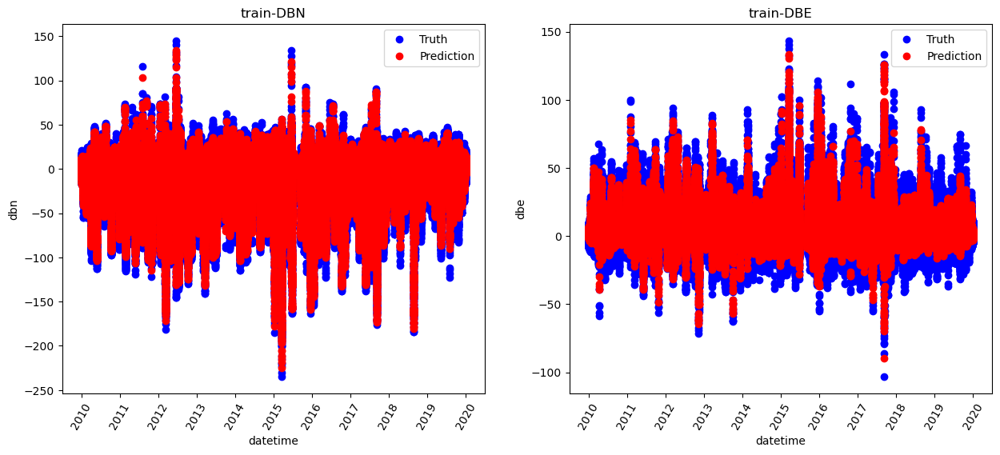

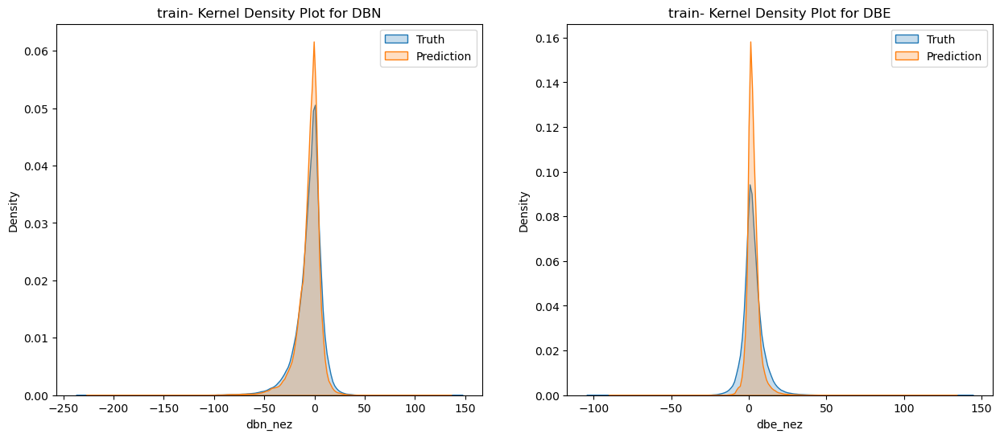

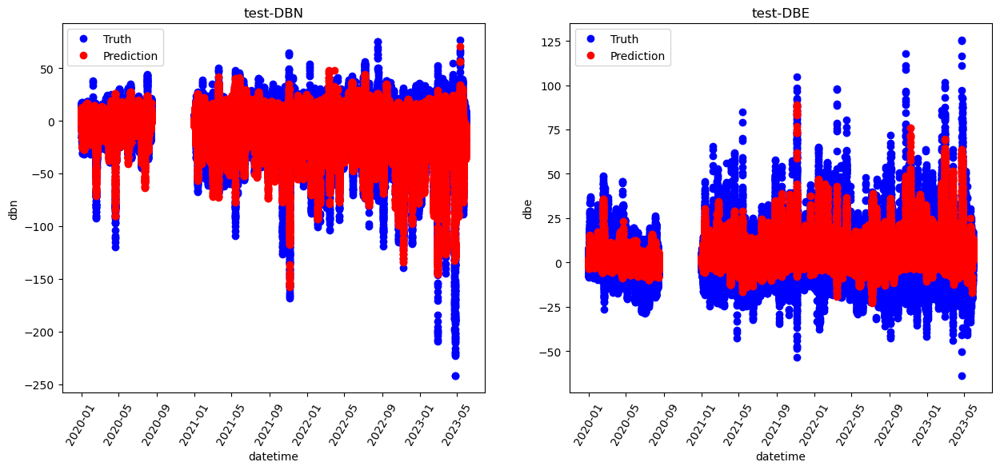

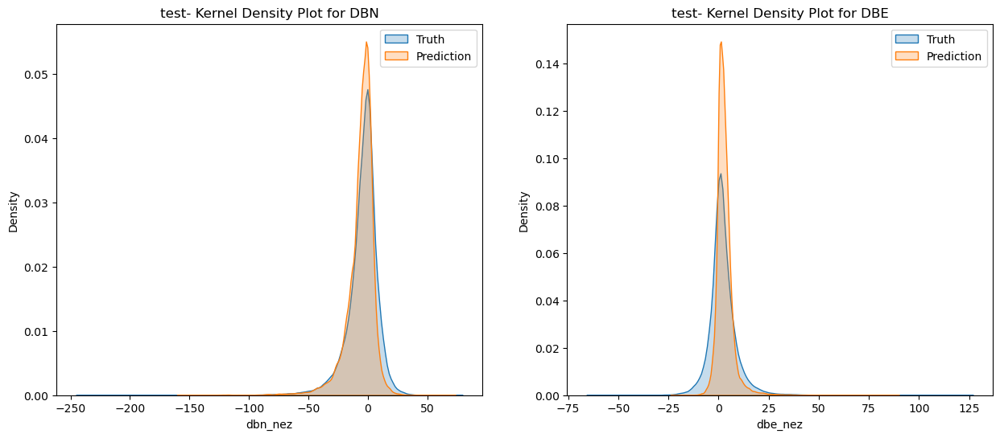

RandomForestRegressor(max_depth=25, max_features=0.8, random_state=2) metrics:
Train MSE: [1.64832757 1.45322673]
Train MAE: [1.11073606 0.96654647]
Test MSE: [7.83862768 6.01382253]
Test MAE: [5.52965366 4.14940475]


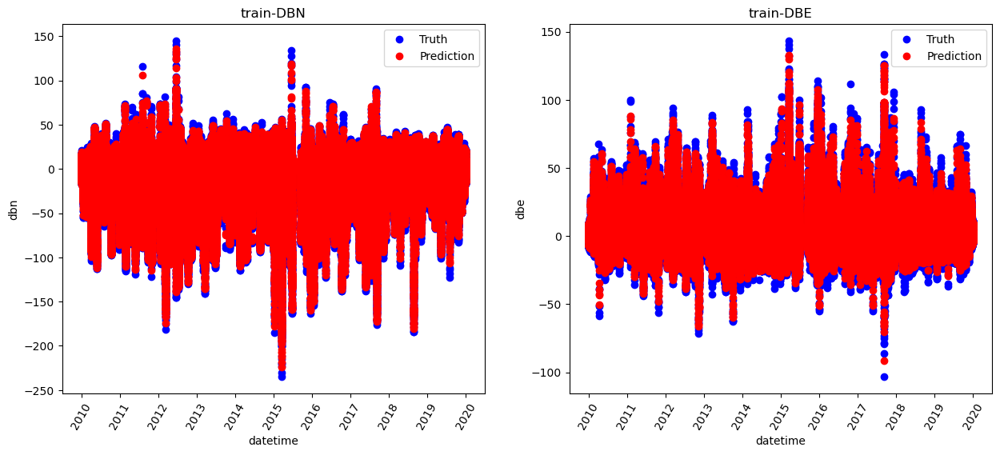

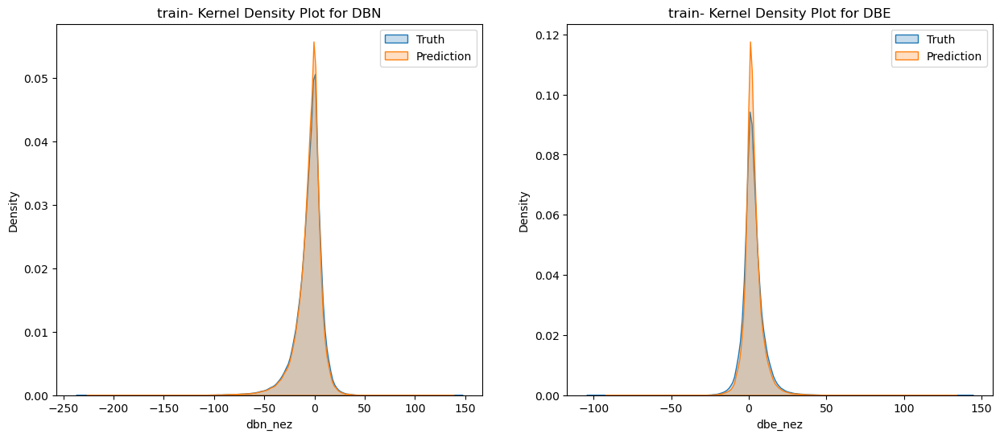

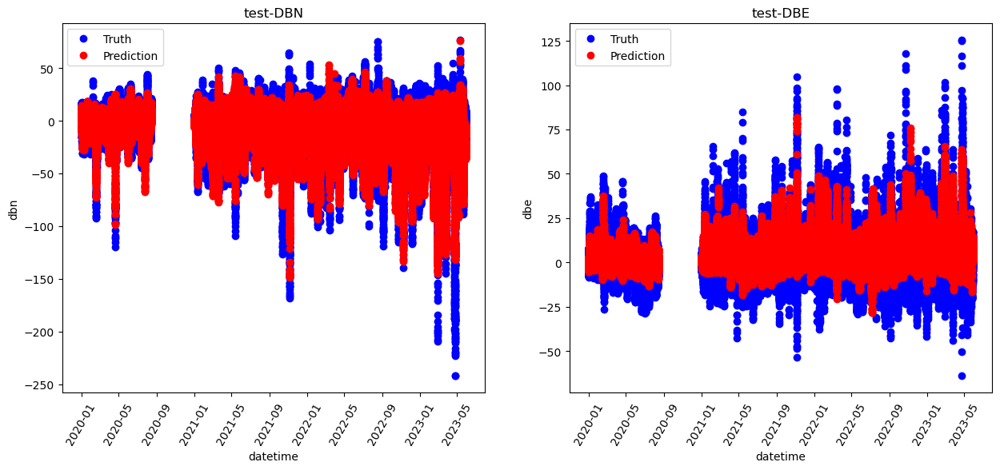

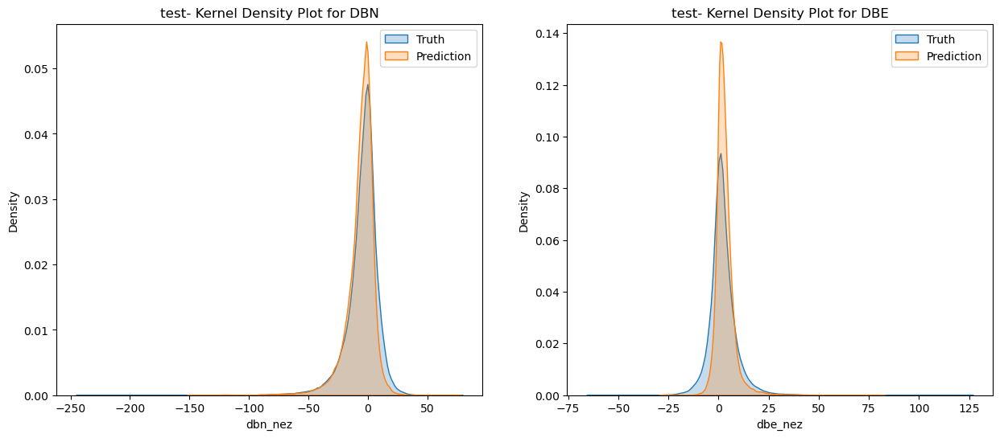

RandomForestRegressor(max_depth=30, max_features=0.8, random_state=2) metrics:
Train MSE: [1.18612759 1.02845142]
Train MAE: [0.71832477 0.61498162]
Test MSE: [7.85391726 6.02309791]
Test MAE: [5.54578383 4.15564532]


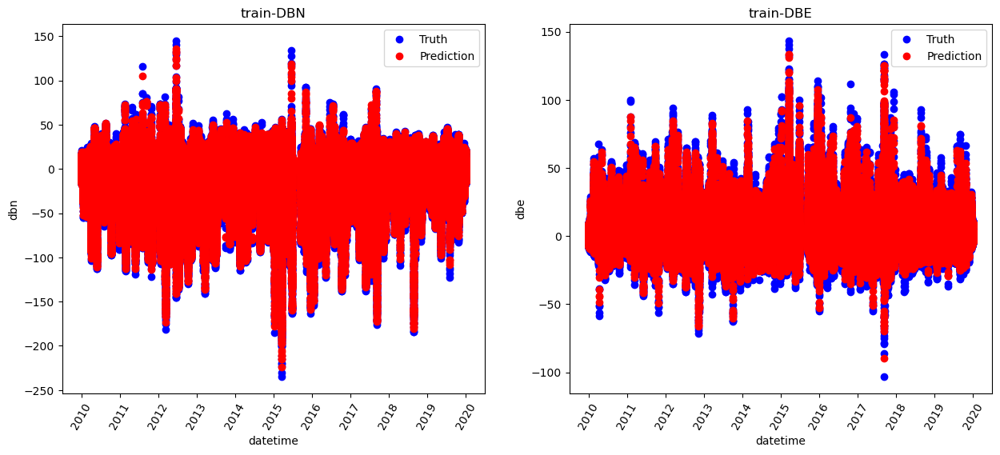

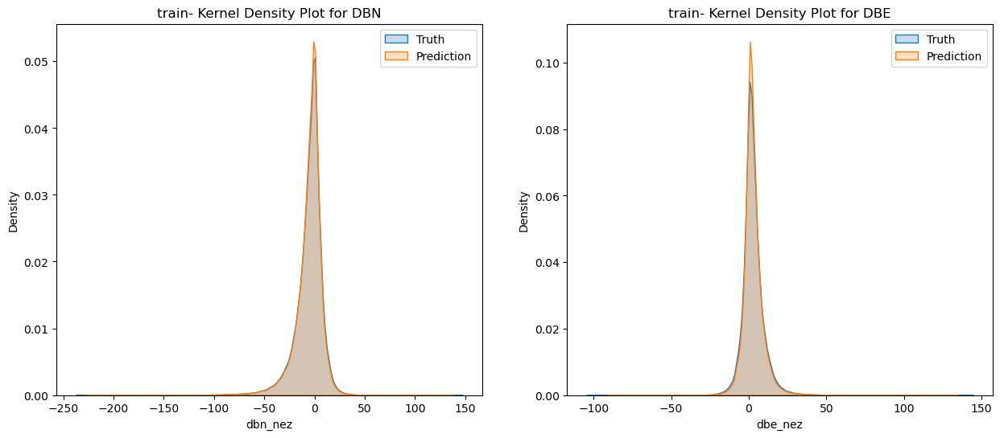

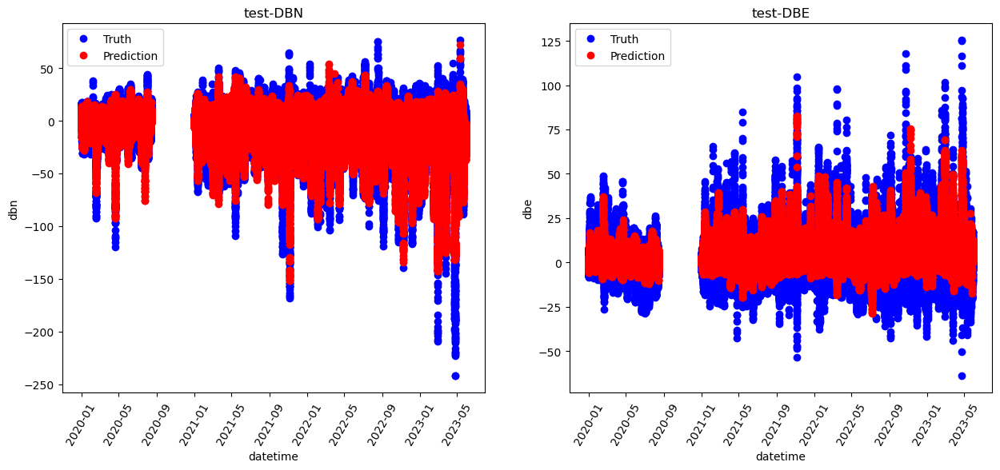

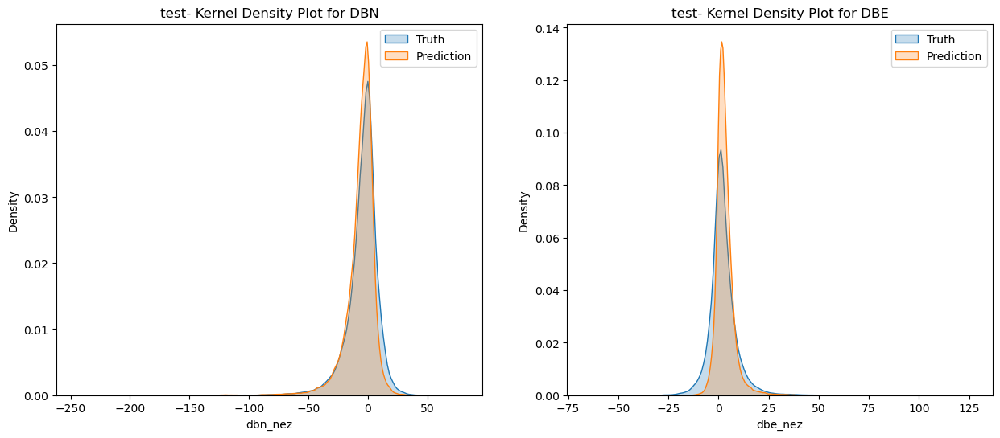

RandomForestRegressor(max_depth=15, max_features=0.3, random_state=2) metrics:
Train MSE: [5.30864174 4.51824975]
Train MAE: [3.92048139 3.19315589]
Test MSE: [7.78241886 5.90096673]
Test MAE: [5.44179341 4.05292575]


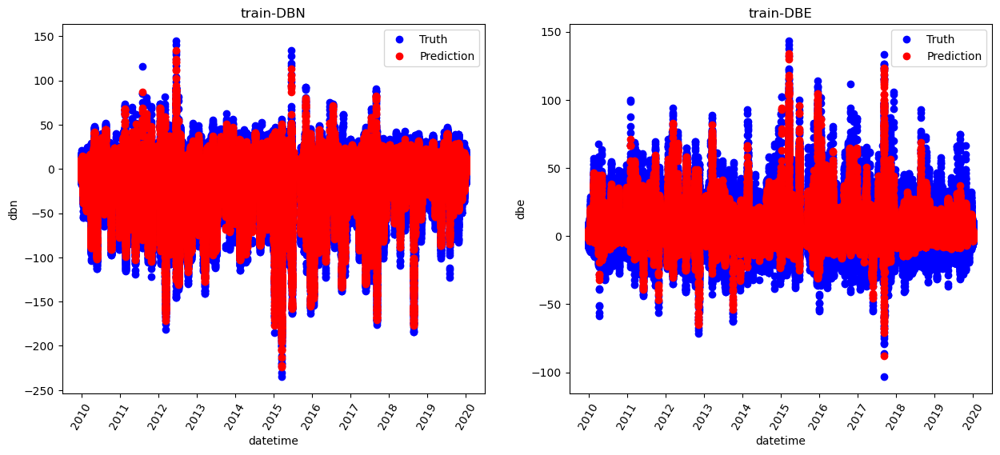

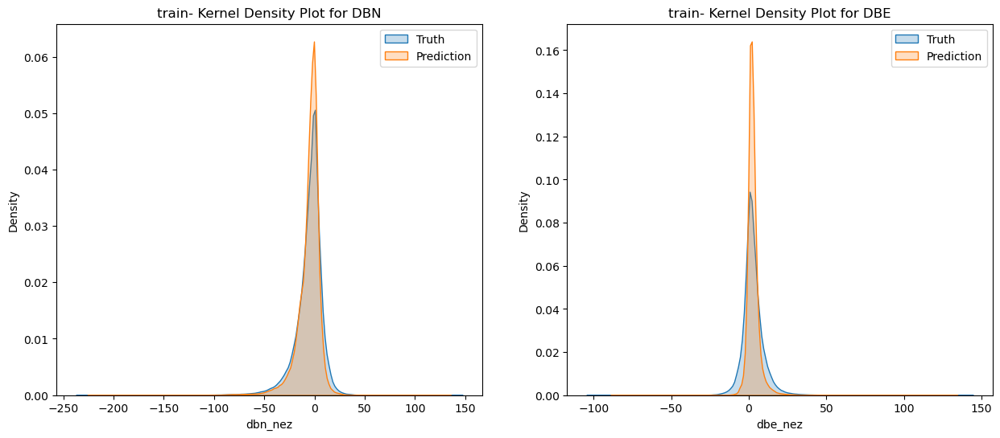

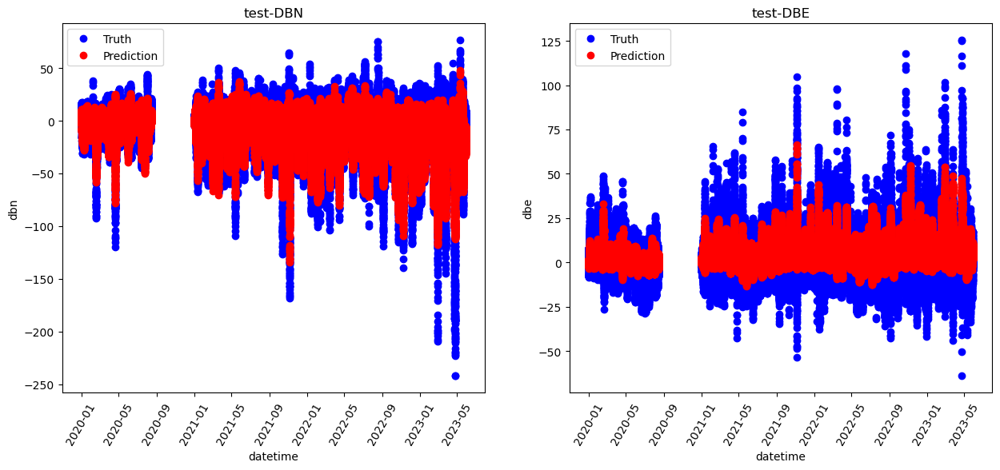

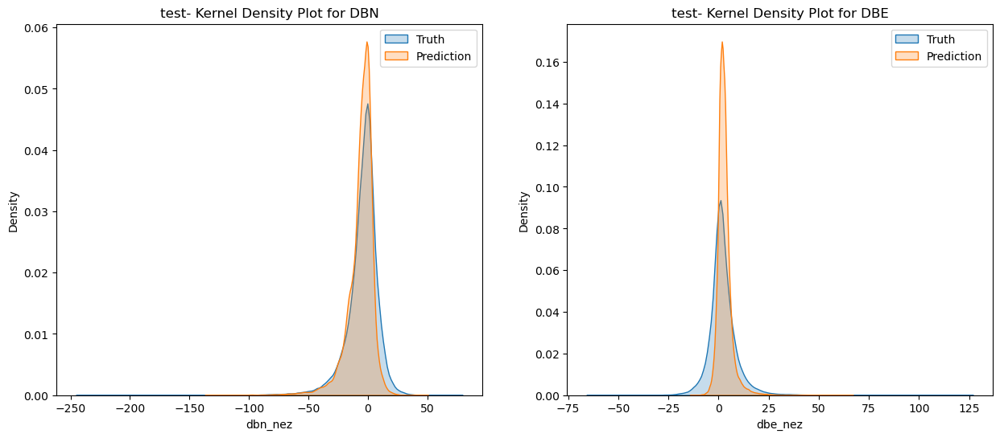

RandomForestRegressor(max_depth=25, max_features=0.3, random_state=2) metrics:
Train MSE: [1.6923483  1.48058828]
Train MAE: [1.18489723 1.02111108]
Test MSE: [7.82803697 5.90813028]
Test MAE: [5.48929018 4.07330955]


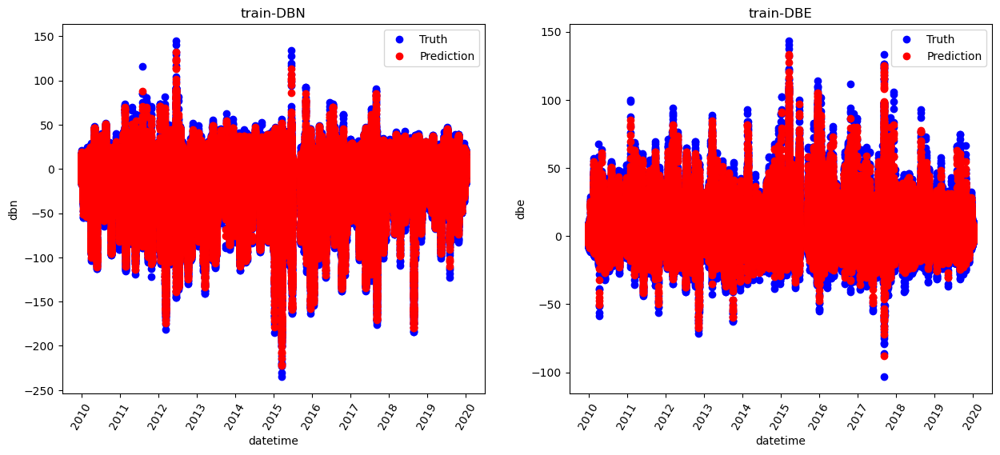

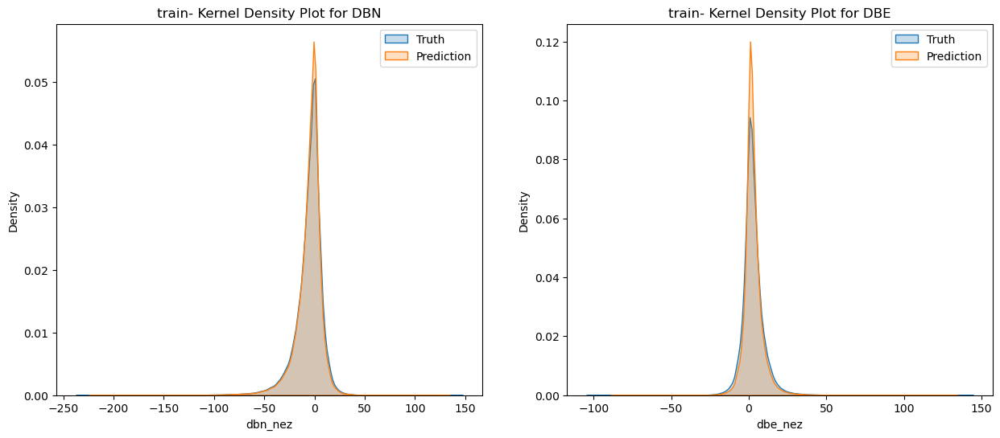

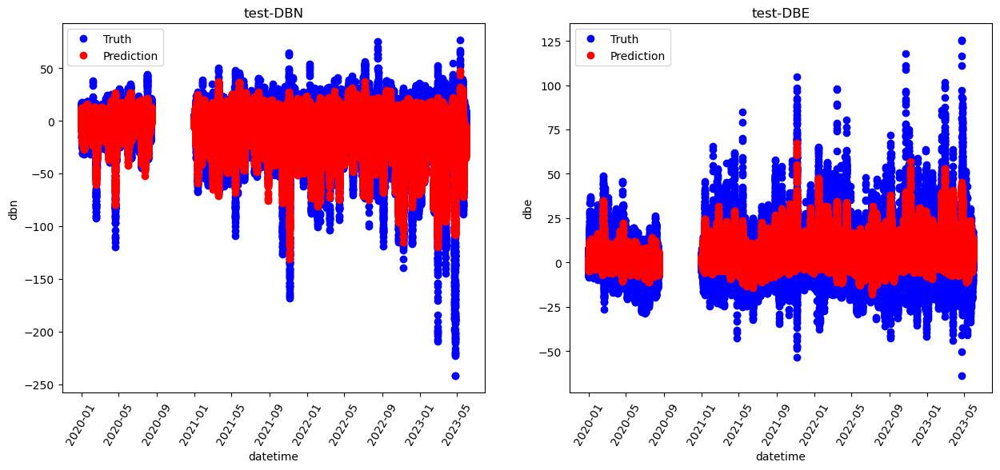

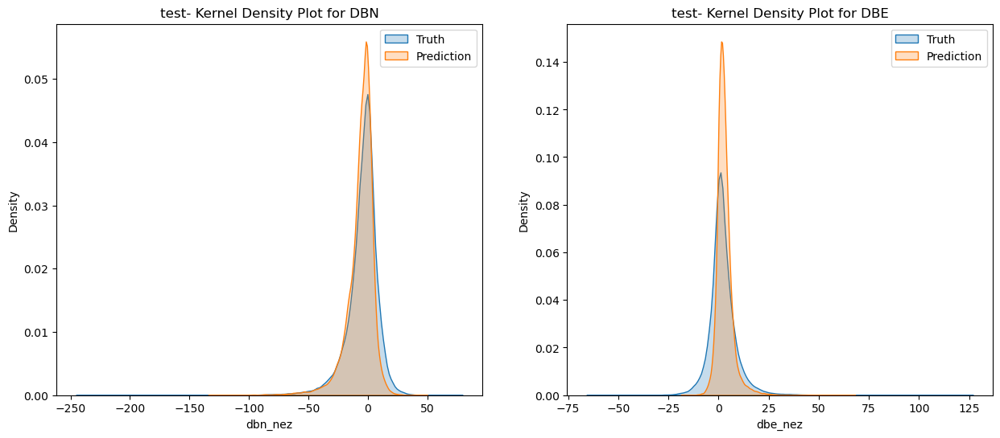

RandomForestRegressor(max_depth=30, max_features=0.3, random_state=2) metrics:
Train MSE: [1.19395609 1.02023036]
Train MAE: [0.74977486 0.63260166]
Test MSE: [7.82108691 5.91381177]
Test MAE: [5.49415786 4.08382863]


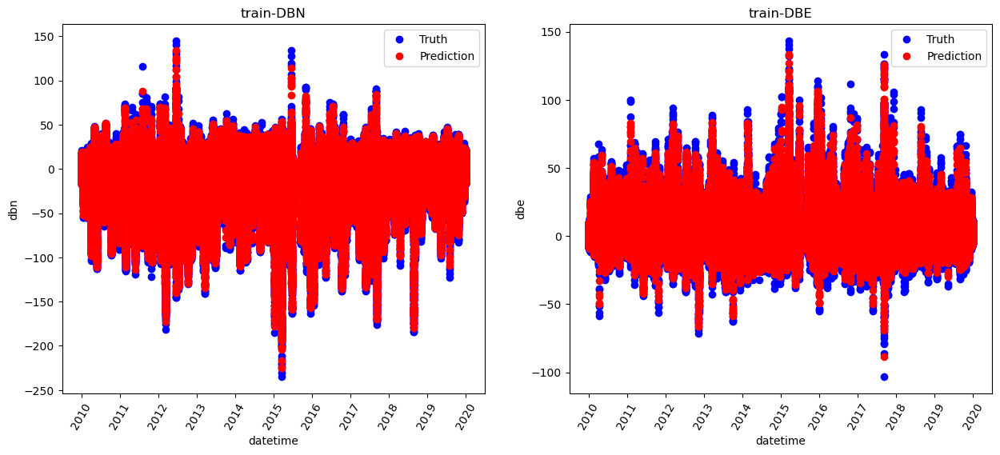

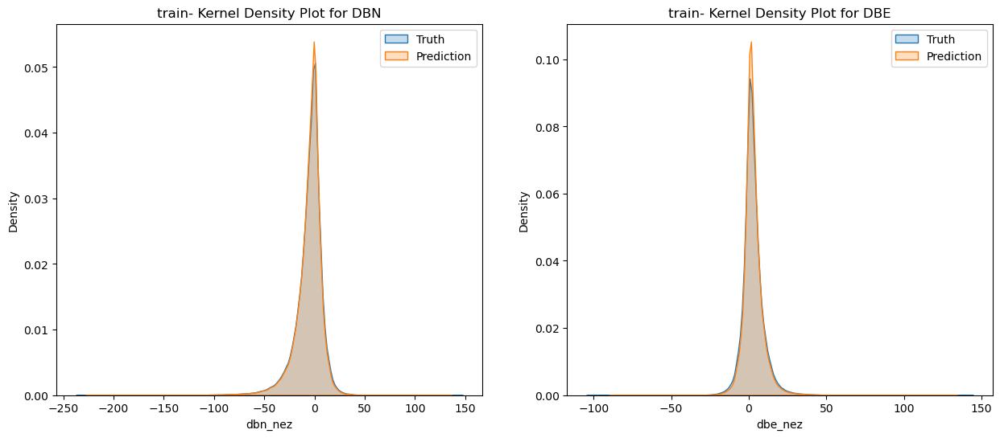

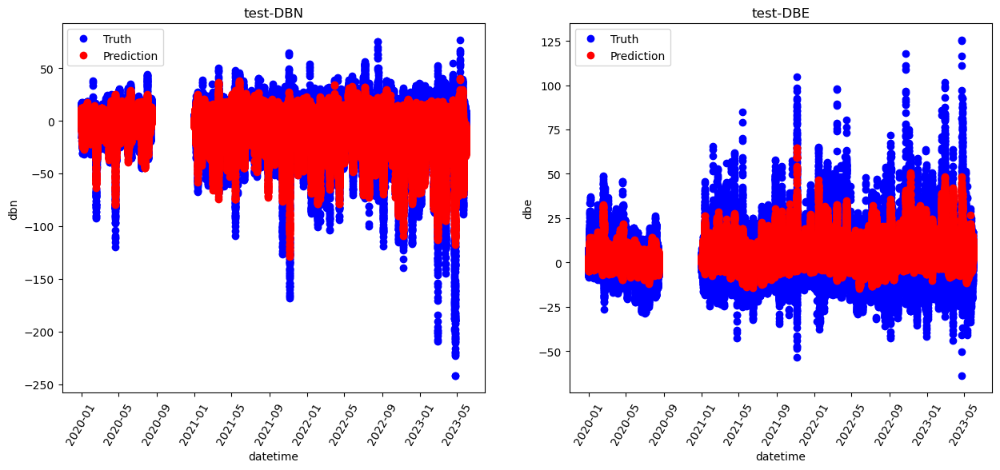

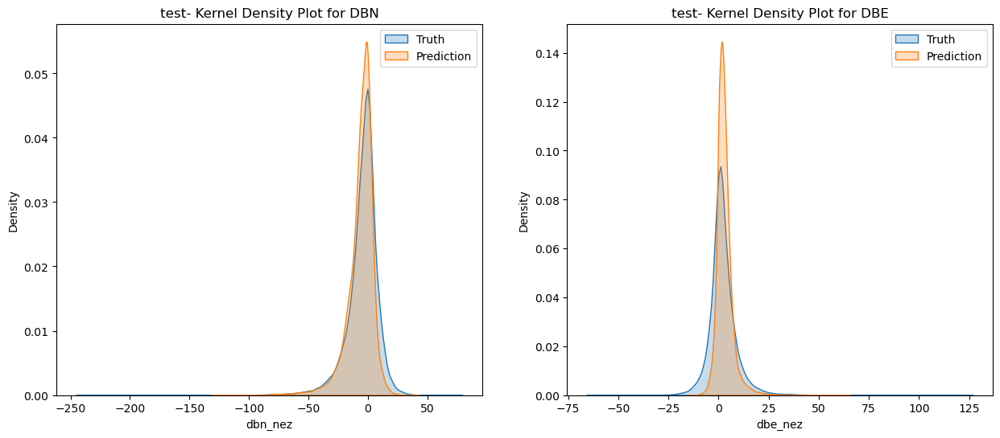

In [196]:
for regr_rf_model in regr_rf_models:
    regr_rf_model, rf_y_train_pred, rf_y_test_pred = experiment(regr_rf_model, x_train, y_train, x_test, y_test, regr_rf_model)
    metric_visualization(rf_y_train_pred, rf_y_test_pred)

RandomForestRegressor(max_depth=15, max_features='sqrt', random_state=2) metrics:
Train MSE: [6.9498282  6.08288406]
Train MAE: [5.32341613 4.33782179]
Test MSE: [40.14675216 21.99040393]
Test MAE: [28.21257502 14.12580984]


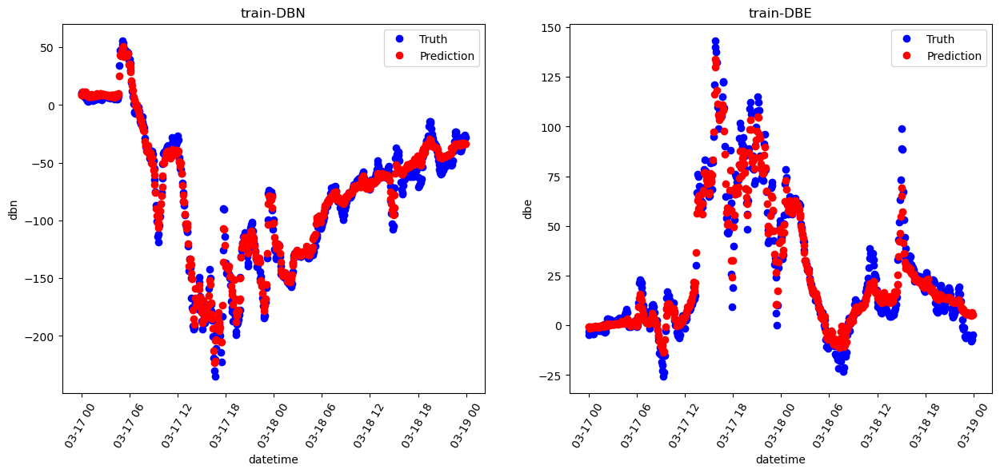

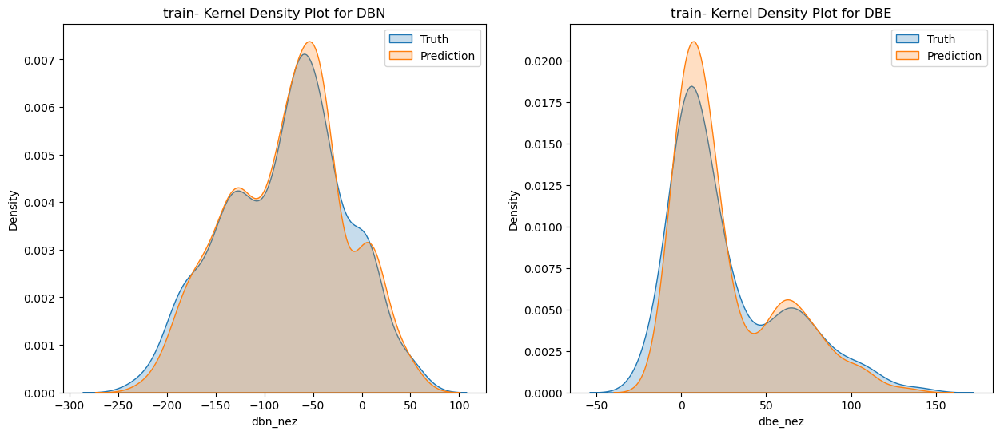

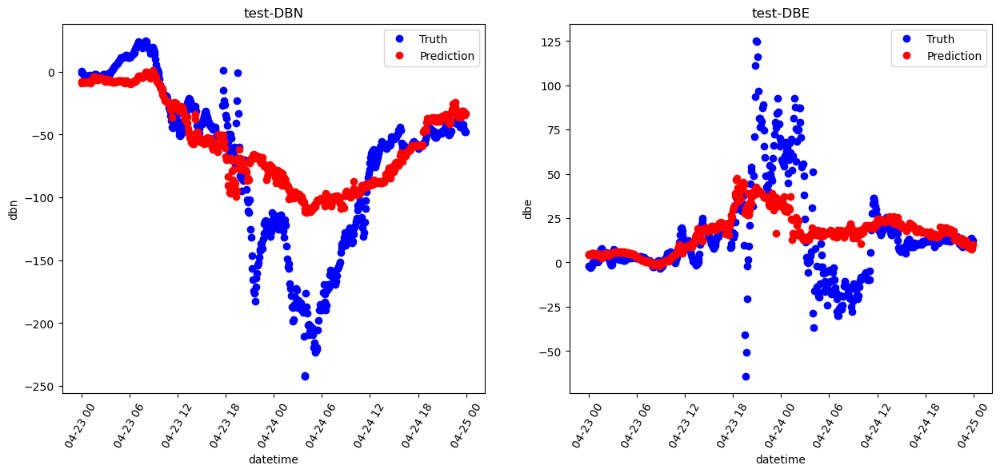

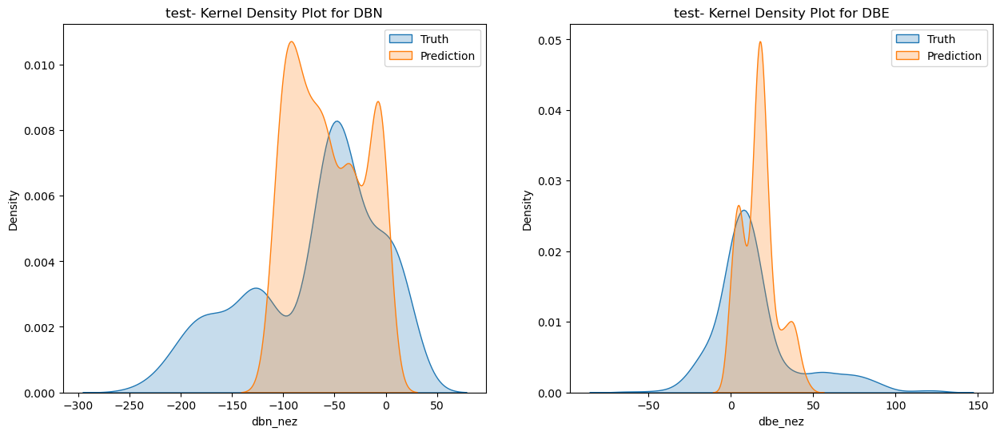

RandomForestRegressor(max_depth=25, max_features='sqrt', random_state=2) metrics:
Train MSE: [4.23344531 3.51896559]
Train MAE: [2.69835134 2.2342395 ]
Test MSE: [41.14572645 21.50340706]
Test MAE: [29.04959368 14.01096839]


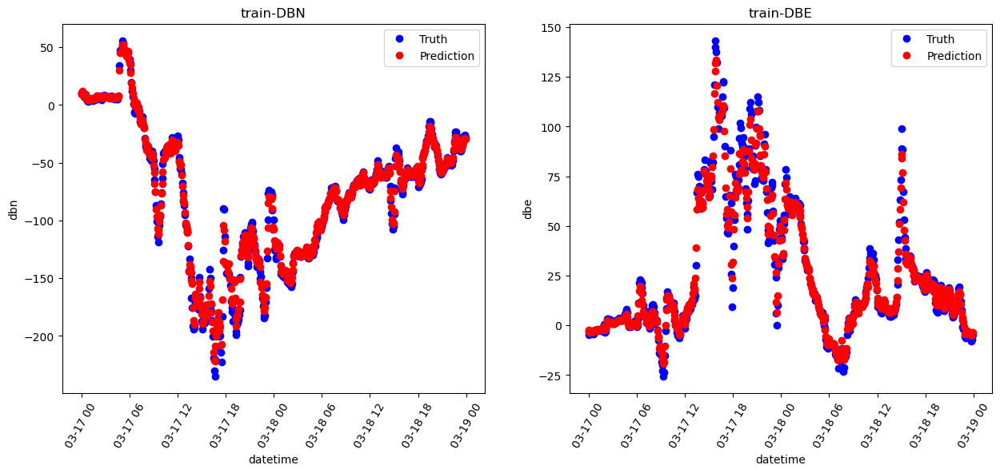

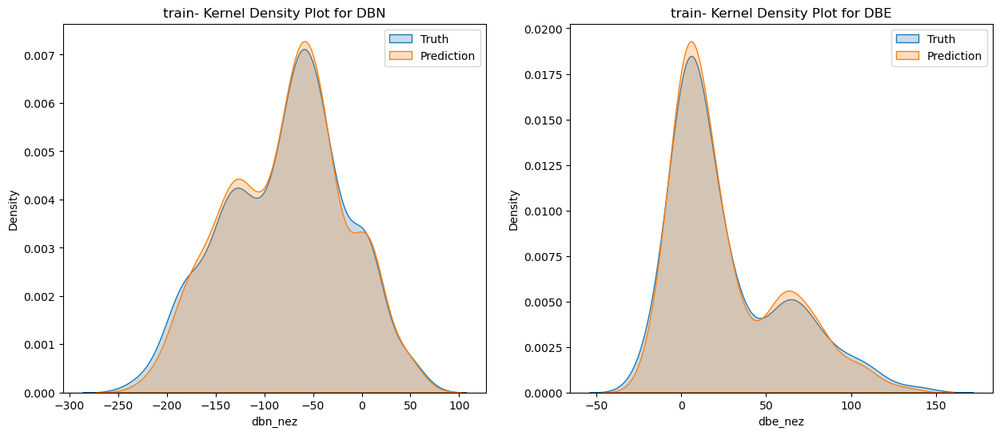

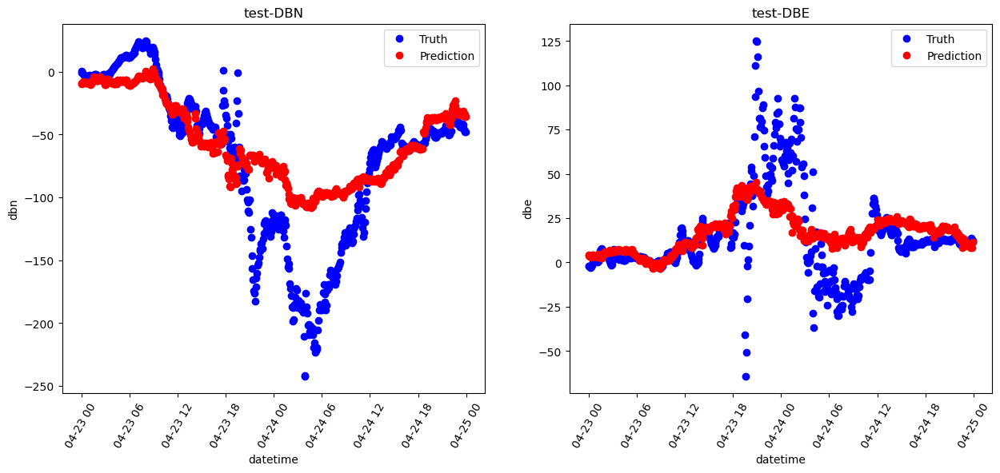

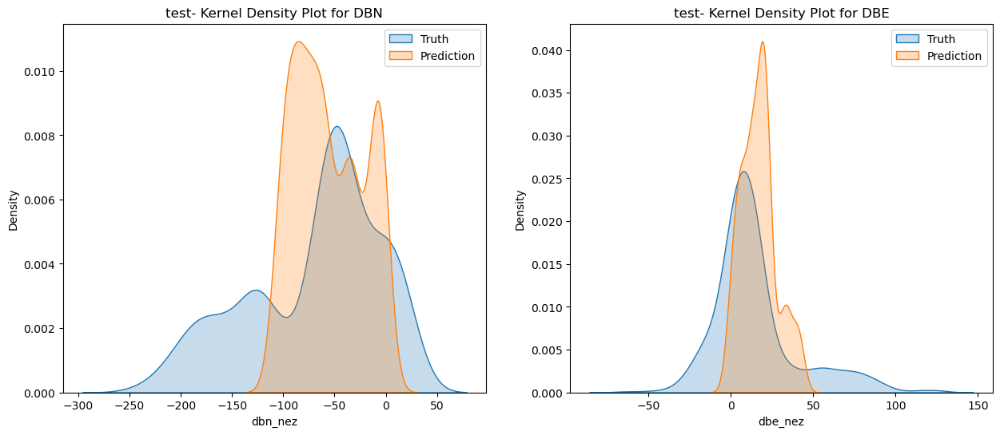

RandomForestRegressor(max_depth=30, max_features='sqrt', random_state=2) metrics:
Train MSE: [4.49055055 3.54704392]
Train MAE: [2.77248437 2.15836126]
Test MSE: [40.22445077 22.37292188]
Test MAE: [28.3709603  14.28521879]


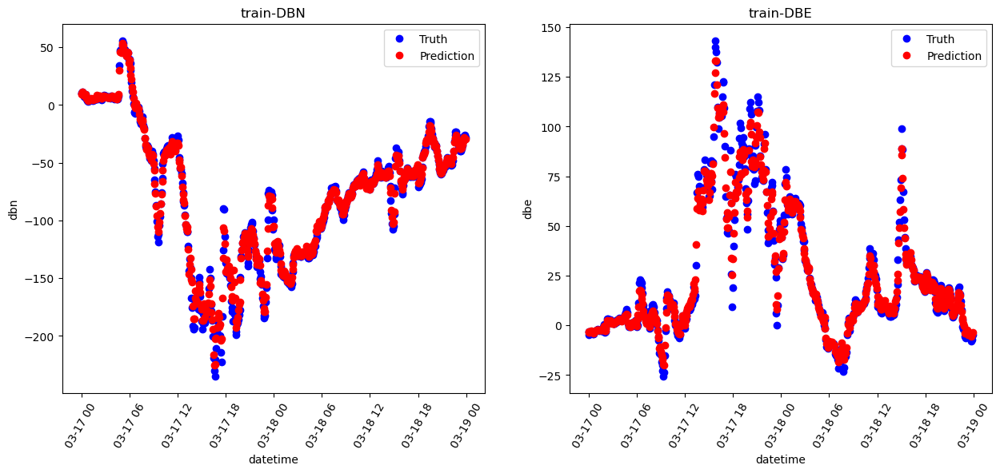

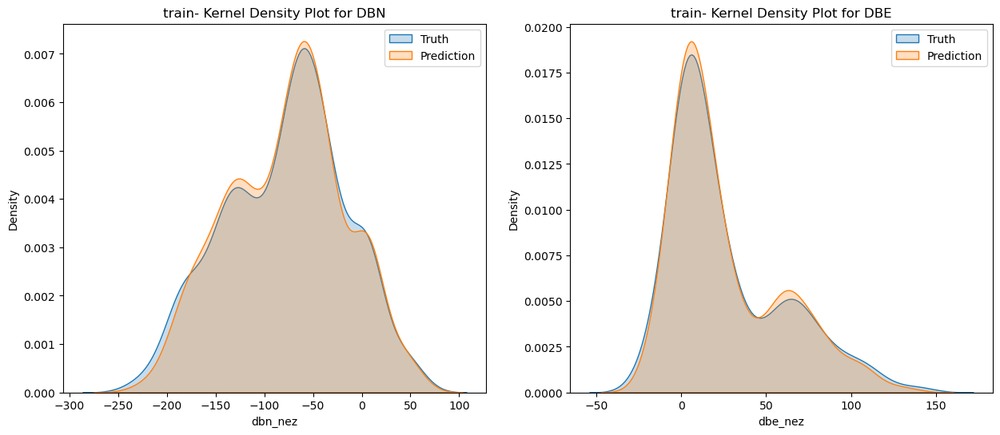

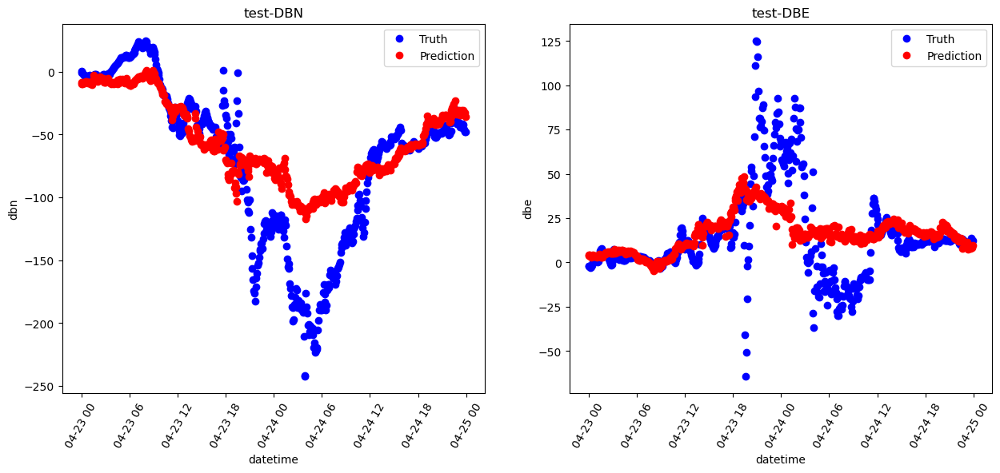

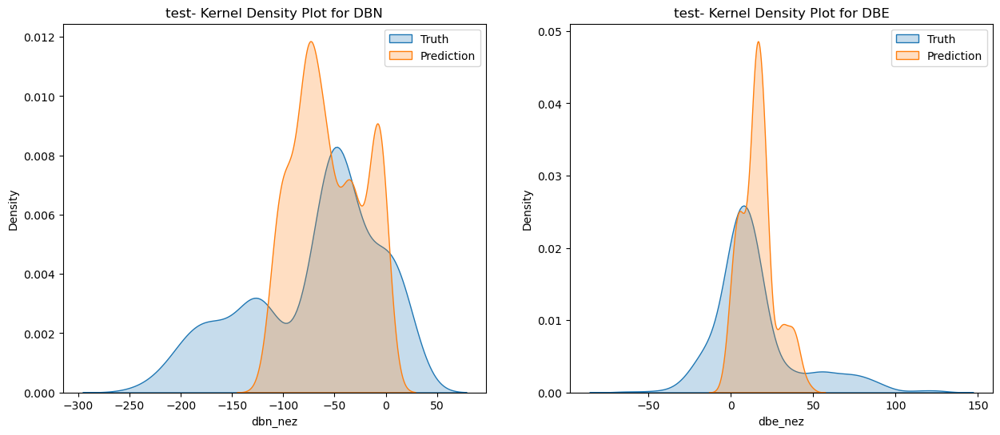

RandomForestRegressor(max_depth=15, max_features=0.5, random_state=2) metrics:
Train MSE: [6.67107422 6.1462763 ]
Train MAE: [5.10873054 4.42993958]
Test MSE: [33.73643039 21.91947076]
Test MAE: [24.82561172 14.86707371]


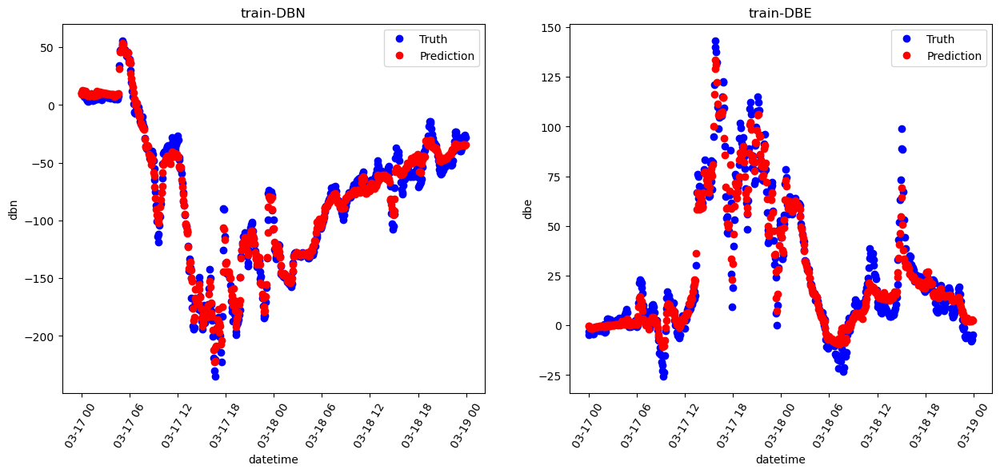

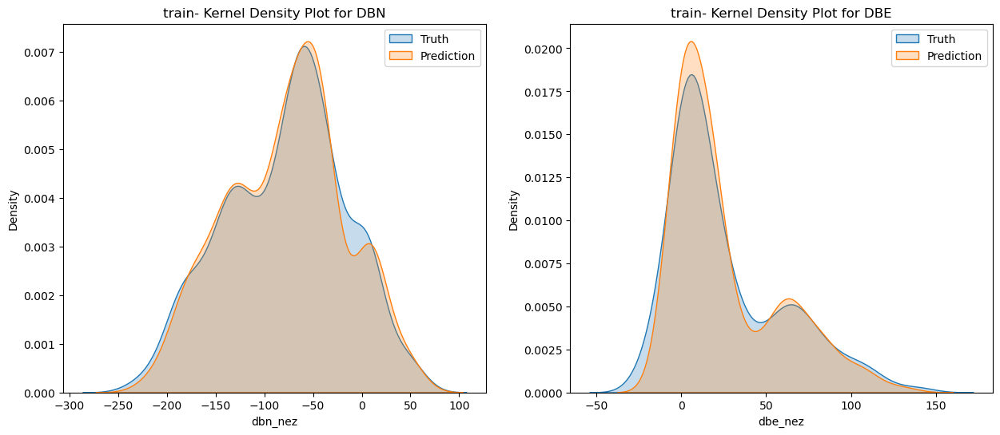

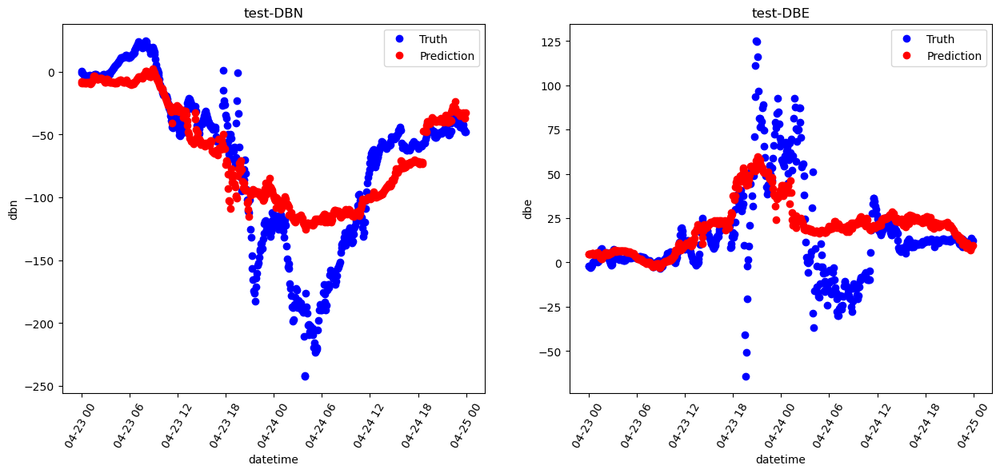

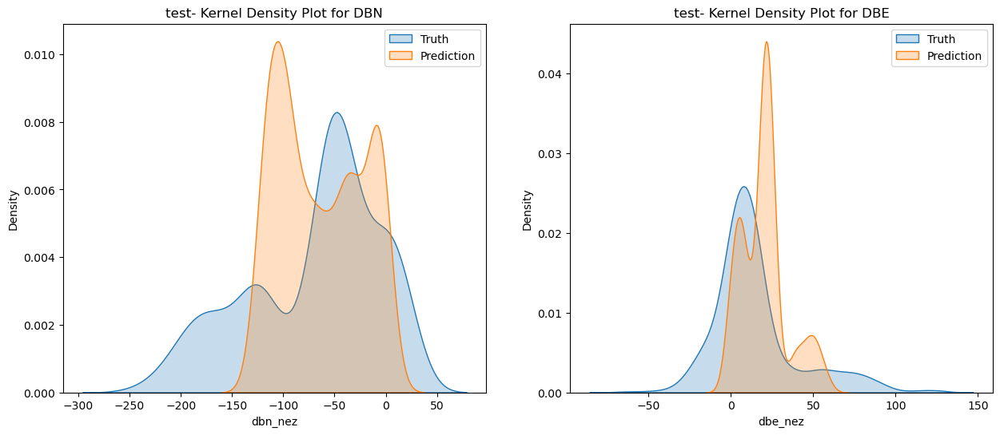

RandomForestRegressor(max_depth=25, max_features=0.5, random_state=2) metrics:
Train MSE: [3.90730895 3.31337887]
Train MAE: [2.43258293 2.11172169]
Test MSE: [33.96448751 22.23122791]
Test MAE: [24.86653274 14.8425641 ]


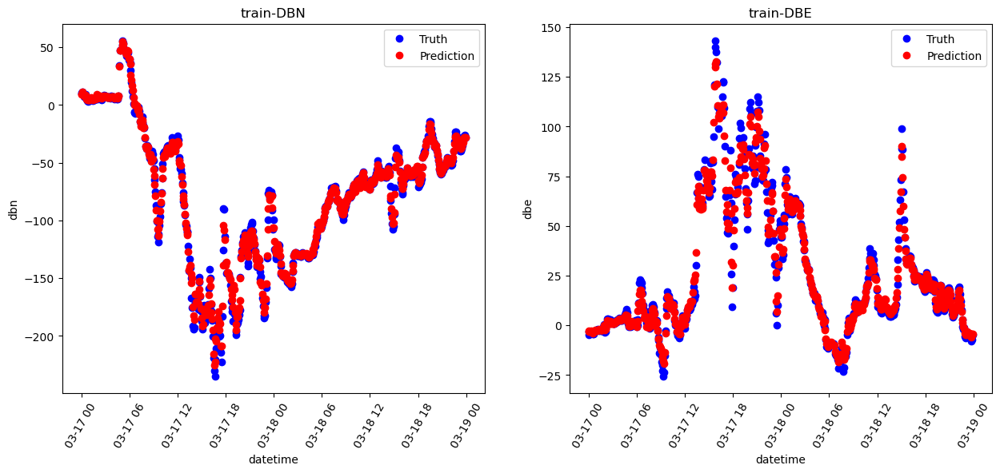

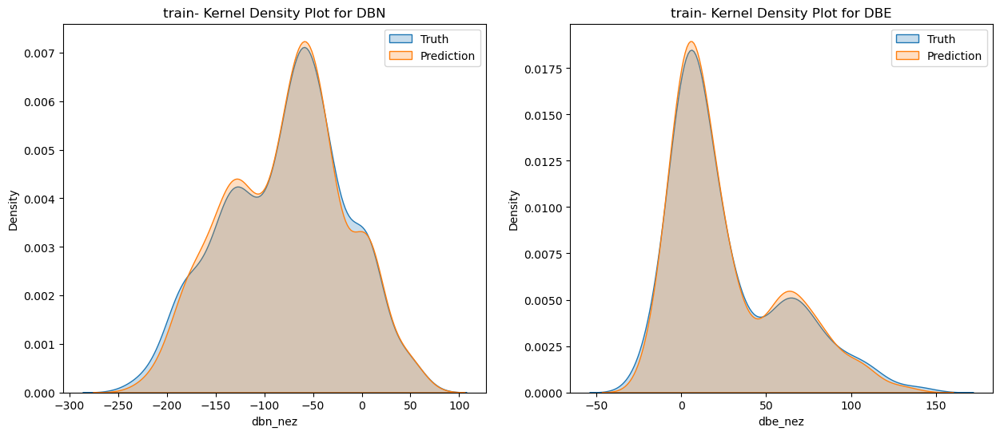

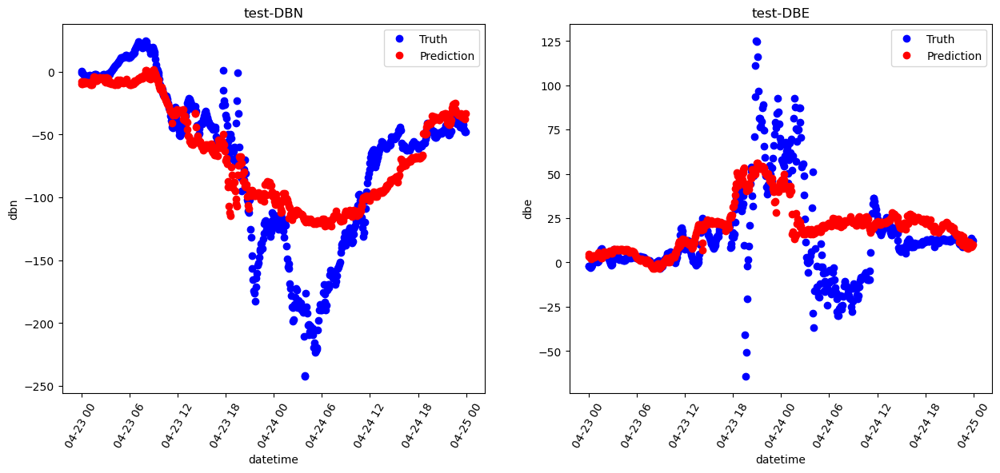

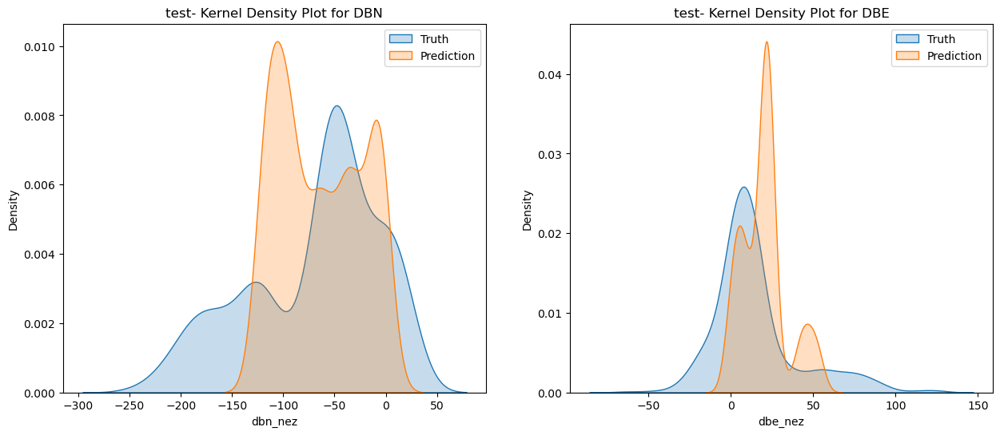

RandomForestRegressor(max_depth=30, max_features=0.5, random_state=2) metrics:
Train MSE: [3.79725241 3.37515472]
Train MAE: [2.35609591 2.08169372]
Test MSE: [33.77028184 22.01887949]
Test MAE: [24.76193563 14.85925237]


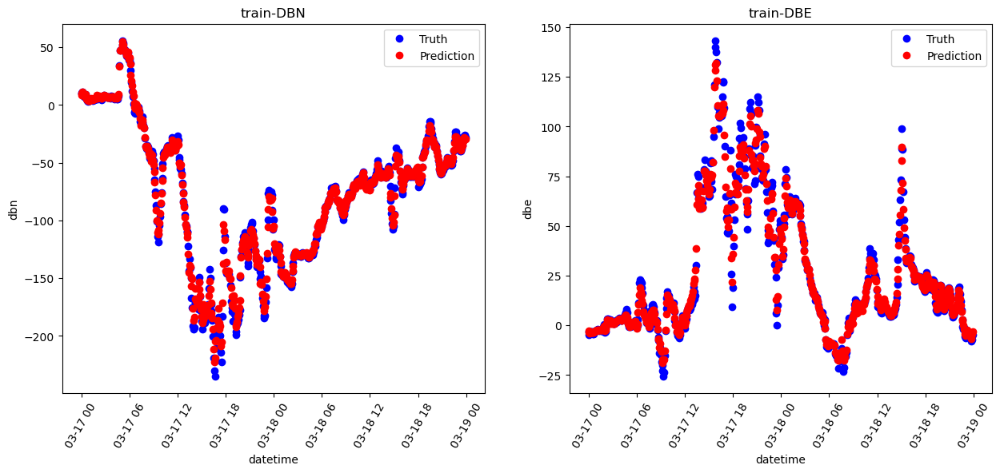

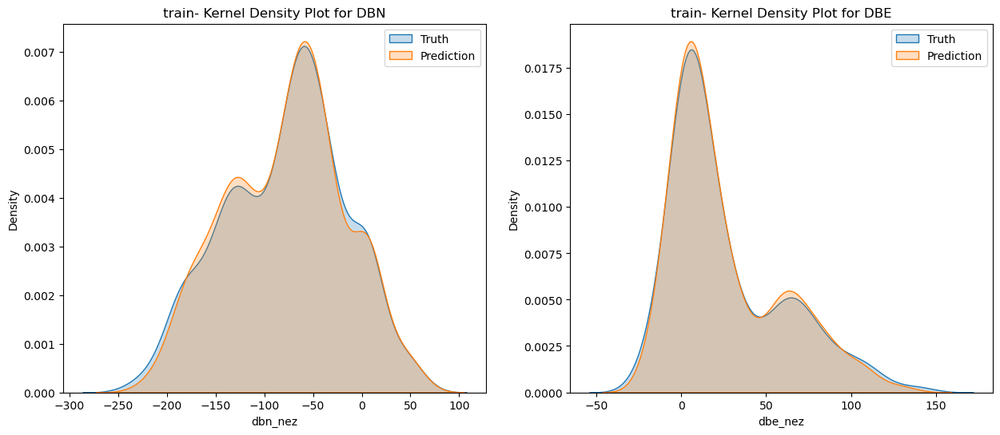

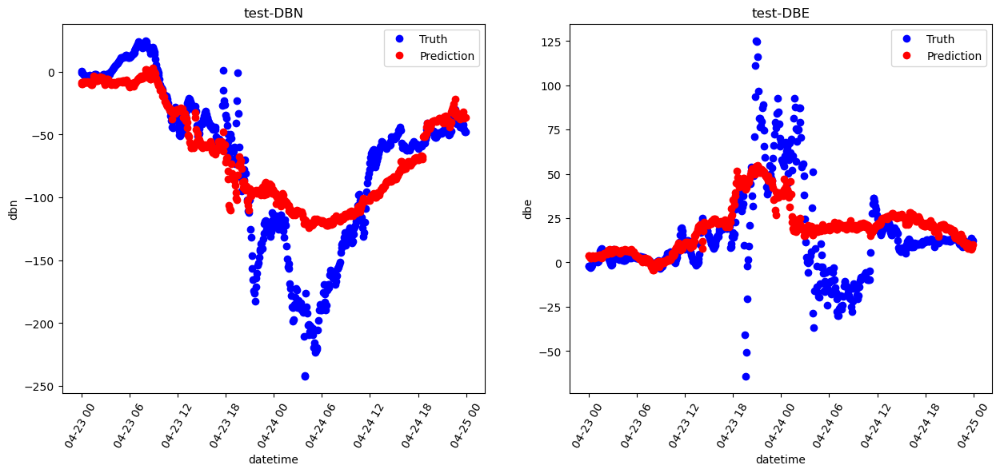

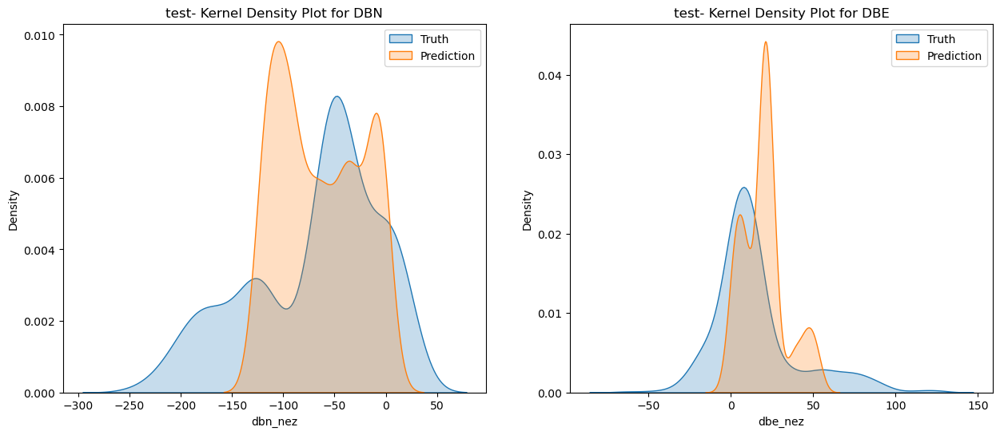

RandomForestRegressor(max_depth=15, max_features=0.8, random_state=2) metrics:
Train MSE: [6.97897483 6.40961459]
Train MAE: [5.3677704  4.61021108]
Test MSE: [30.65343031 24.35566625]
Test MAE: [22.43932412 16.13202041]


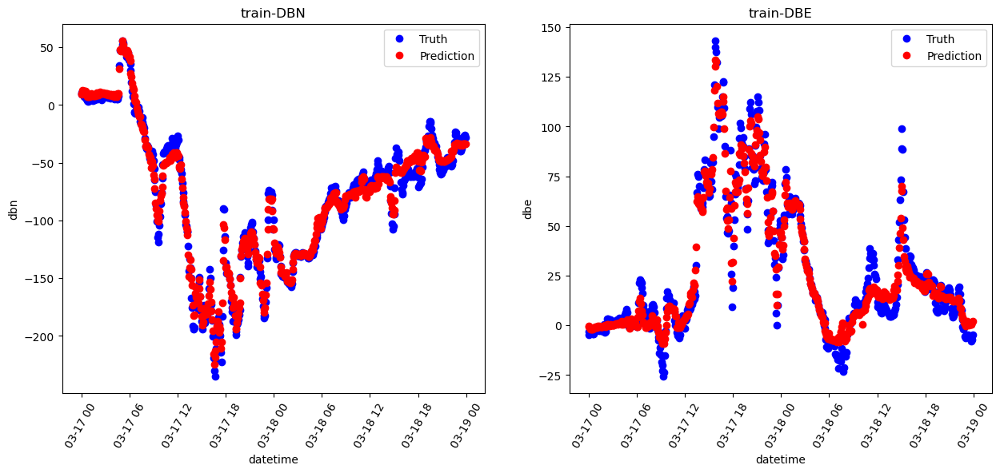

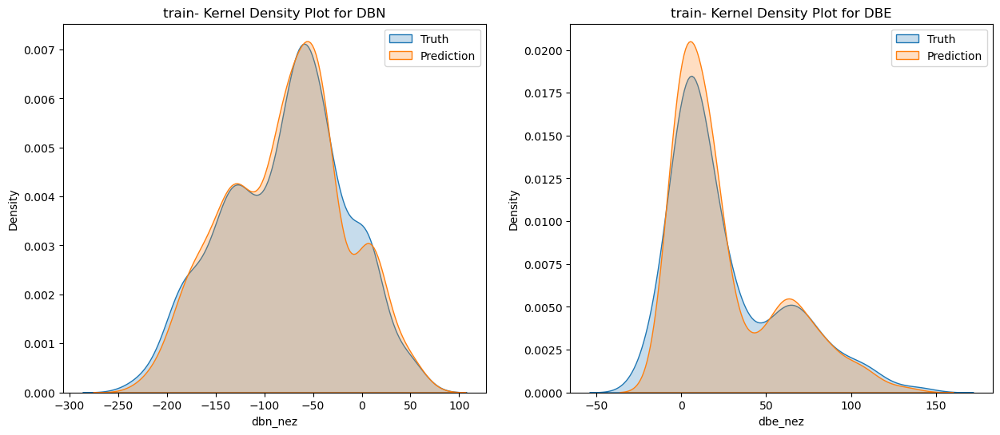

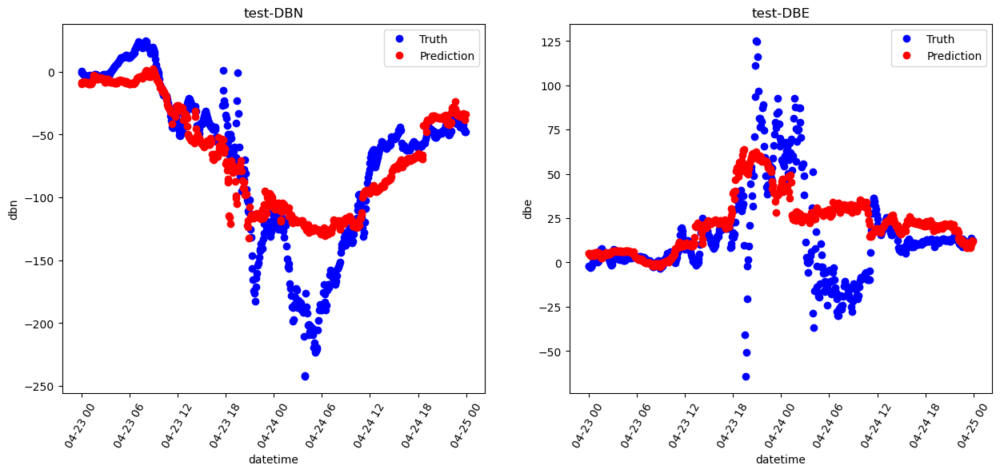

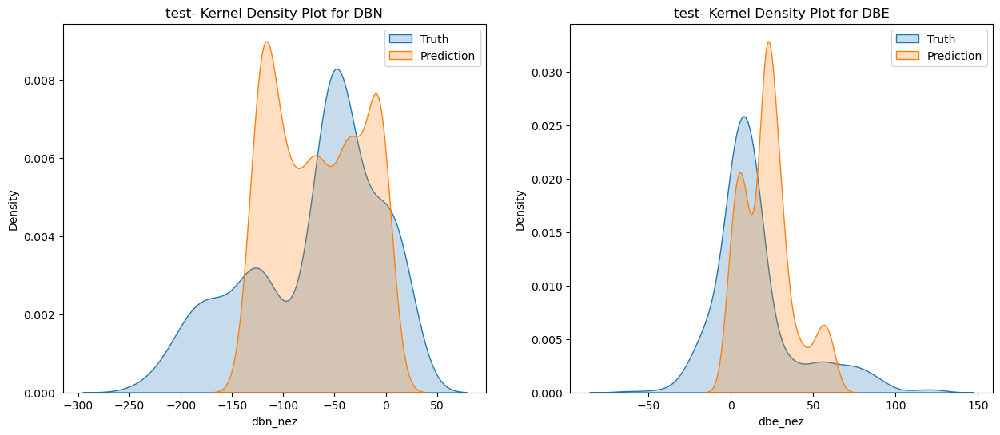

RandomForestRegressor(max_depth=25, max_features=0.8, random_state=2) metrics:
Train MSE: [3.58454032 3.31945109]
Train MAE: [2.27282057 2.12051299]
Test MSE: [30.86900932 23.88454186]
Test MAE: [22.69695006 15.99632072]


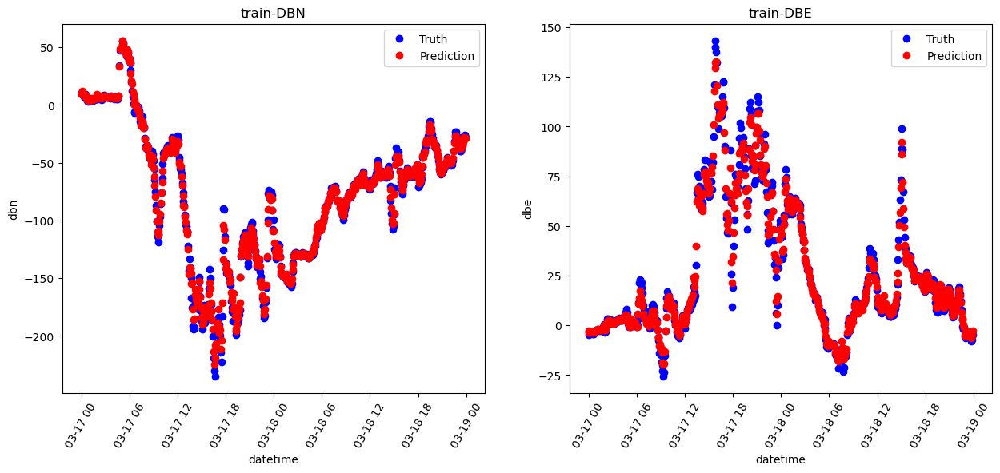

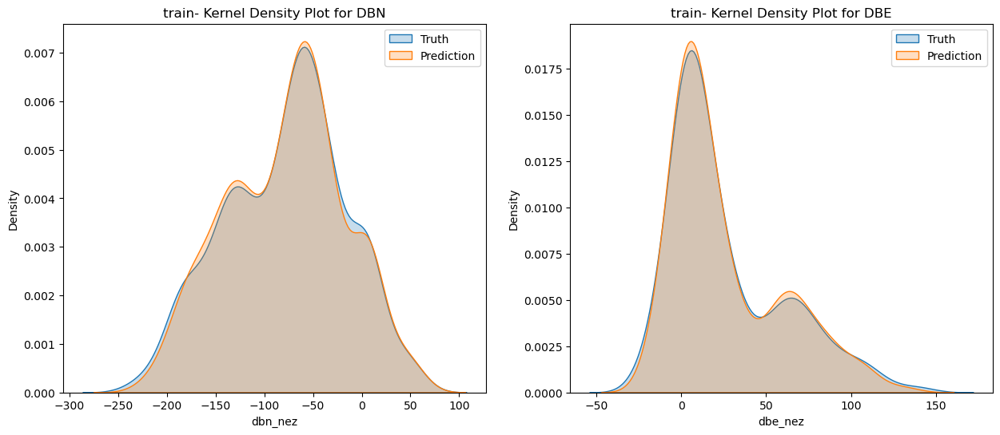

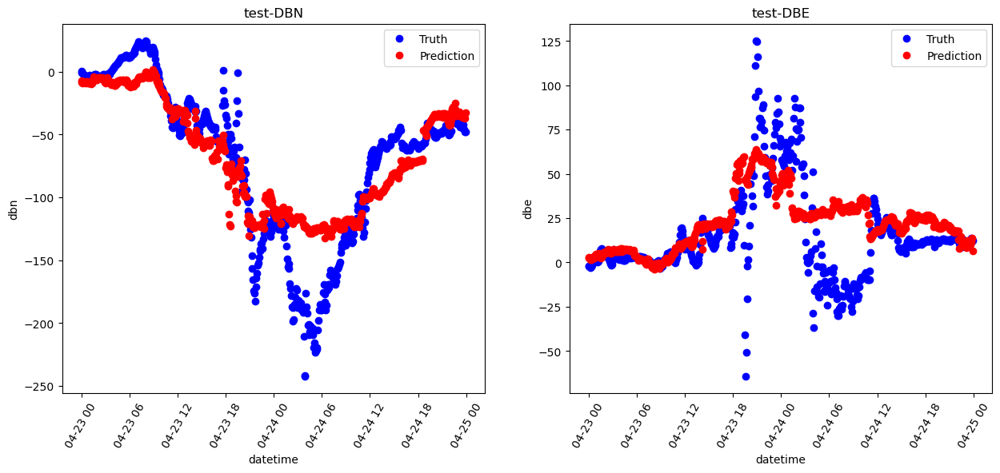

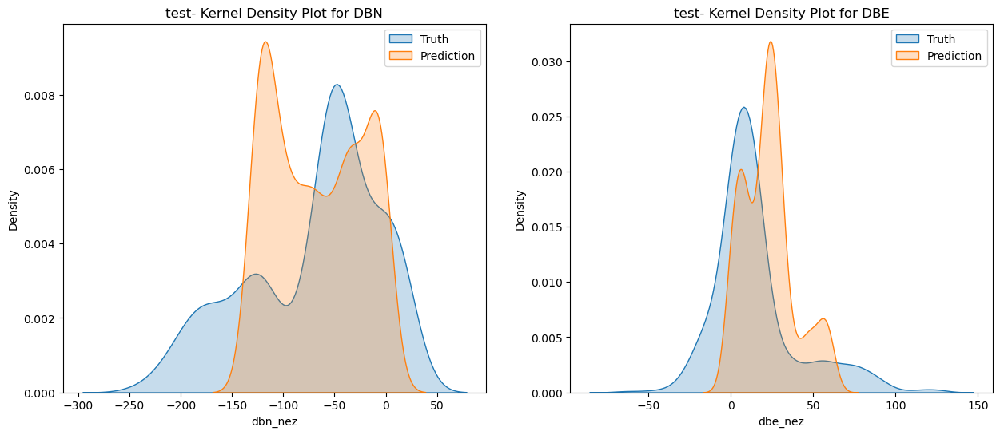

RandomForestRegressor(max_depth=30, max_features=0.8, random_state=2) metrics:
Train MSE: [3.53661033 3.22350431]
Train MAE: [2.2208891  2.05398888]
Test MSE: [30.9726799  24.57270153]
Test MAE: [22.83164976 16.34240934]


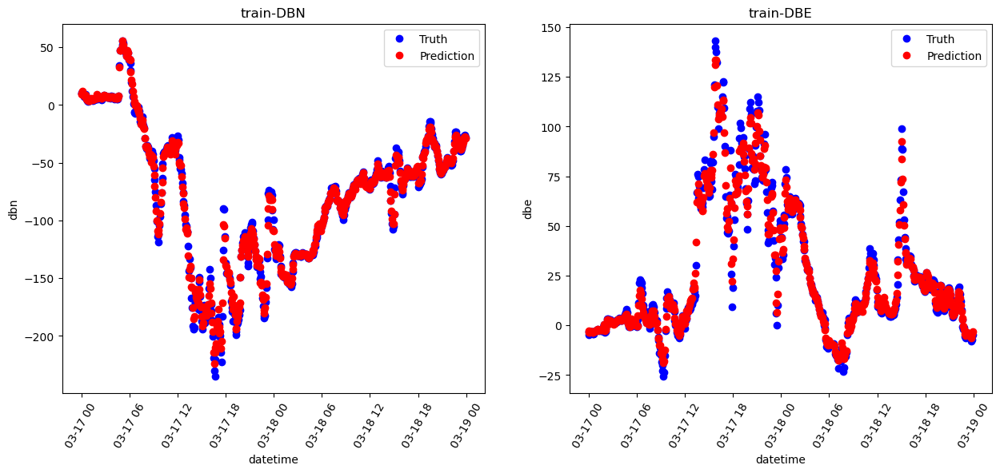

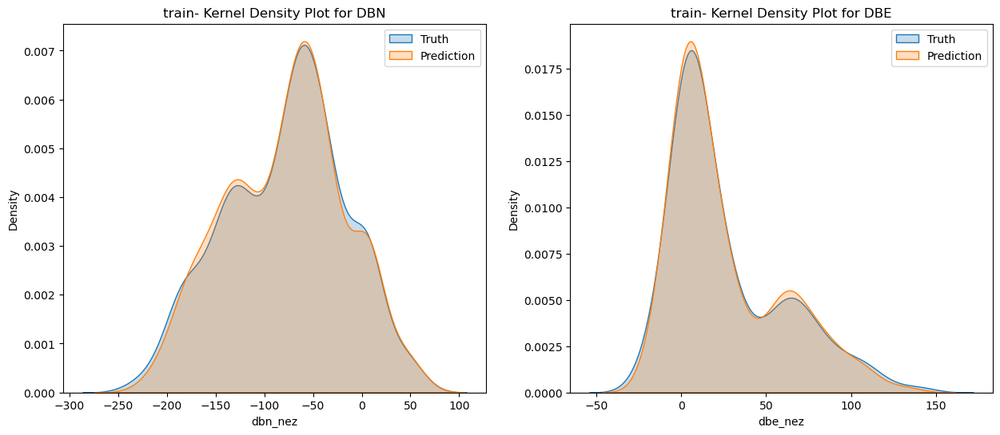

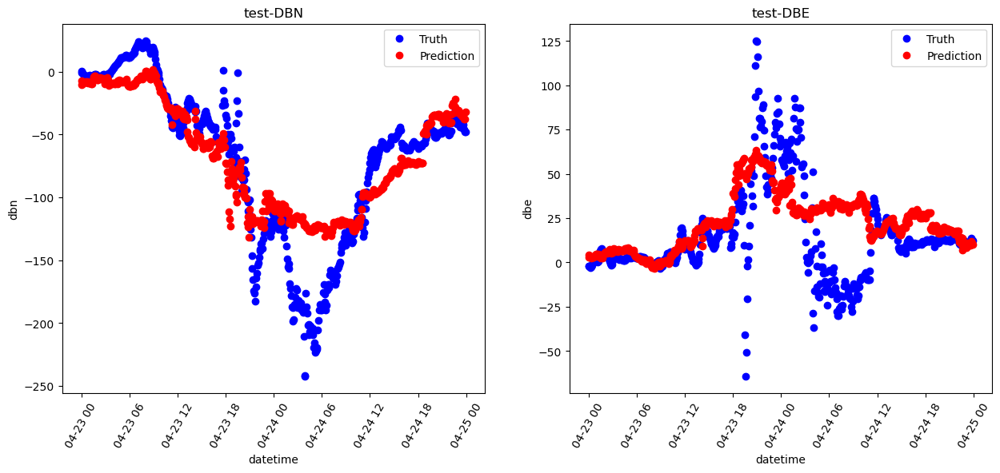

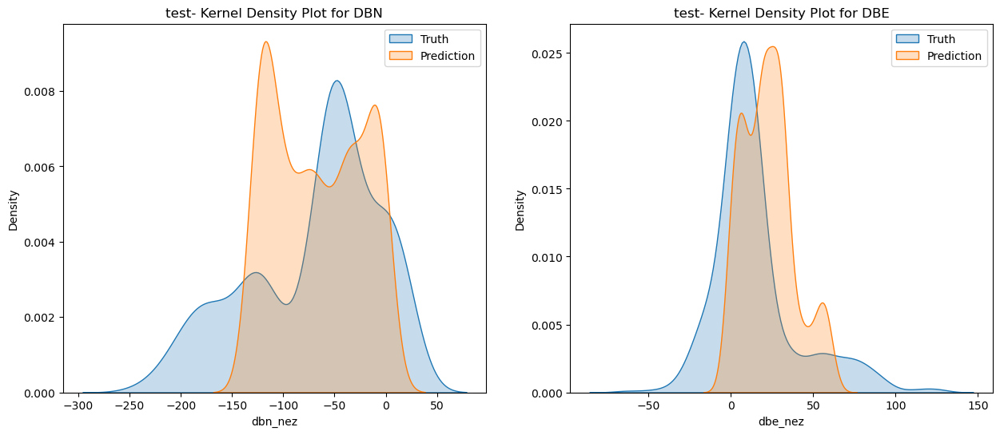

RandomForestRegressor(max_depth=15, max_features=0.3, random_state=2) metrics:
Train MSE: [6.9498282  6.08288406]
Train MAE: [5.32341613 4.33782179]
Test MSE: [40.14675216 21.99040393]
Test MAE: [28.21257502 14.12580984]


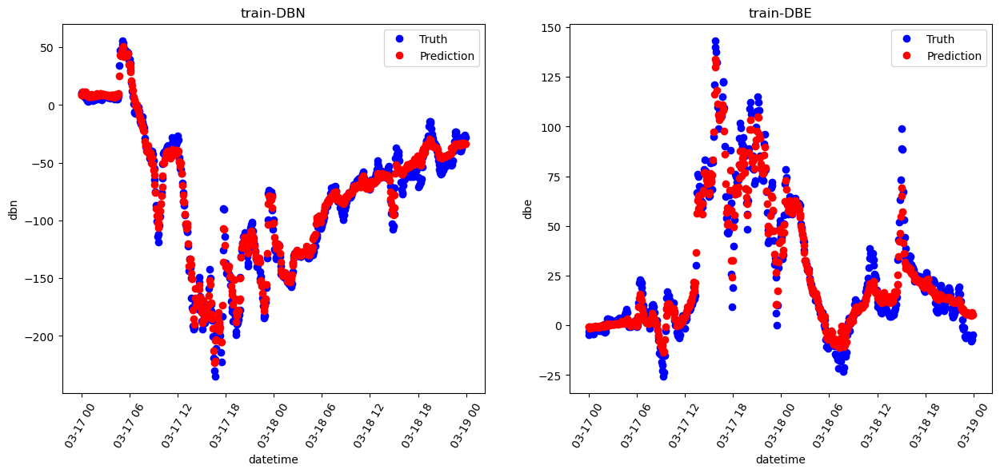

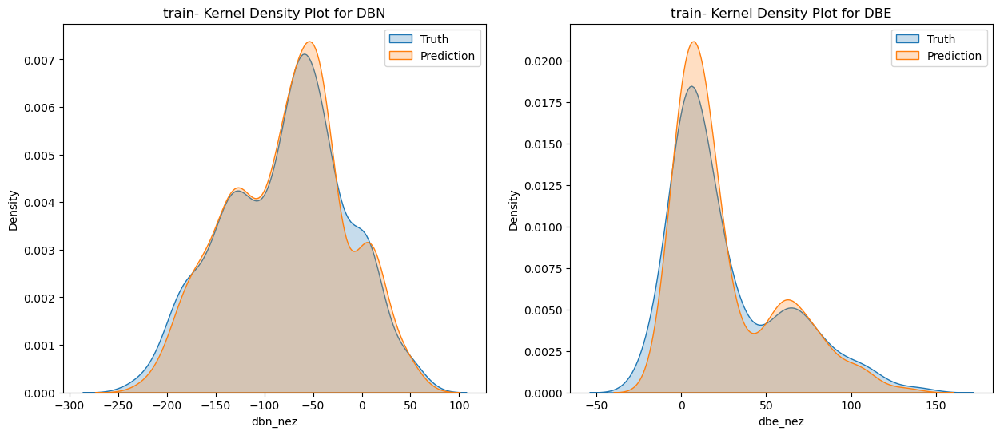

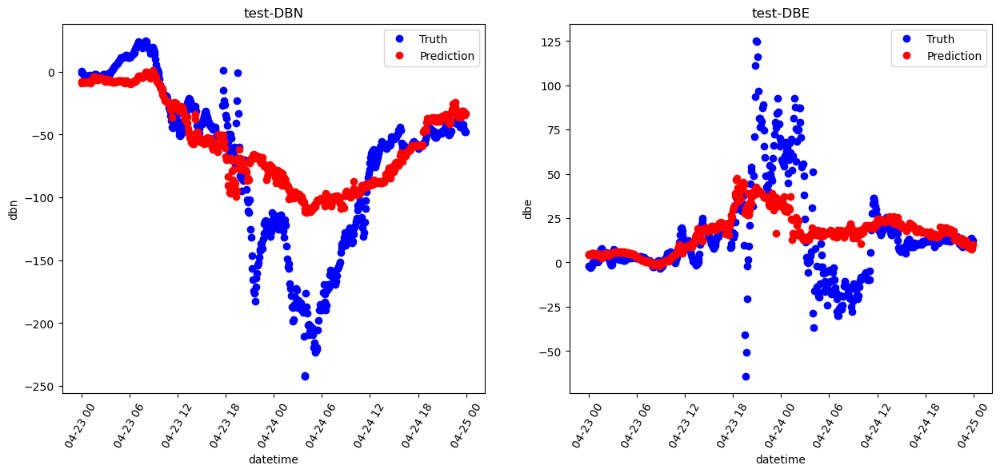

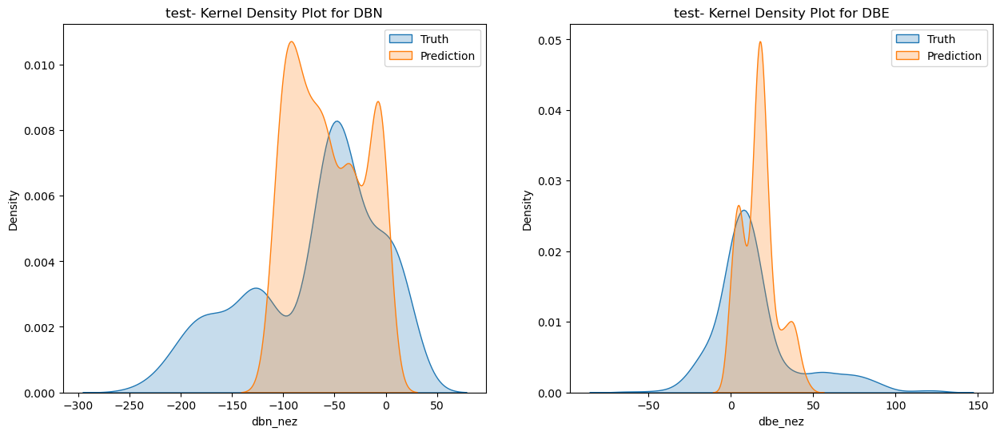

RandomForestRegressor(max_depth=25, max_features=0.3, random_state=2) metrics:
Train MSE: [4.23344531 3.51896559]
Train MAE: [2.69835134 2.2342395 ]
Test MSE: [41.14572645 21.50340706]
Test MAE: [29.04959368 14.01096839]


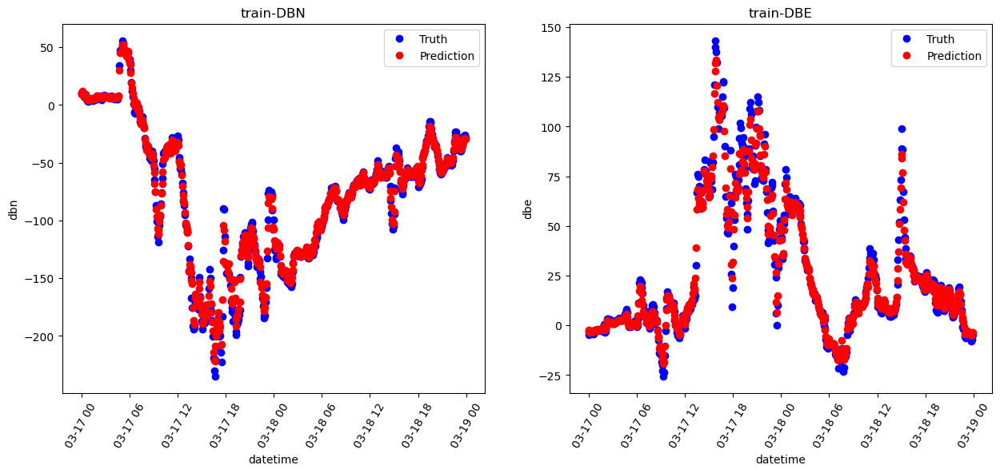

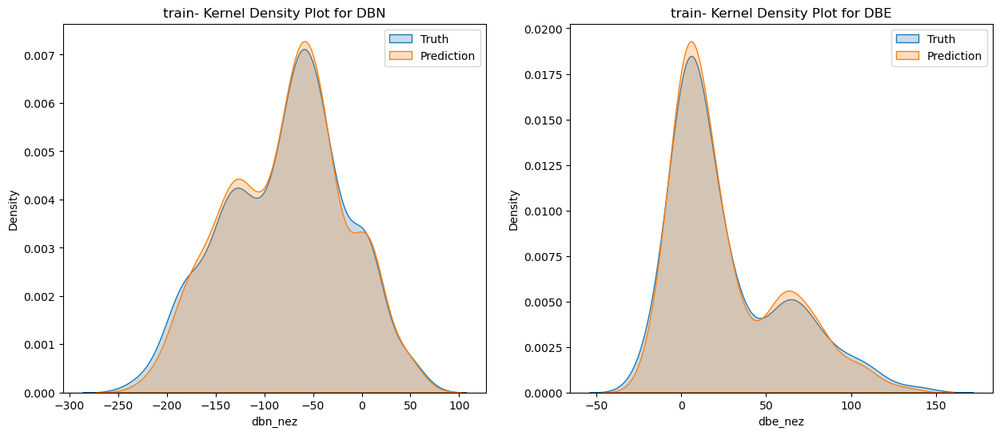

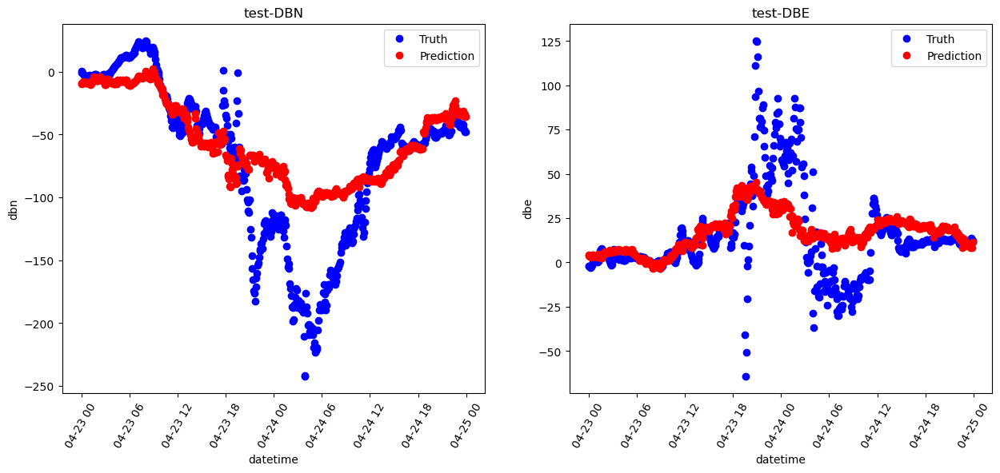

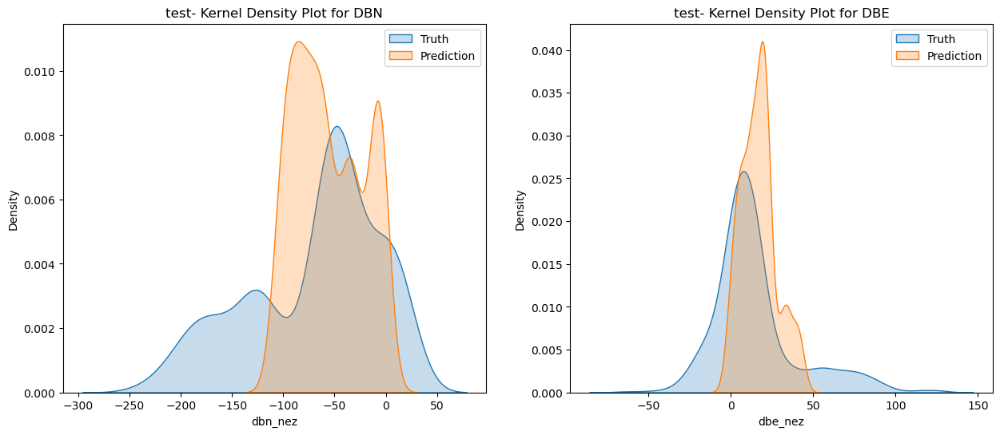

RandomForestRegressor(max_depth=30, max_features=0.3, random_state=2) metrics:
Train MSE: [4.49055055 3.54704392]
Train MAE: [2.77248437 2.15836126]
Test MSE: [40.22445077 22.37292188]
Test MAE: [28.3709603  14.28521879]


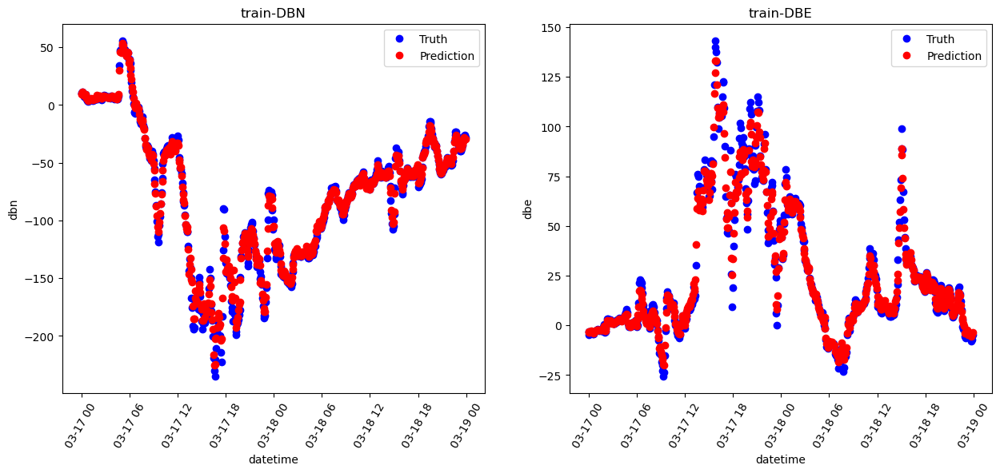

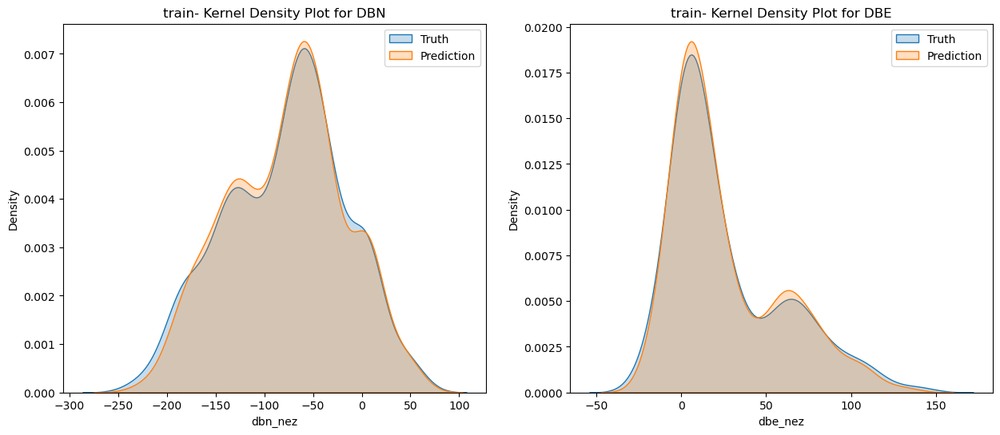

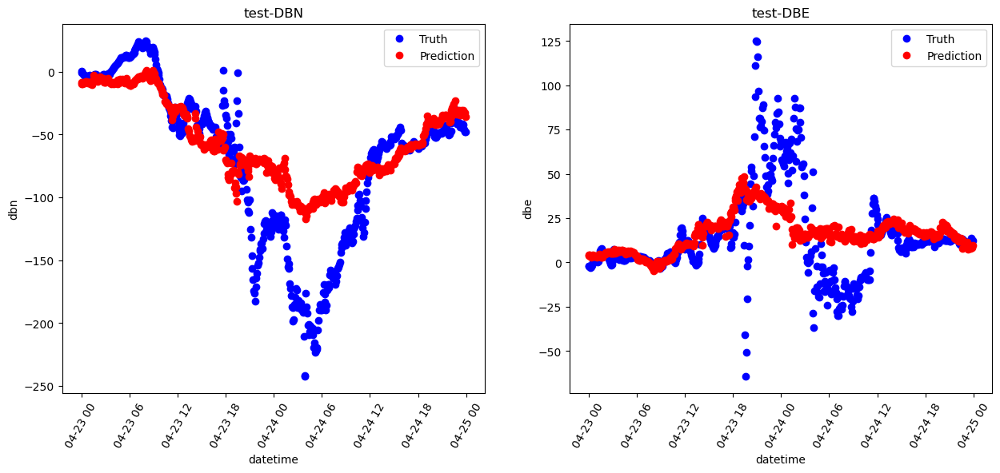

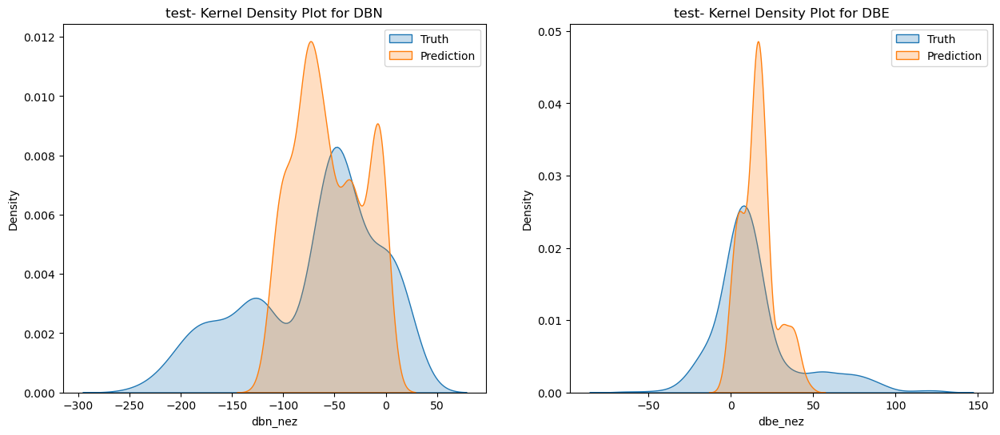

In [197]:
for idx, regr_rf_model in enumerate(regr_rf_models):
    regr_rf_model, regr_rf_two_days_y_train_pred, regr_rf_two_days_y_test_pred = experiment(regr_rf_model, two_days_x_train, two_days_y_train, two_days_x_test, two_days_y_test, regr_rf_model)
    metric_visualization(
            regr_rf_two_days_y_train_pred,
            regr_rf_two_days_y_test_pred,
            targets=["dbn_nez", "dbe_nez"],
            train_sample=two_days_train_data,
            test_sample=two_days_test_data,
            y_train=two_days_y_train,
            y_test=two_days_y_test)

RandomForestRegressor(max_depth=15, max_features='sqrt', random_state=2) metrics:
Train MSE: [8.52262157 6.68455523]
Train MAE: [6.59103843 5.22837605]
Test MSE: [87.05674587 37.43678759]
Test MAE: [83.82763082 32.49444739]


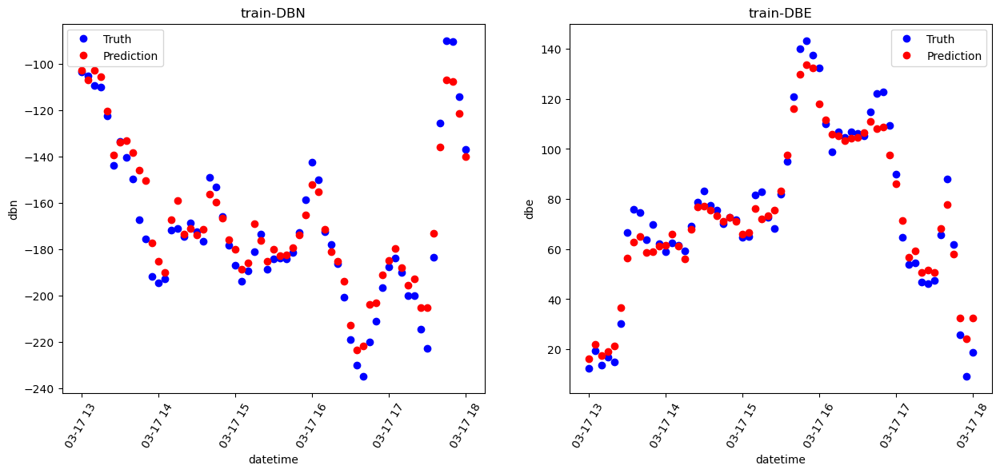

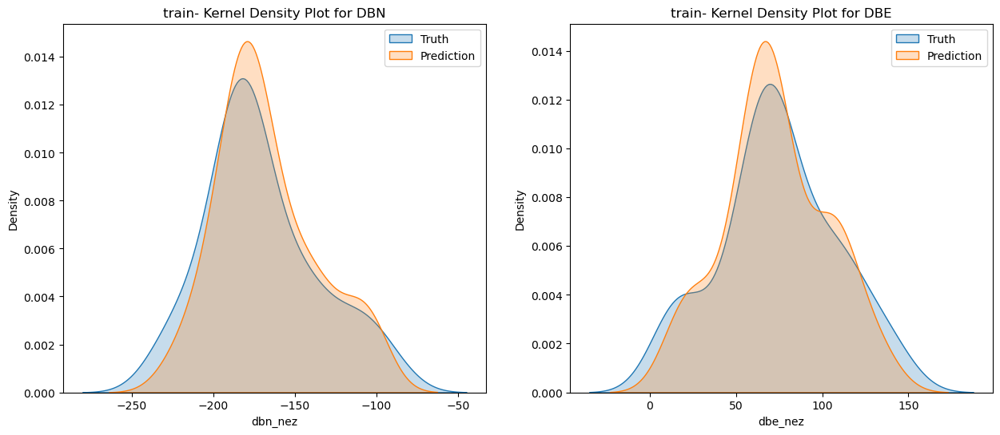

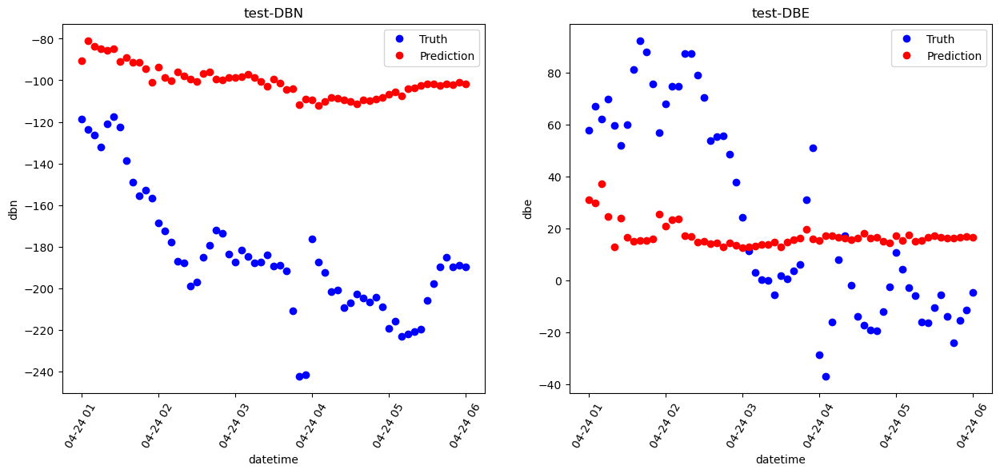

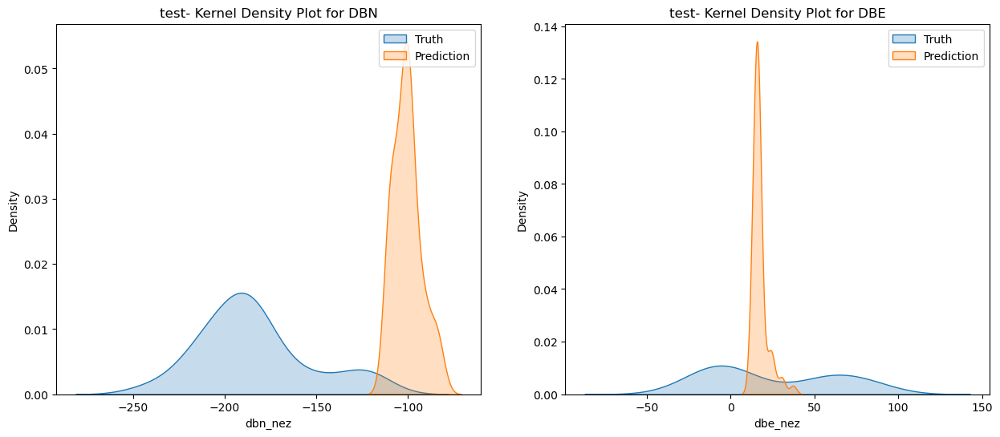

RandomForestRegressor(max_depth=25, max_features='sqrt', random_state=2) metrics:
Train MSE: [7.46145227 6.2821847 ]
Train MAE: [5.60154942 4.87301684]
Test MSE: [88.3254177  35.92715927]
Test MAE: [84.92368238 31.31279996]


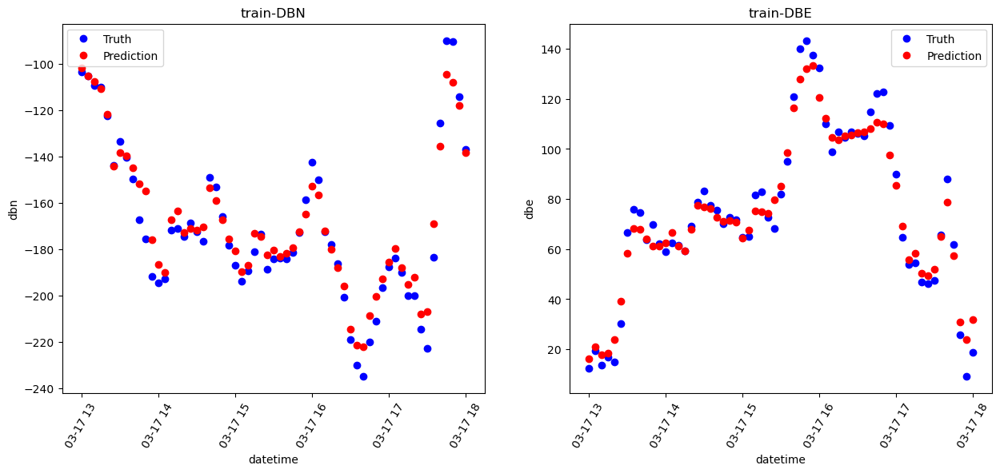

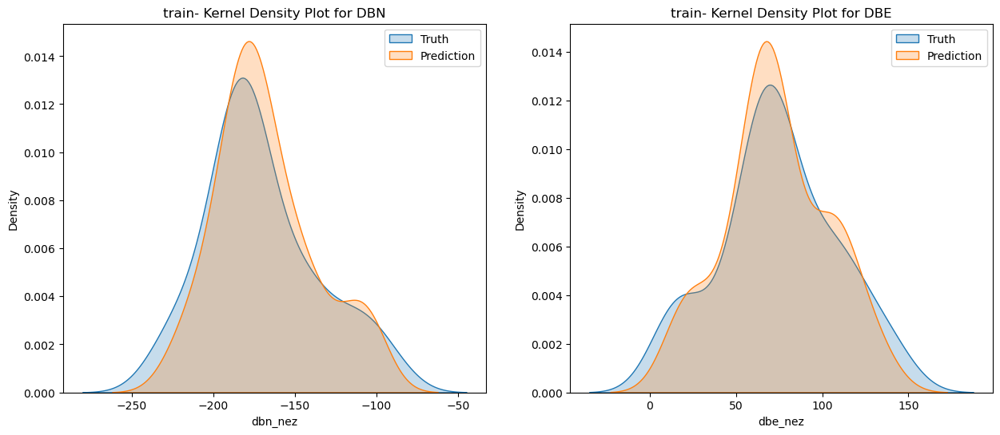

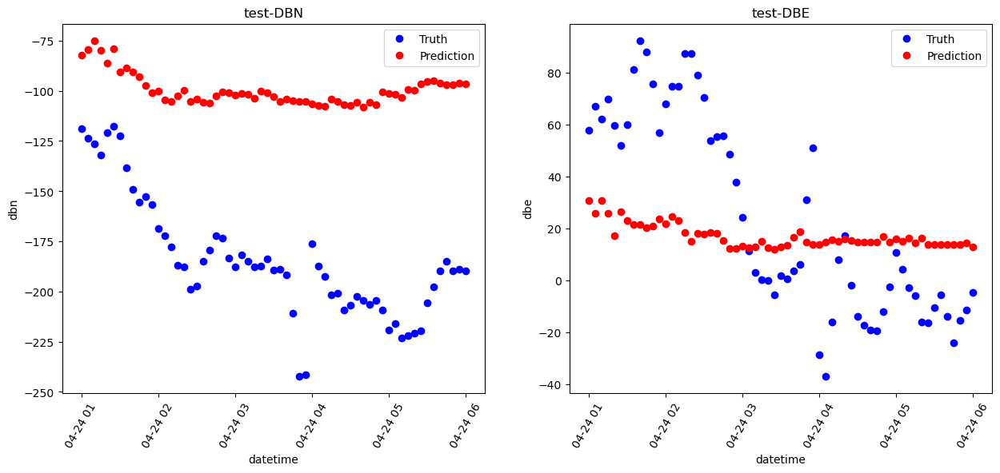

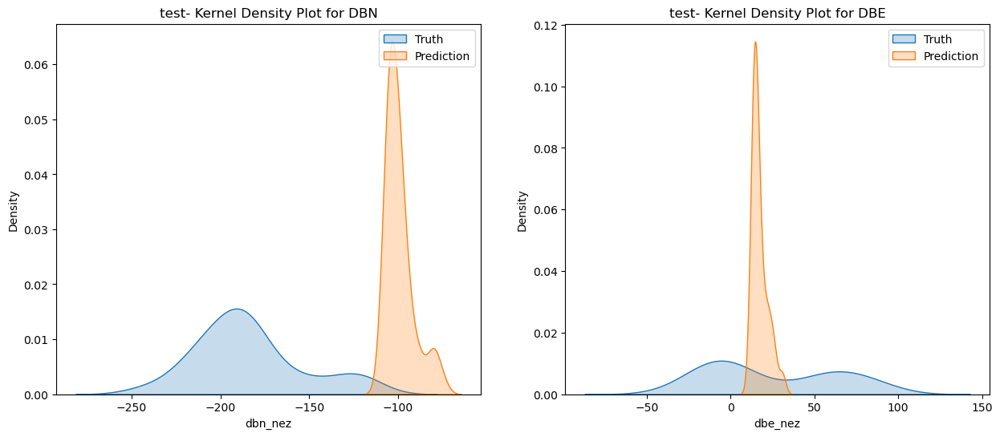

RandomForestRegressor(max_depth=30, max_features='sqrt', random_state=2) metrics:
Train MSE: [8.58576789 6.53313552]
Train MAE: [6.79461265 4.78042972]
Test MSE: [85.6137291  38.42941478]
Test MAE: [82.6923143  33.59960516]


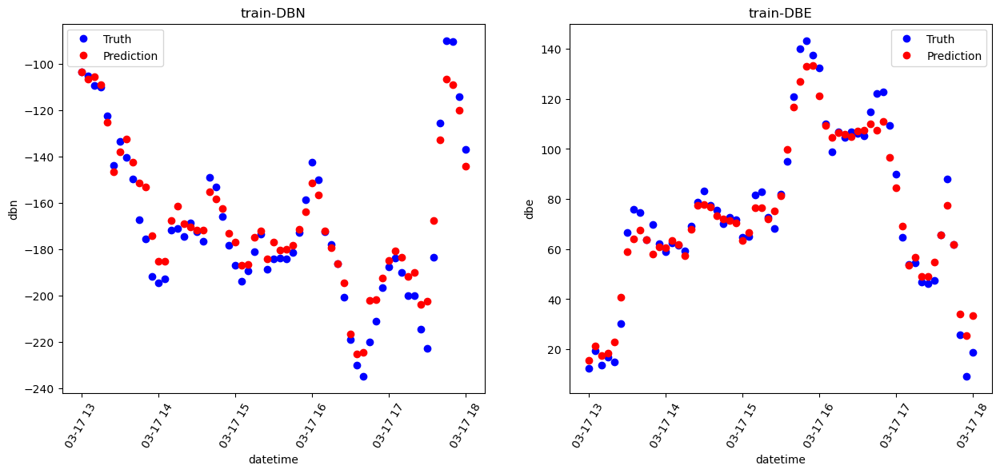

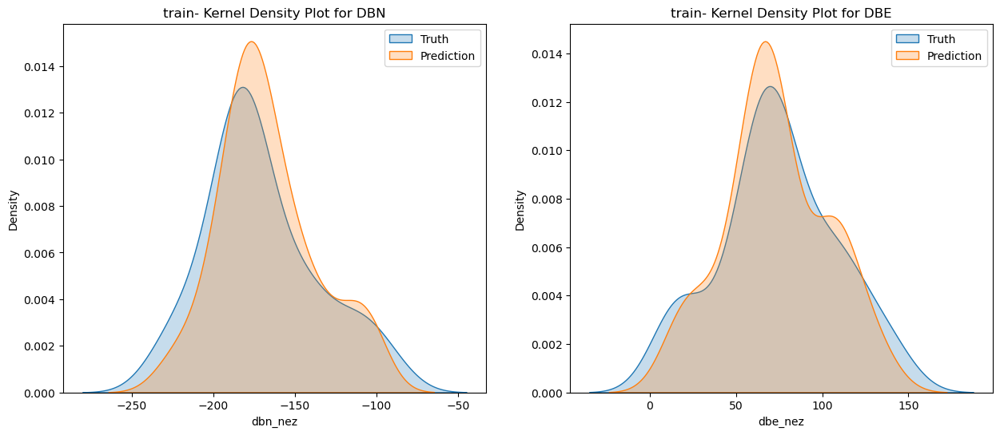

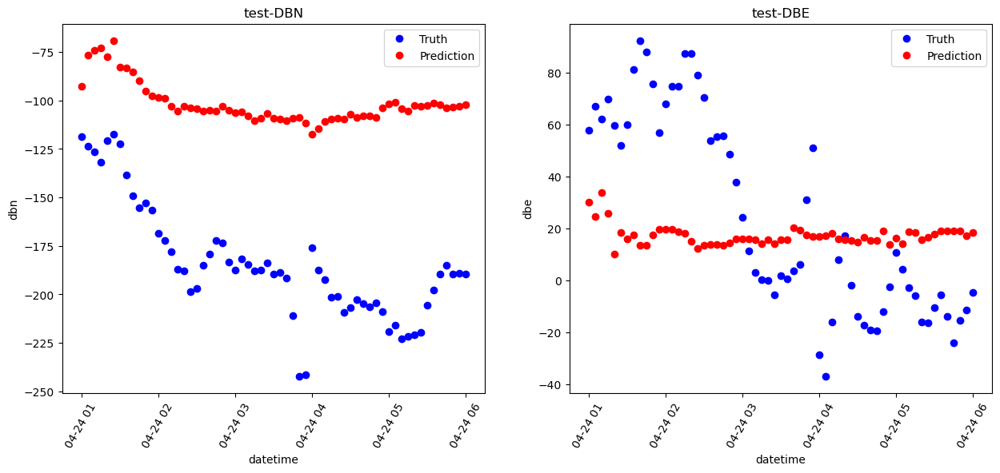

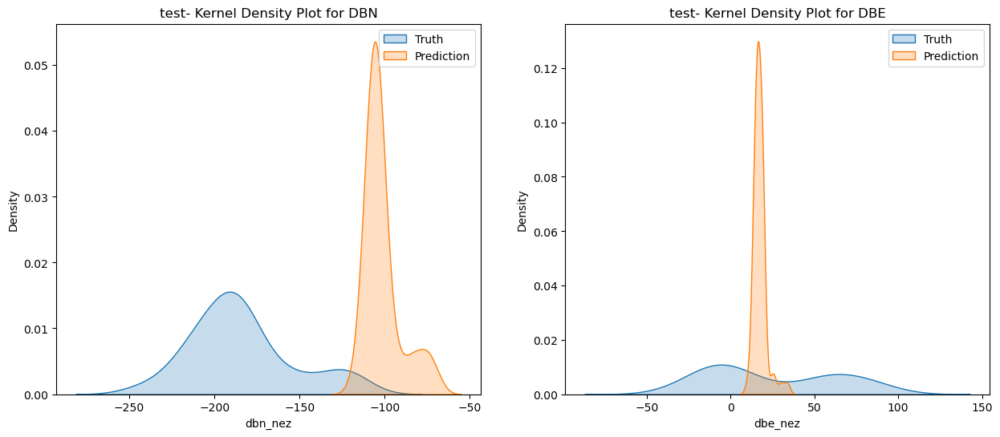

RandomForestRegressor(max_depth=15, max_features=0.5, random_state=2) metrics:
Train MSE: [7.94105106 6.10625772]
Train MAE: [5.76604076 4.90383635]
Test MSE: [72.84747339 34.93940028]
Test MAE: [68.60966144 31.04029513]


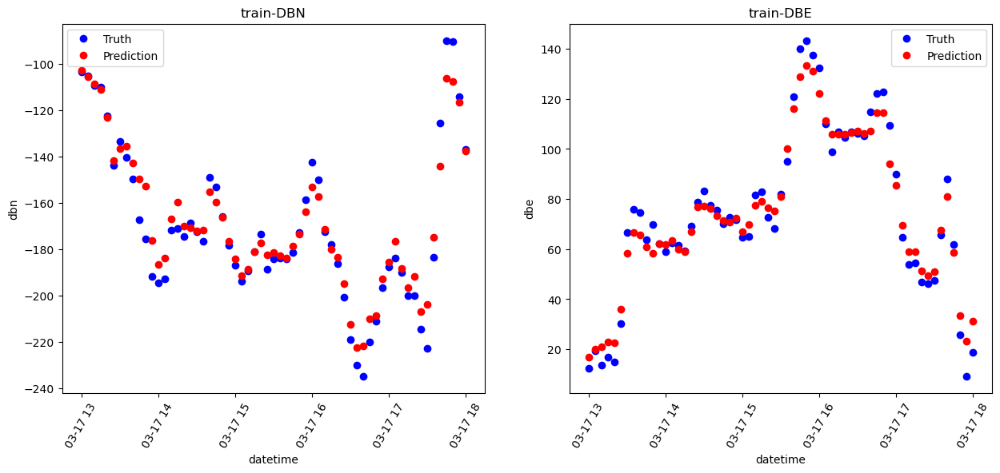

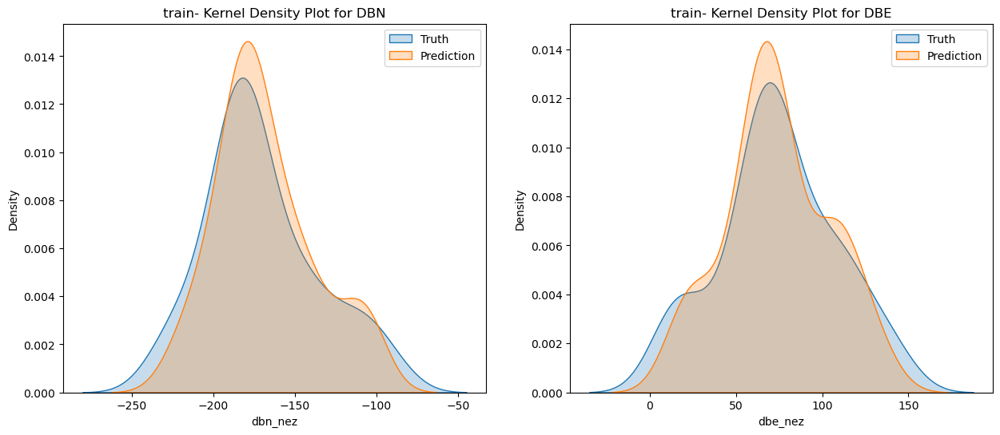

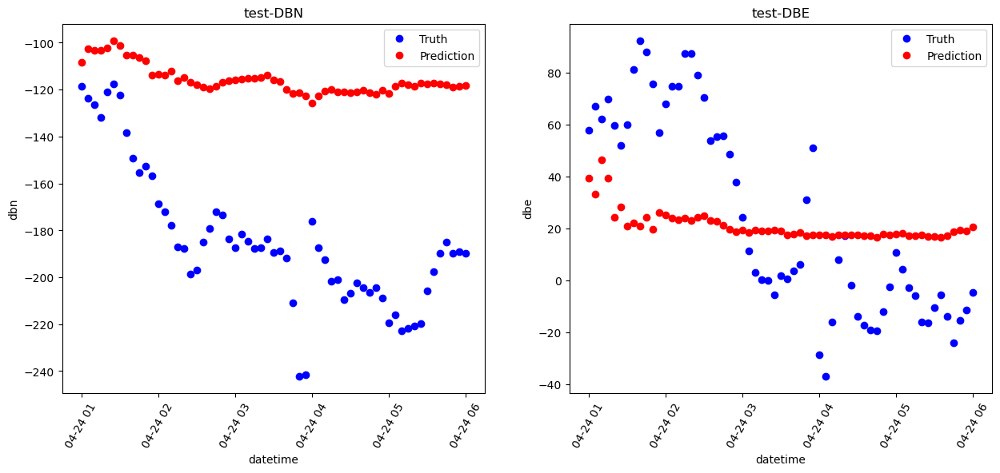

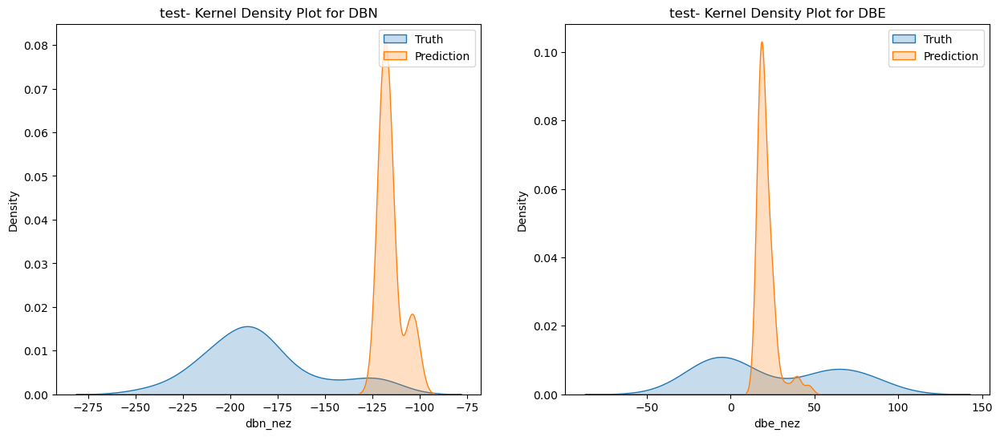

RandomForestRegressor(max_depth=25, max_features=0.5, random_state=2) metrics:
Train MSE: [7.76300882 6.29355246]
Train MAE: [5.77003404 5.02113551]
Test MSE: [74.58104734 36.97607299]
Test MAE: [70.5068834  32.66159521]


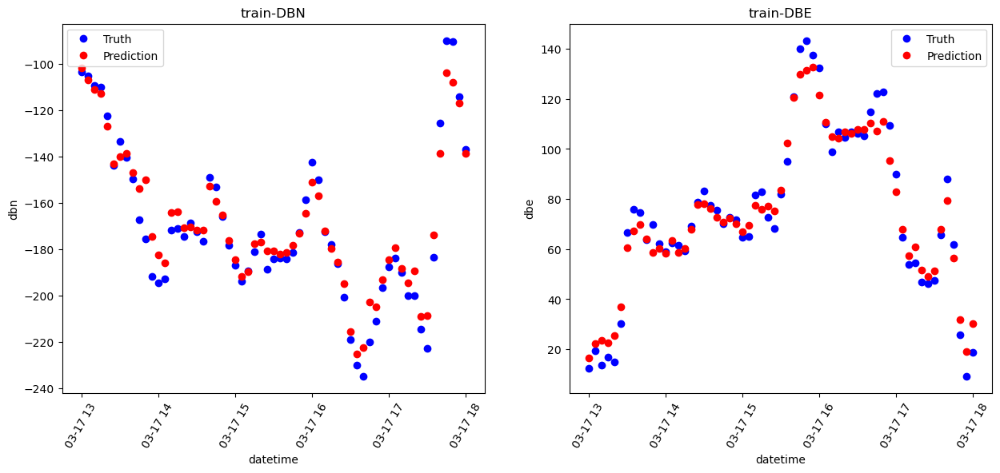

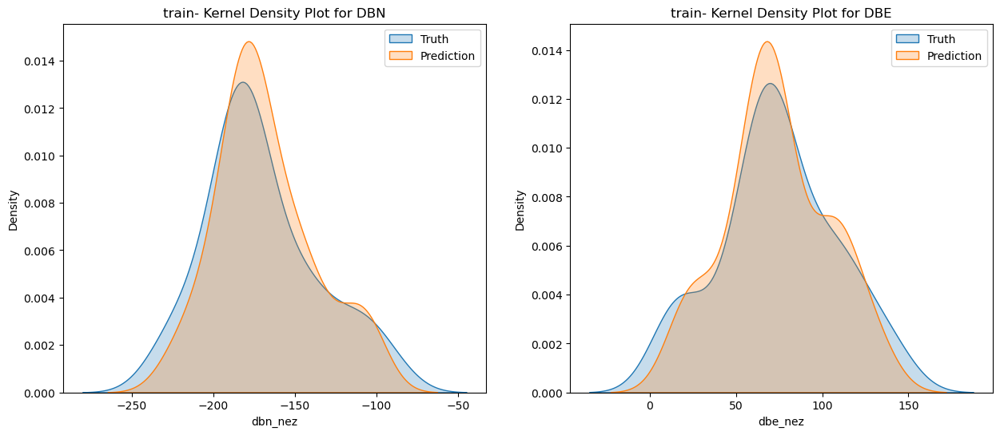

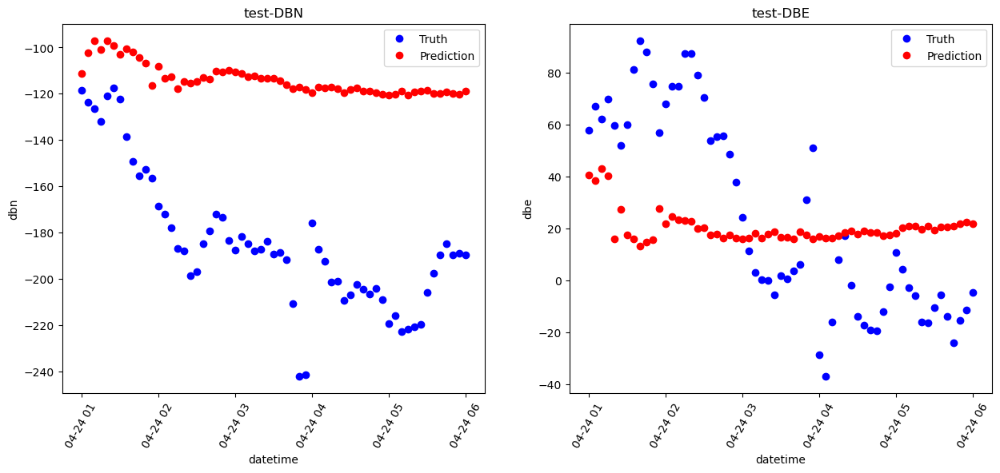

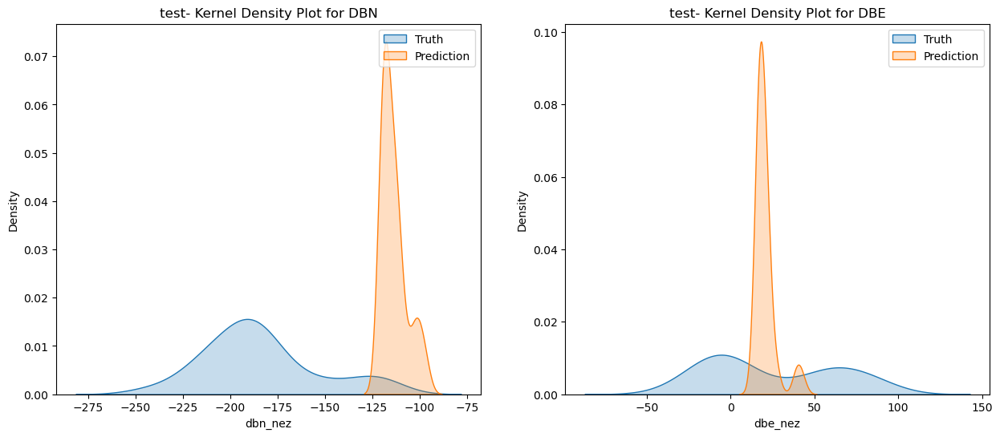

RandomForestRegressor(max_depth=30, max_features=0.5, random_state=2) metrics:
Train MSE: [8.13439008 6.69350542]
Train MAE: [6.26146105 5.15019834]
Test MSE: [74.29716433 36.34967684]
Test MAE: [70.2012496  32.50888254]


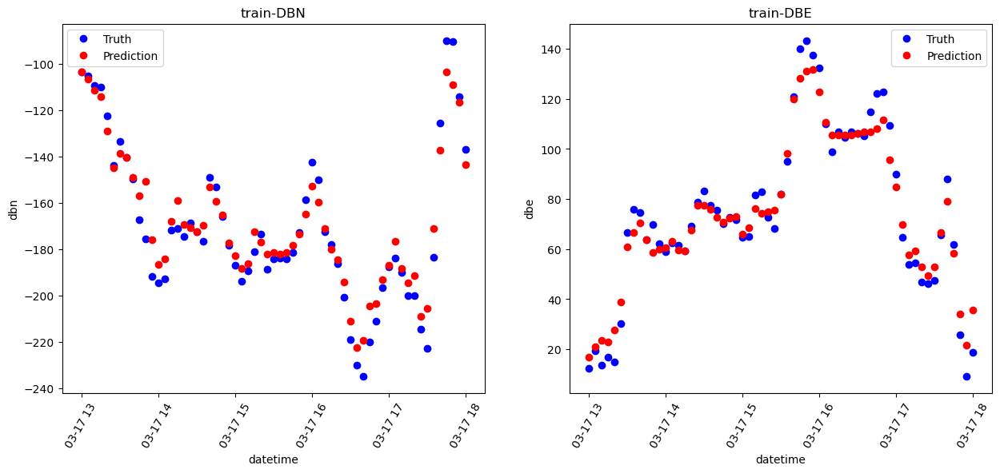

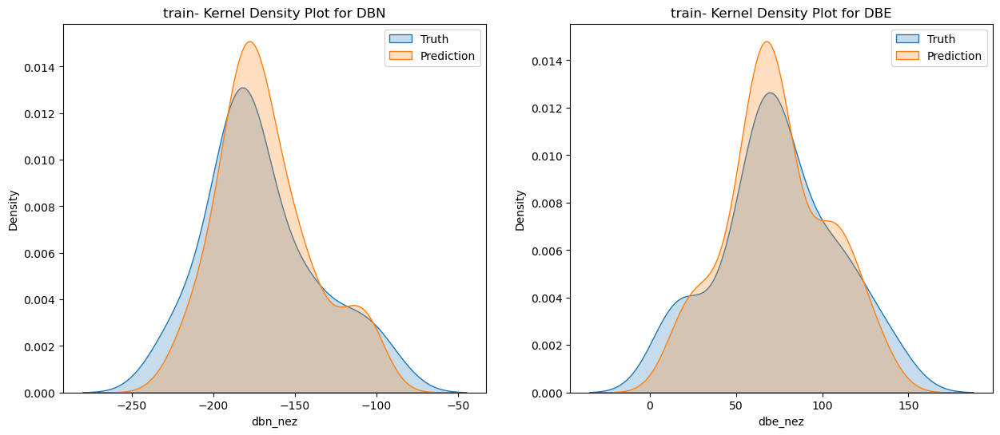

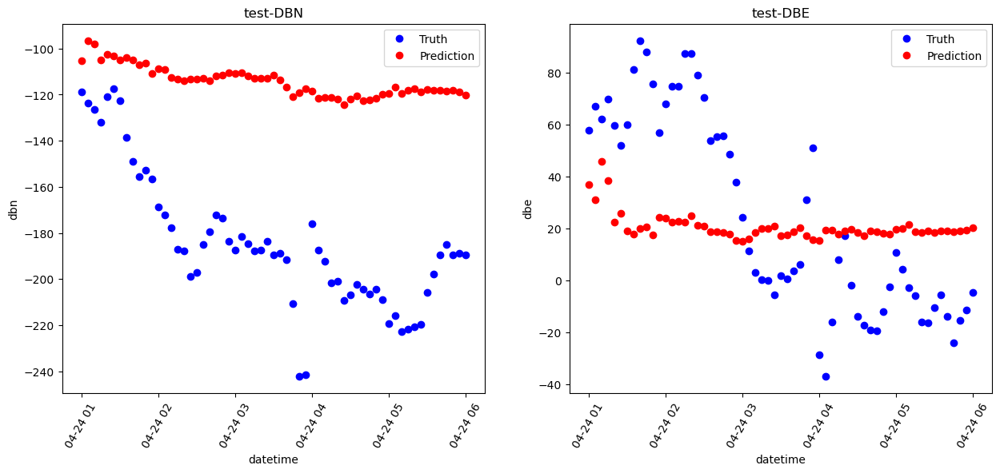

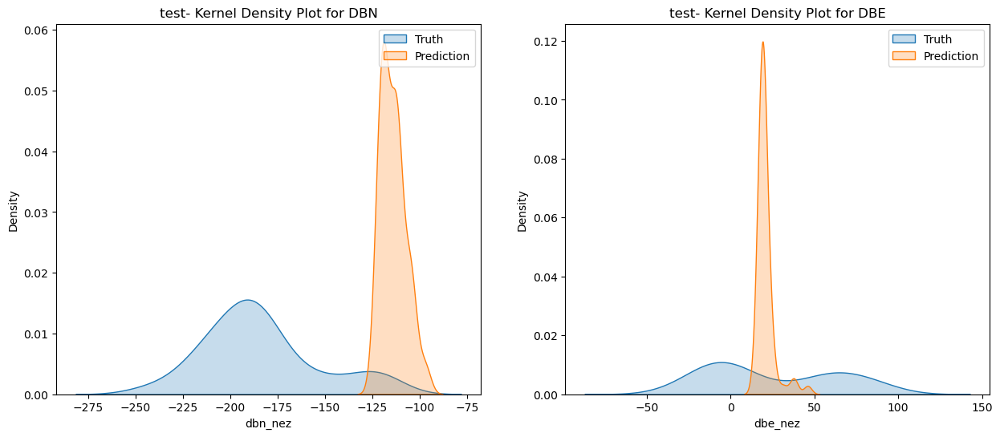

RandomForestRegressor(max_depth=15, max_features=0.8, random_state=2) metrics:
Train MSE: [7.97036041 6.28151302]
Train MAE: [6.24126837 5.09878162]
Test MSE: [69.02938457 37.97419096]
Test MAE: [64.59158759 34.73113507]


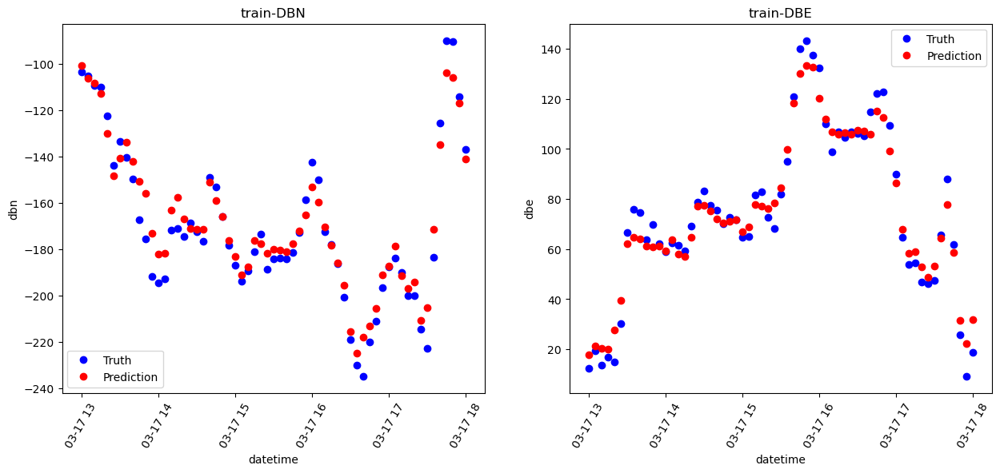

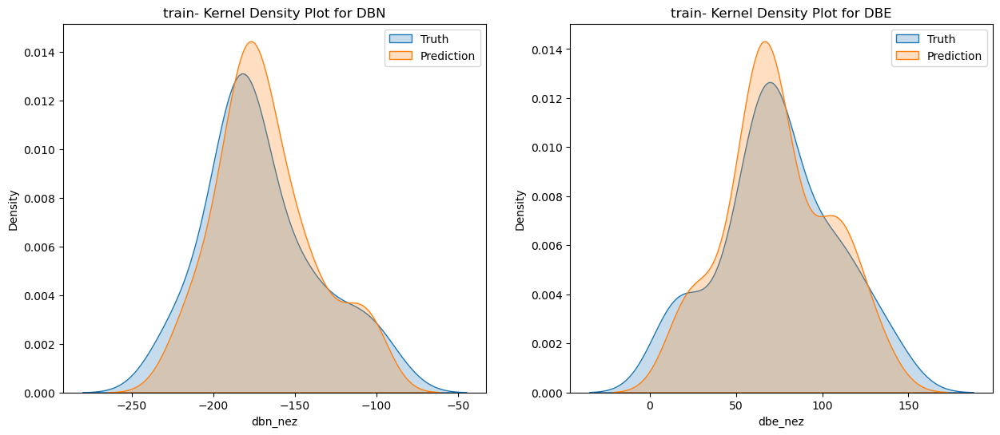

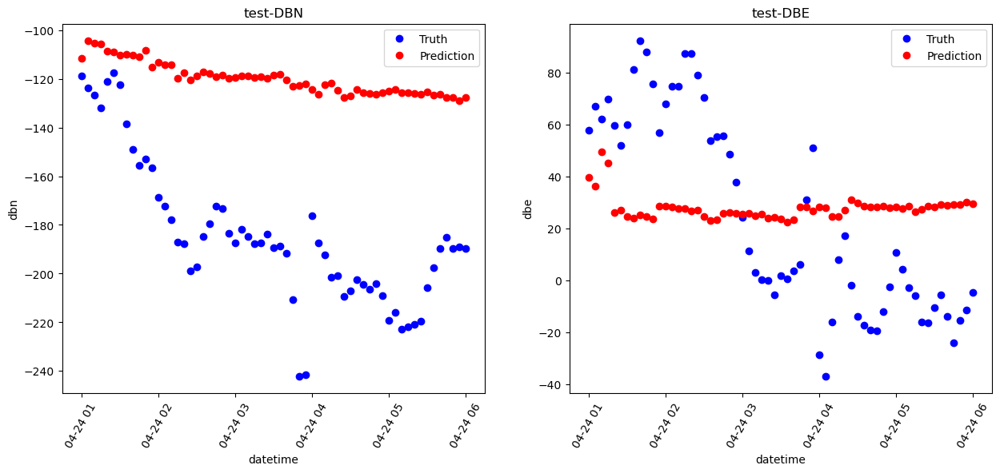

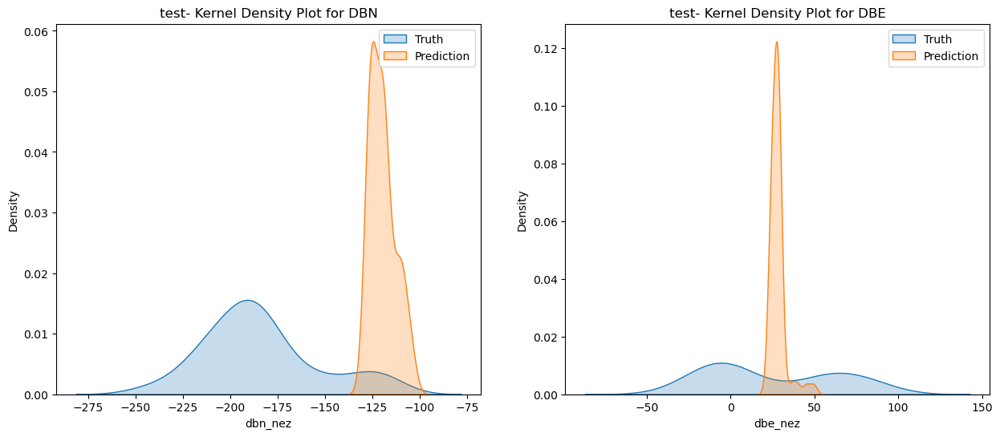

RandomForestRegressor(max_depth=25, max_features=0.8, random_state=2) metrics:
Train MSE: [7.56995141 6.15149669]
Train MAE: [5.70847866 4.84513538]
Test MSE: [69.06876415 37.18803825]
Test MAE: [64.28581251 34.03405003]


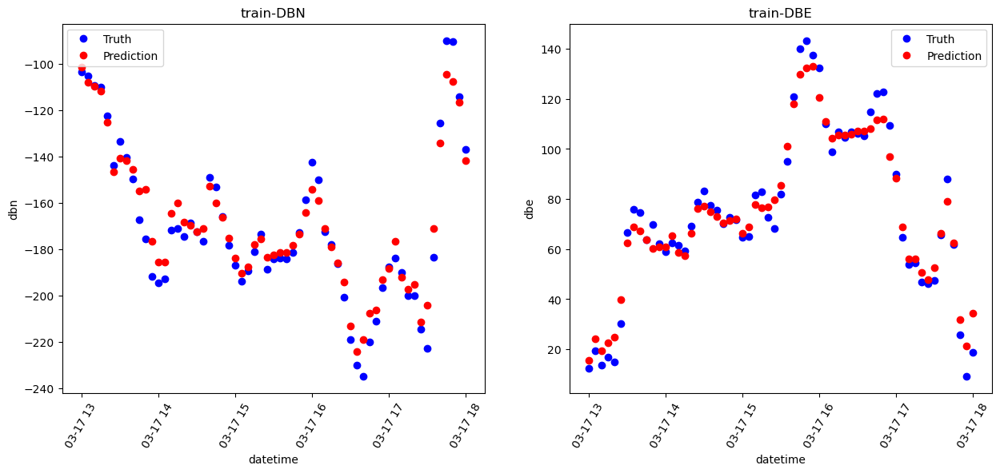

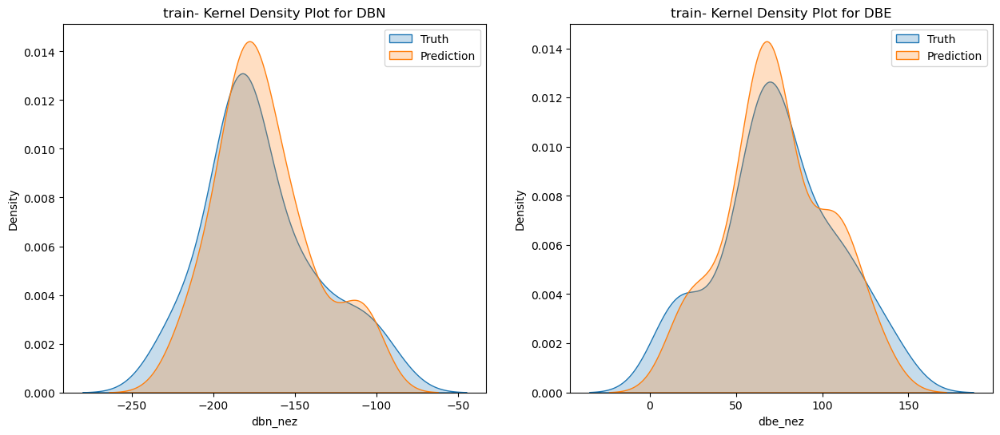

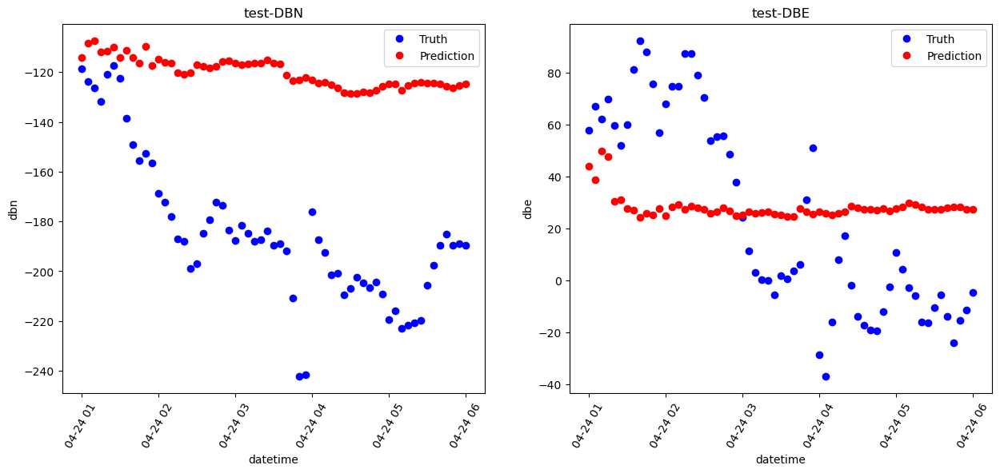

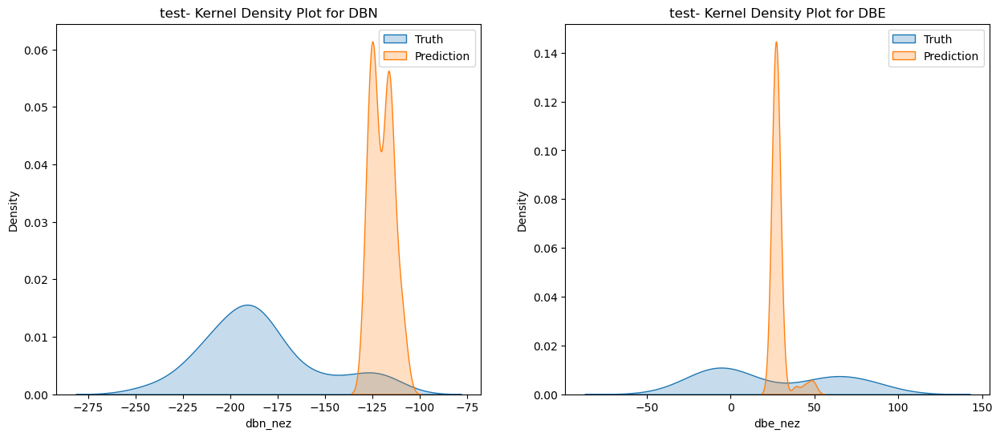

RandomForestRegressor(max_depth=30, max_features=0.8, random_state=2) metrics:
Train MSE: [7.60978395 6.10300712]
Train MAE: [5.7949974  4.86330786]
Test MSE: [69.82068435 38.27705228]
Test MAE: [65.14246148 35.26531516]


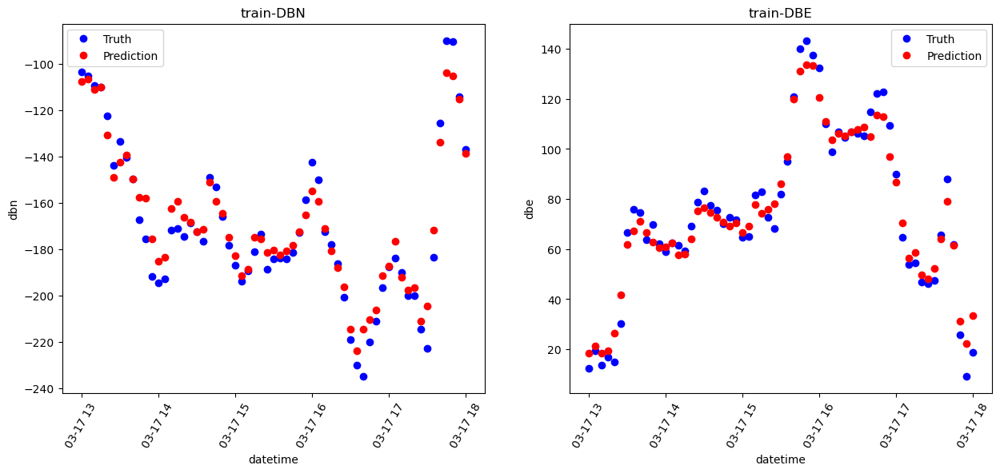

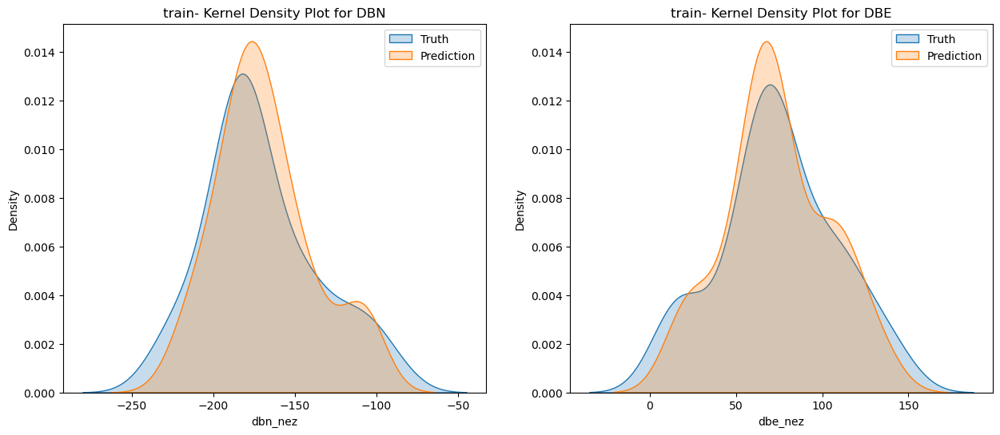

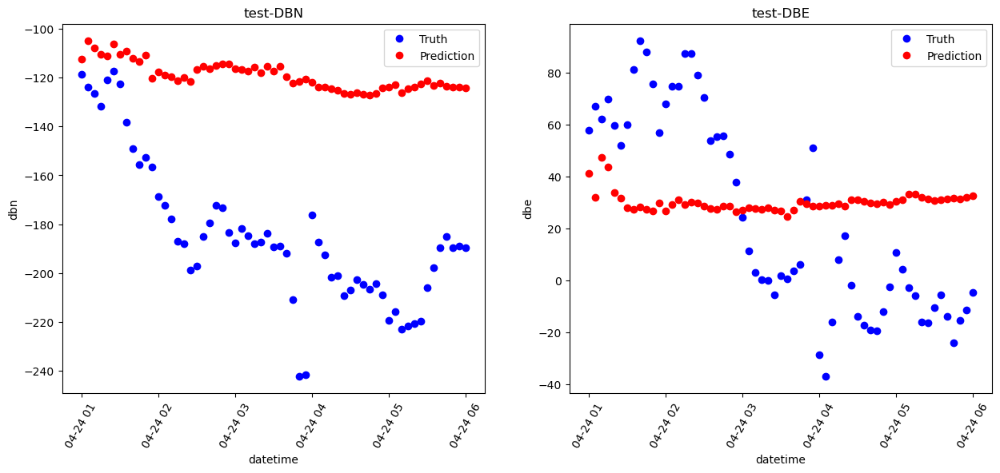

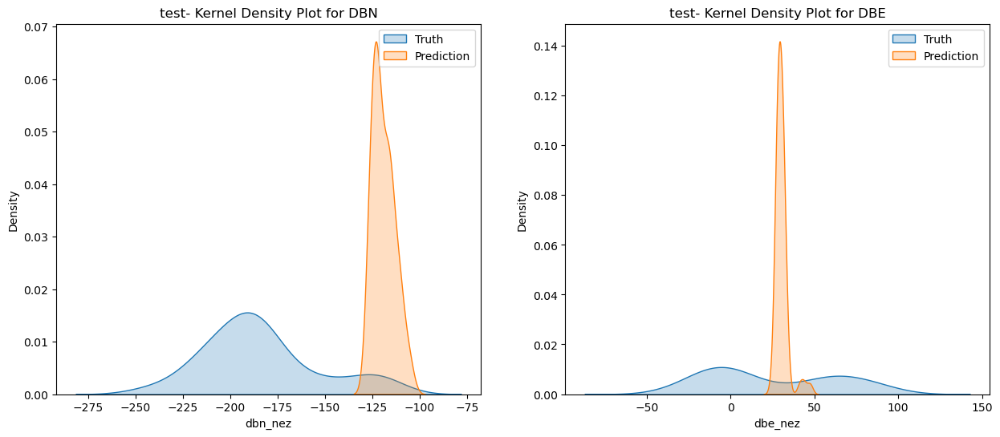

RandomForestRegressor(max_depth=15, max_features=0.3, random_state=2) metrics:
Train MSE: [8.52262157 6.68455523]
Train MAE: [6.59103843 5.22837605]
Test MSE: [87.05674587 37.43678759]
Test MAE: [83.82763082 32.49444739]


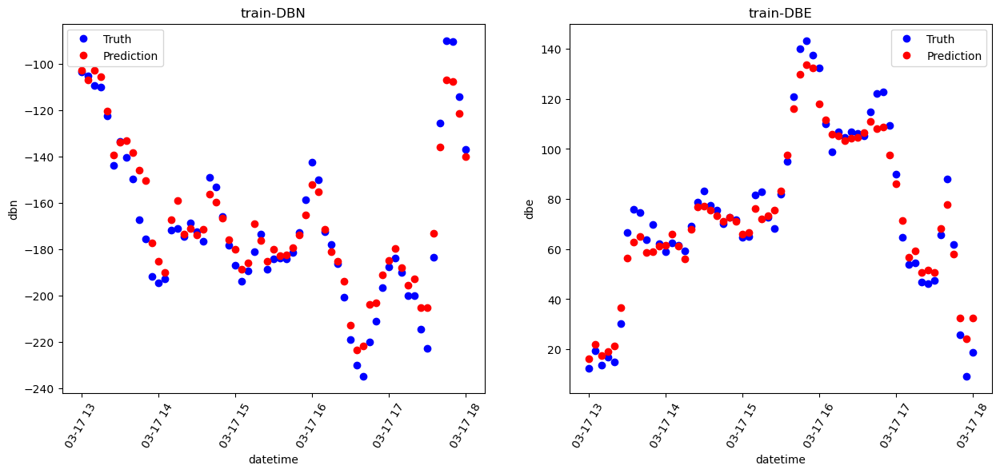

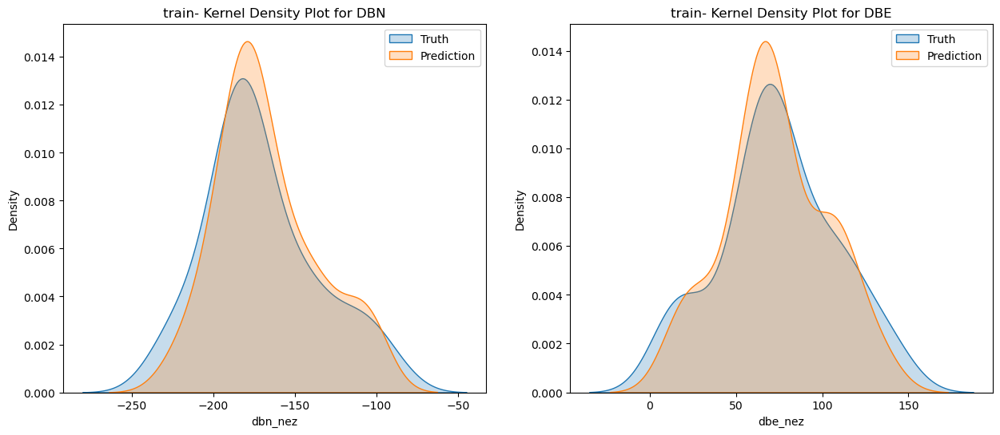

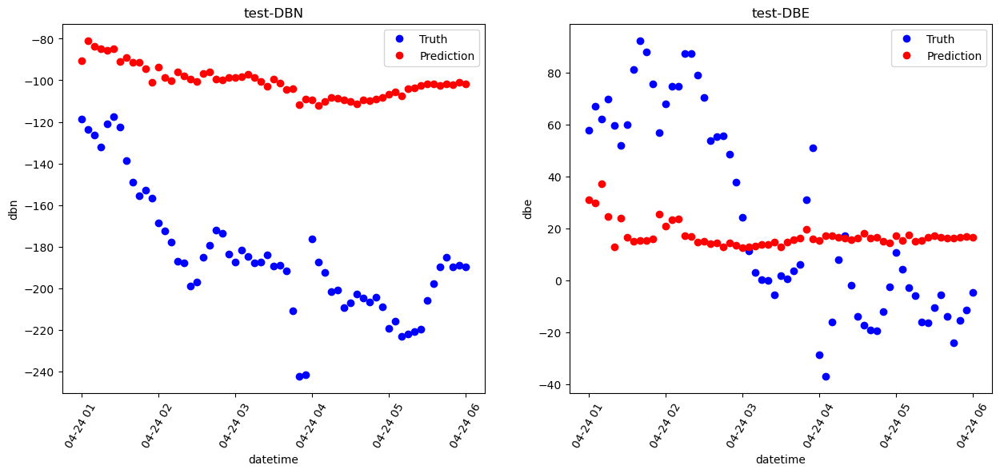

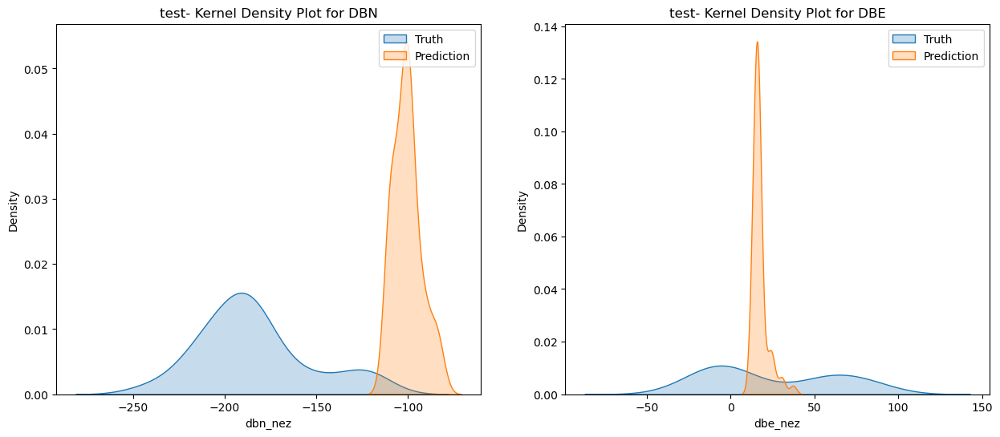

RandomForestRegressor(max_depth=25, max_features=0.3, random_state=2) metrics:
Train MSE: [7.46145227 6.2821847 ]
Train MAE: [5.60154942 4.87301684]
Test MSE: [88.3254177  35.92715927]
Test MAE: [84.92368238 31.31279996]


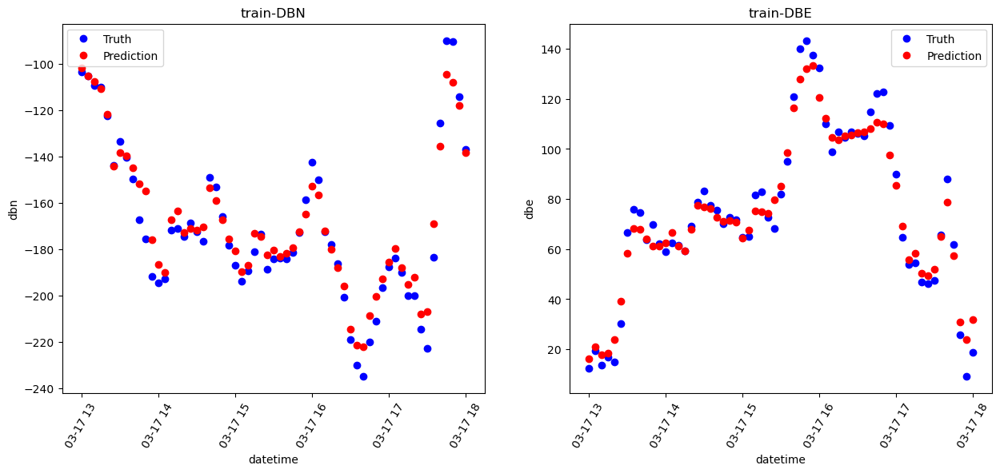

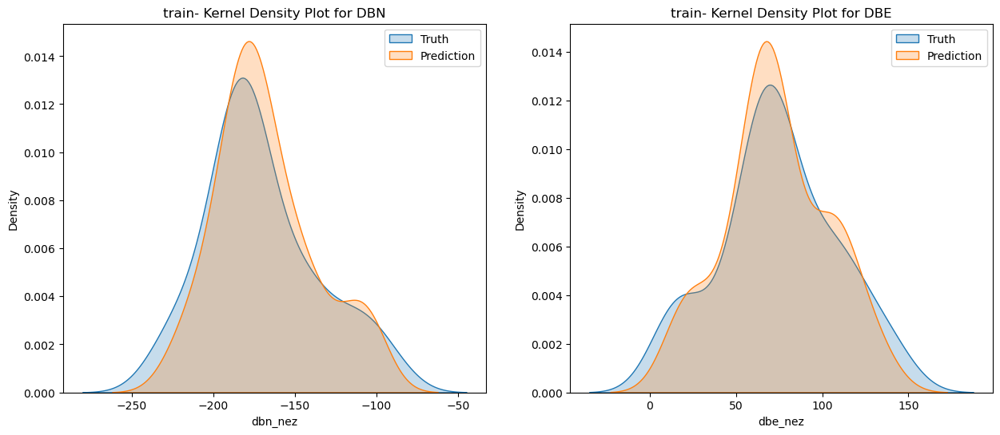

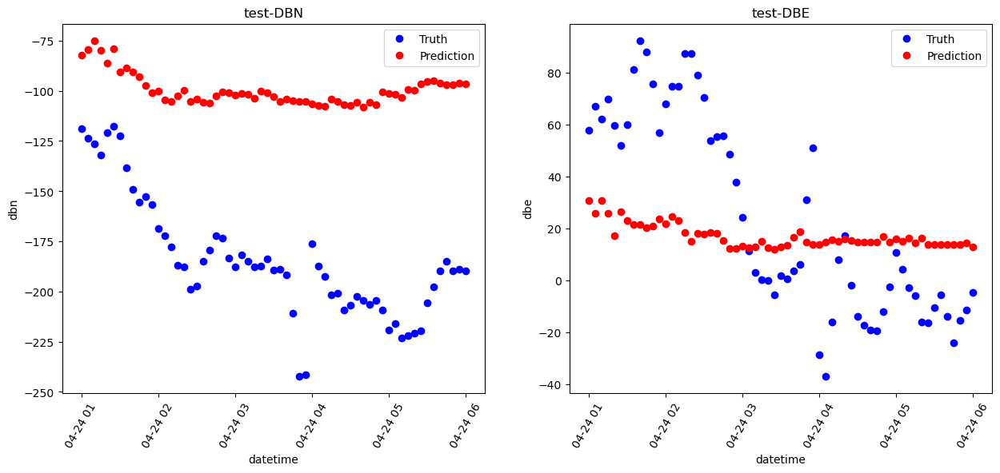

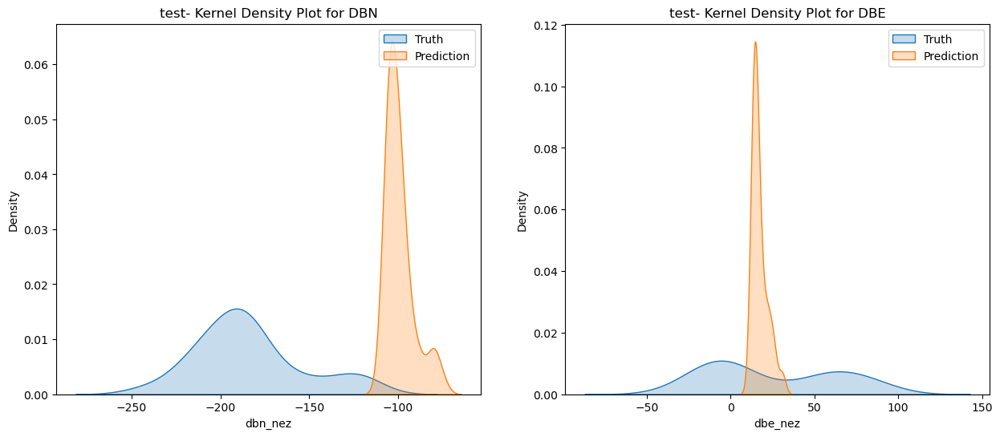

RandomForestRegressor(max_depth=30, max_features=0.3, random_state=2) metrics:
Train MSE: [8.58576789 6.53313552]
Train MAE: [6.79461265 4.78042972]
Test MSE: [85.6137291  38.42941478]
Test MAE: [82.6923143  33.59960516]


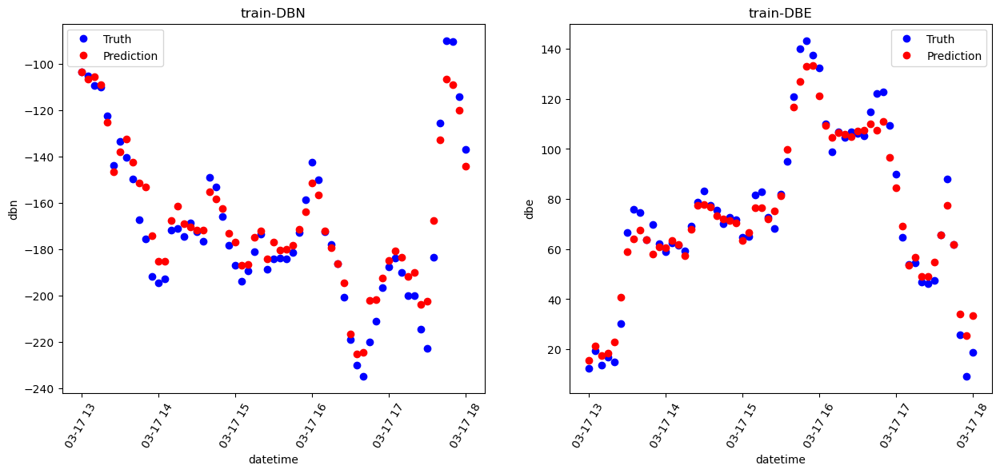

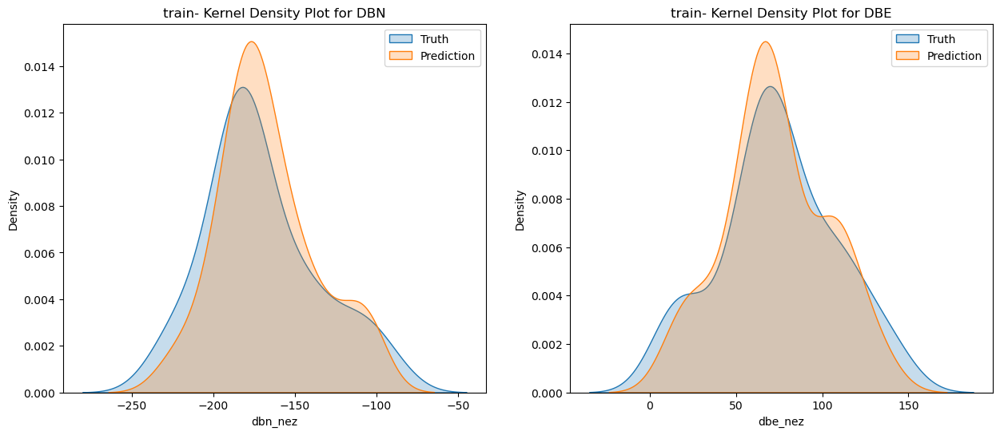

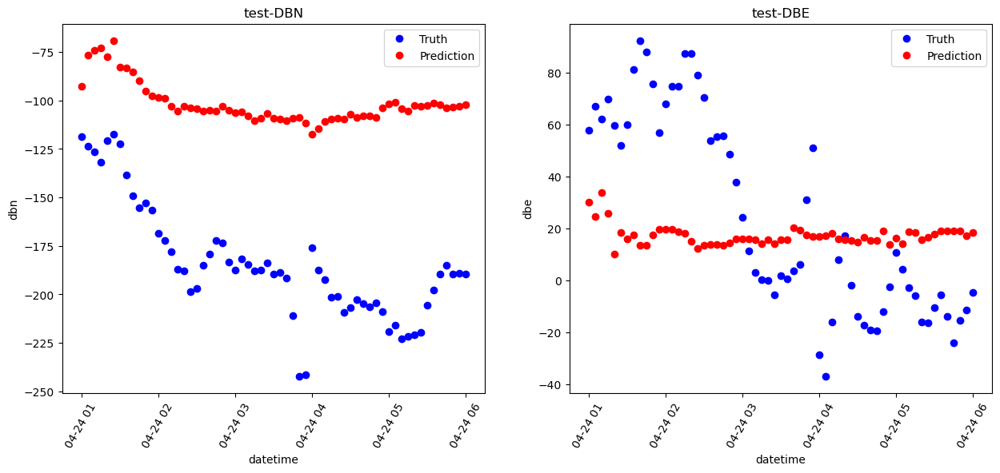

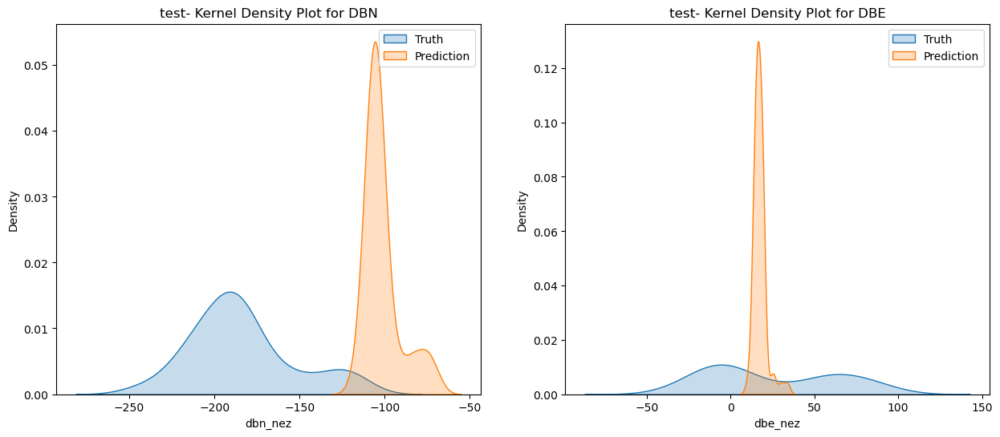

In [198]:
for idx, regr_rf_model in enumerate(regr_rf_models):
    regr_rf_model, regr_rf_hours_y_train_pred, regr_rf_hours_y_test_pred = experiment(regr_rf_model, hours_x_train, hours_y_train, hours_x_test, hours_y_test, regr_rf_model)
    metric_visualization(
            regr_rf_hours_y_train_pred,
            regr_rf_hours_y_test_pred,
            targets=["dbn_nez", "dbe_nez"],
            train_sample=hours_train_data,
            test_sample=hours_test_data,
            y_train=hours_y_train,
            y_test=hours_y_test)

In [201]:
train_dataset_subsample['BX_GSE'].shift(3)

0           NaN
1           NaN
2           NaN
3          0.08
4          0.08
           ... 
1051771    0.34
1051772   -1.12
1051773   -1.25
1051774    0.24
1051775   -1.38
Name: BX_GSE, Length: 1051776, dtype: float64

##### Historical Features

In [225]:
from sklearn.ensemble import RandomForestRegressor
# RandomForestRegressor(max_depth=15, max_features=0.5, random_state=2)
max_depth = 30
regr_rf = RandomForestRegressor(n_estimators=100, max_depth=15,  max_features=0.5, random_state=2)
regr_rf.fit(x_train, y_train)

RandomForestRegressor(max_depth=15, max_features=0.5, random_state=2)

regression_rf metrics:
Train MSE: [4.97520404 4.27909972]
Train MAE: [3.70458617 3.04557205]
Test MSE: [7.47291764 5.74408967]
Test MAE: [5.25959622 3.94311857]


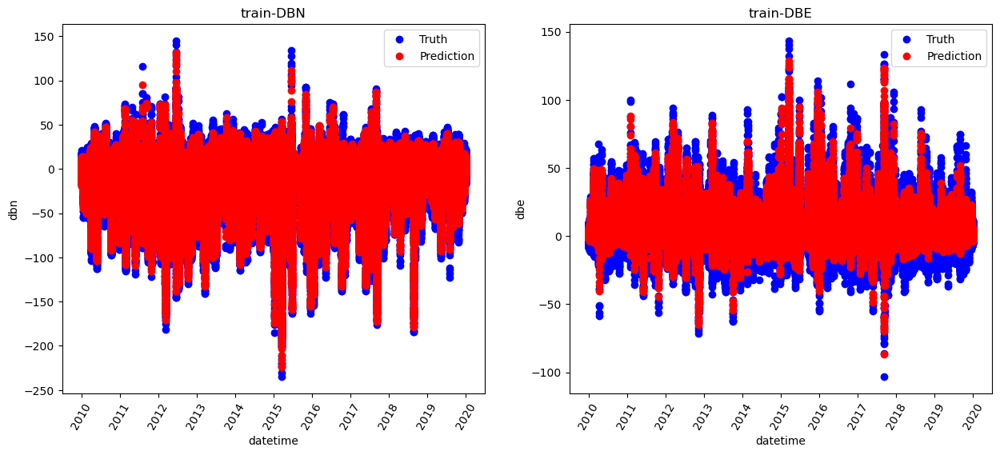

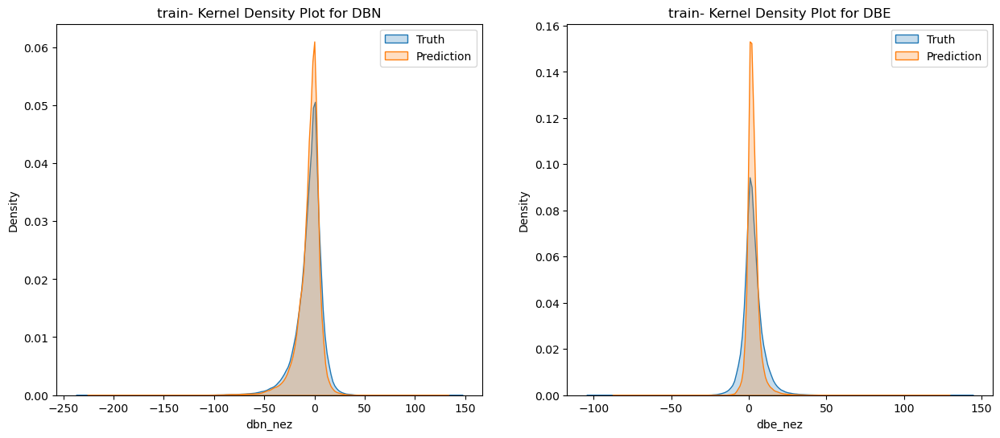

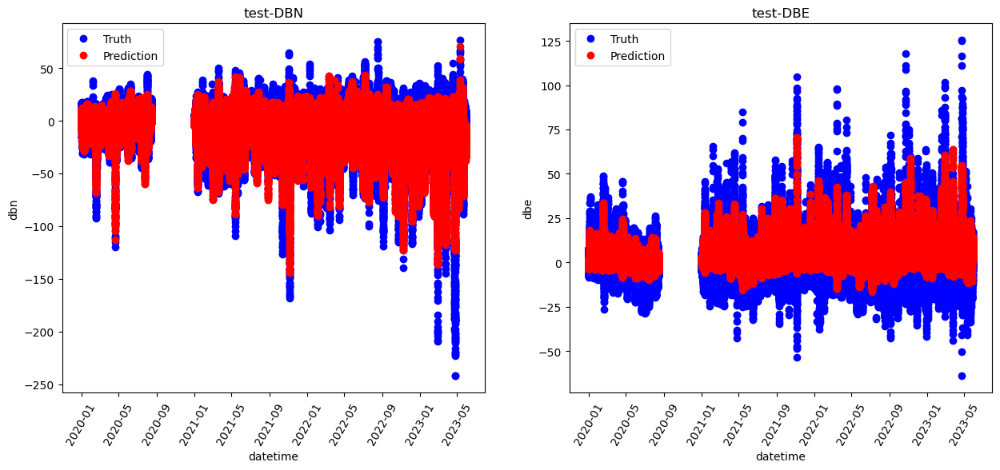

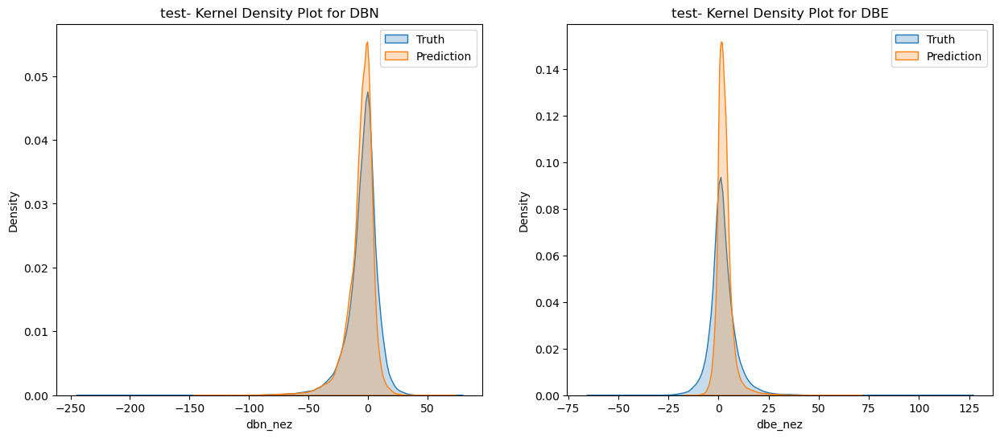

In [226]:
regr_rf, rf_y_train_pred, rf_y_test_pred = experiment(regr_rf, x_train, y_train, x_test, y_test, "regression_rf")
metric_visualization(rf_y_train_pred,
                     rf_y_test_pred,
                     train_sample=train_dataset_subsample,
                     test_sample=test_dataset_subsample,
                     y_train=y_train,
                     y_test=y_test)

regr_rf metrics:
Train MSE: [6.36737314 5.74890195]
Train MAE: [4.88508351 4.23994018]
Test MSE: [33.53045252 22.19568464]
Test MAE: [23.68836636 14.58006456]


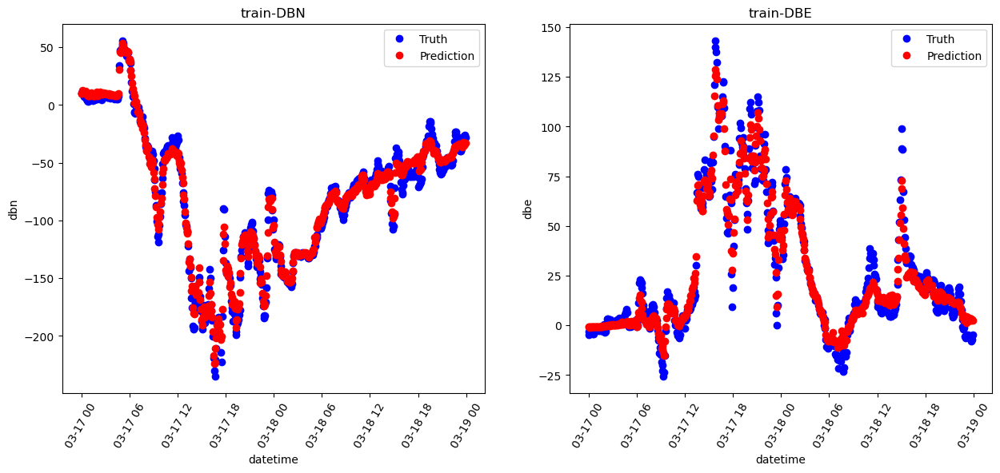

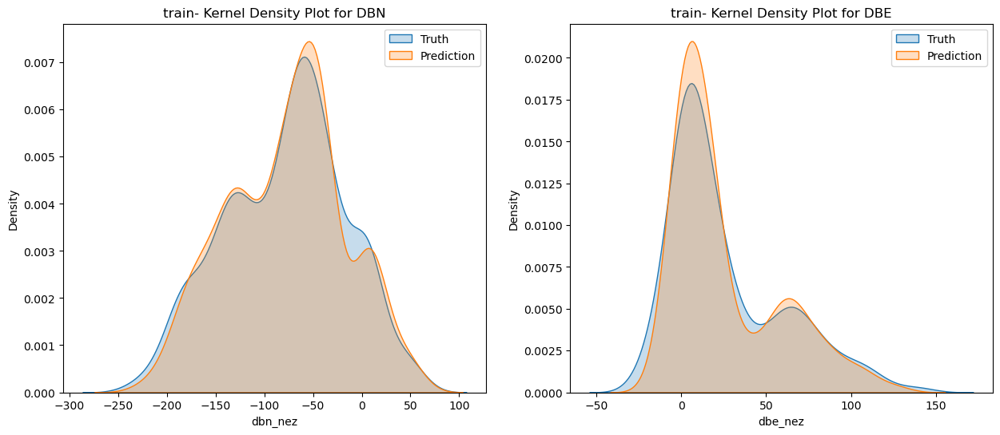

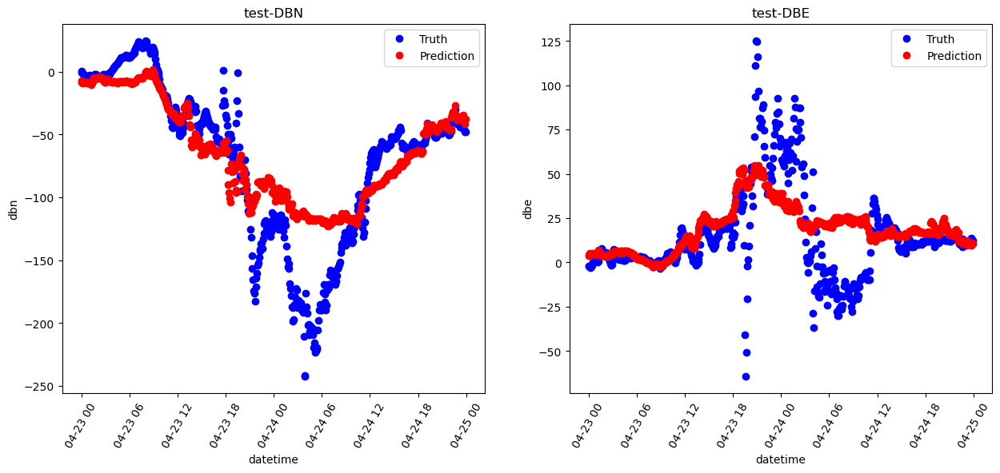

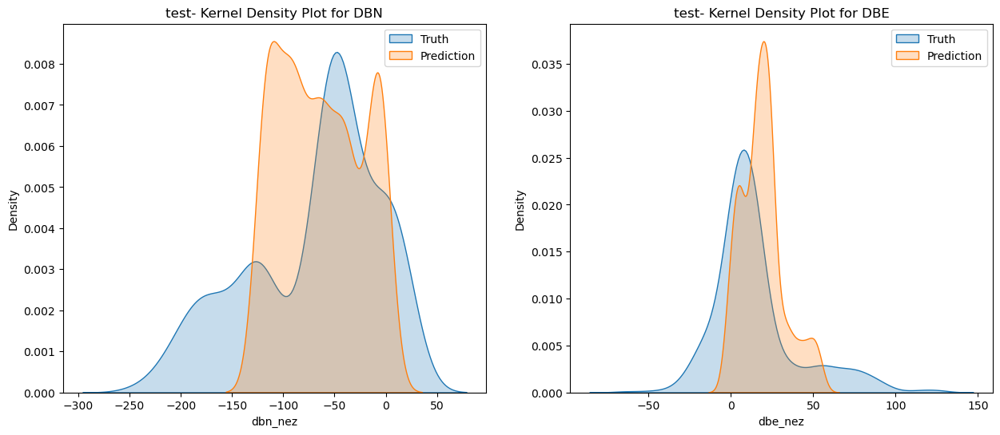

In [227]:
regr_rf, regr_rf_two_days_y_train_pred, regr_rf_two_days_y_test_pred = experiment(regr_rf, two_days_x_train, two_days_y_train, two_days_x_test, two_days_y_test, "regr_rf")
metric_visualization(
        regr_rf_two_days_y_train_pred,
        regr_rf_two_days_y_test_pred,
        targets=["dbn_nez", "dbe_nez"],
        train_sample=two_days_train_data,
        test_sample=two_days_test_data,
        y_train=two_days_y_train,
        y_test=two_days_y_test)

regr_rf metrics:
Train MSE: [8.53680165 7.0414139 ]
Train MAE: [6.419493   5.42021679]
Test MSE: [76.27545888 34.90973131]
Test MAE: [72.38808712 31.94541274]


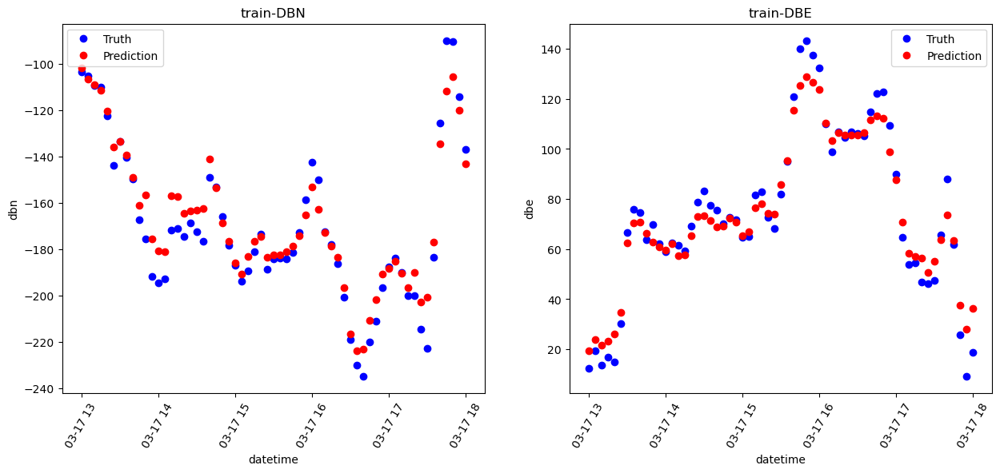

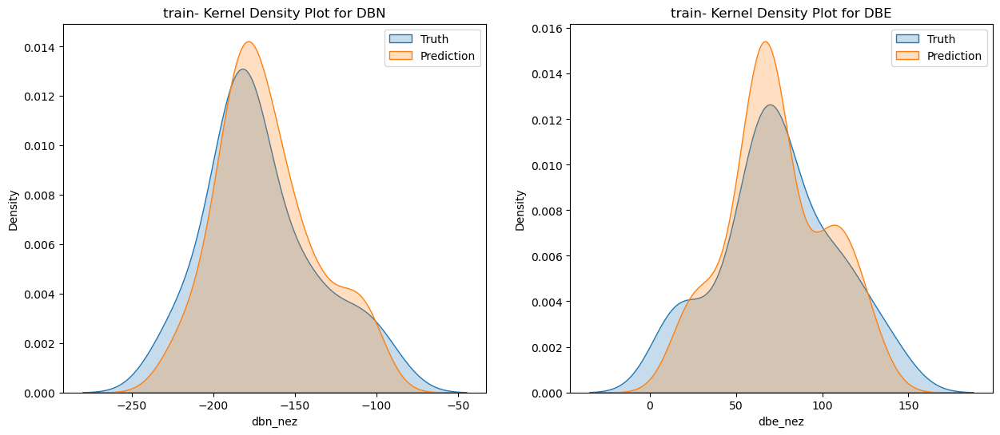

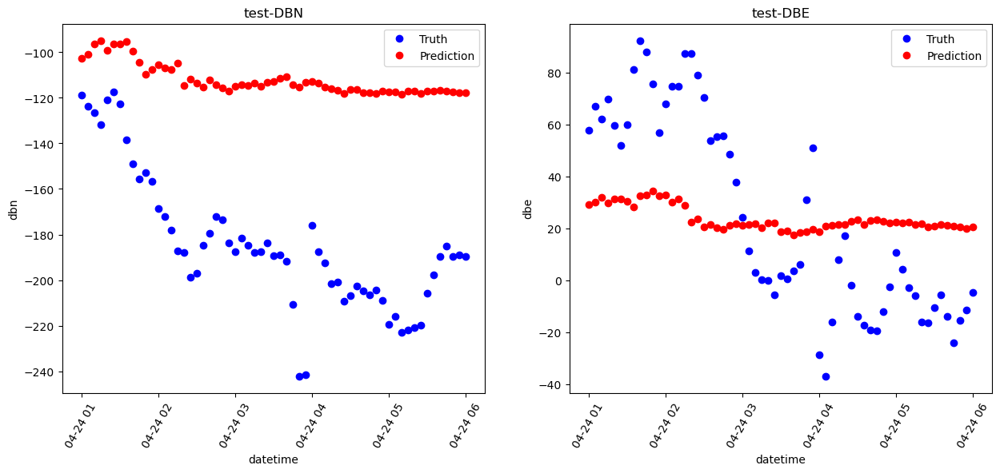

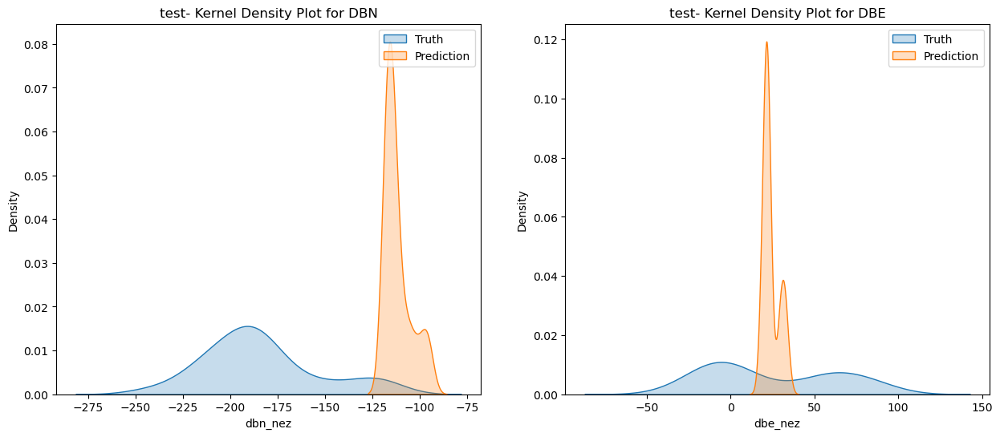

In [228]:
regr_rf, regr_rf_hours_y_train_pred, regr_rf_hours_y_test_pred = experiment(regr_rf, hours_x_train, hours_y_train, hours_x_test, hours_y_test, "regr_rf")
metric_visualization(
        regr_rf_hours_y_train_pred,
        regr_rf_hours_y_test_pred,
        targets=["dbn_nez", "dbe_nez"],
        train_sample=hours_train_data,
        test_sample=hours_test_data,
        y_train=hours_y_train,
        y_test=hours_y_test)

### RANDOM FOREST (ON GPU)

In [35]:
import gc
import cudf
from cuml.ensemble import RandomForestRegressor

In [ ]:
max_depth = 30
regr_rf = RandomForestRegressor(n_estimators=100, max_depth=max_depth, random_state=2)
x_train_df = cudf.from_pandas(x_train)
y_train_df = cudf.from_pandas(y_train)
regr_rf.fit(x_train_df, y_train_df)

### RANDOM FOREST HYPERPARAMETER OPTIMIZATION

#### Optimizing Hyperparameter

In [23]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error as mse

In [20]:
def my_scorer(estimator, X, y):
    preds = estimator.predict(X)
    scores = np.sqrt(mse(y, preds, multioutput='raw_values'))
    avg = np.mean(scores)
    result = {
        'avg_error': avg,
        'dbn_error': scores[0],
        'dbe_error': scores[1]
        }
    return result

In [24]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import RepeatedKFold
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 1000, num = 10)]
# Number of features to consider at every split
max_features = ['log2', 'sqrt', 0.5, None]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10, 20]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4, 8]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [200, 288, 377, 466, 555, 644, 733, 822, 911, 1000], 'max_features': ['log2', 'sqrt', 0.5, None], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10, 20], 'min_samples_leaf': [1, 2, 4, 8], 'bootstrap': [True, False]}


In [25]:
import os
n_jobs = 2  # The number of tasks to run in parallel
n_cpus = 12  # Number of CPUs assigned to this process

pid = os.getpid()
print("PID: %i" % pid)

# Control which CPUs are made available for this script
cpu_arg = ''.join([str(ci) + ',' for ci in list(range(n_cpus))])[:-1]
cmd = 'taskset -cp %s %i' % (cpu_arg, pid)
print("executing command '%s' ..." % cmd)
os.system(cmd)

PID: 234440
executing command 'taskset -cp 0,1,2,3,4,5,6,7,8,9,10,11 234440' ...
pid 234440's current affinity list: 0-15
pid 234440's new affinity list: 0-11


0

In [26]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor(n_jobs=4)
# Random search of parameters, using 3 fold cross validation,
# cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 50, cv = 3, verbose=3, scoring='neg_root_mean_squared_error', random_state=42, n_jobs = n_jobs)
# Fit the random search model
rf_random.fit(x_train, y_train)

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV 1/3] END bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=200;, score=-6.491 total time= 2.1min
[CV 2/3] END bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=200;, score=-8.016 total time= 2.2min
[CV 1/3] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200;, score=-6.493 total time= 2.0min
[CV 3/3] END bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=200;, score=-6.565 total time= 2.2min
[CV 2/3] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200;, score=-8.005 total time= 2.0min


/home/nasa_jpl/anaconda3/envs/rapids-24.04/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 3/3] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200;, score=-6.568 total time= 2.1min
[CV 1/3] END bootstrap=True, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=20, n_estimators=200;, score=-6.487 total time= 2.1min
[CV 2/3] END bootstrap=True, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=20, n_estimators=200;, score=-7.997 total time= 2.1min
[CV 3/3] END bootstrap=True, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=20, n_estimators=200;, score=-6.563 total time= 2.1min
[CV 1/3] END bootstrap=False, max_depth=90, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=911;, score=-8.487 total time=48.6min
[CV 2/3] END bootstrap=False, max_depth=90, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=911;, score=-9.731 total time=49.2min
[CV 1/3] END bootstrap=True, max_depth=90, max_features=log2, min_samp

RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(n_jobs=4), n_iter=50,
                   n_jobs=2,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['log2', 'sqrt', 0.5,
                                                         None],
                                        'min_samples_leaf': [1, 2, 4, 8],
                                        'min_samples_split': [2, 5, 10, 20],
                                        'n_estimators': [200, 288, 377, 466,
                                                         555, 644, 733, 822,
                                                         911, 1000]},
                   random_state=42, scoring='neg_root_mean_squared_error',
                   verbose=3)

In [30]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor(n_jobs=4)
# Random search of parameters, using 3 fold cross validation,
# cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=3, scoring='neg_root_mean_squared_error', random_state=42, n_jobs = n_jobs)
# Fit the random search model
rf_random.fit(x_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[CV 1/3] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200;, score=-6.474 total time= 3.0min
[CV 3/3] END bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=200;, score=-6.572 total time= 3.4min
[CV 2/3] END bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=200;, score=-8.005 total time= 3.4min
[CV 1/3] END bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=200;, score=-6.506 total time= 3.4min
[CV 2/3] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200;, score=-8.003 total time= 2.9min
[CV 3/3] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200;, score=-6.563 total time= 2.9min
[CV 1/3] END bootstrap=True, max_depth=90, max_features=sqrt, mi

In [28]:
rf_random.cv_results_

{'mean_fit_time': array([ 129.36214558,  118.49193589,  123.93104211, 2928.39251049,
         180.6784695 ,  899.64631661,  968.98945141, 1211.34412201,
        1600.97971869,  429.75307711,  681.61370619, 1716.57061529,
         998.9985714 ,  847.14923994,  639.49019249, 1885.78059491,
         256.08659363,  308.68929831,  790.34183582,  553.41453584,
         846.77705216,  880.72467192, 2361.6216766 , 1017.31516465,
         176.47854225,  676.73533956,  135.03251624, 1136.25480723,
         408.43631244,  417.84092967,  816.02116458, 1495.32603153,
         546.25167775,  692.14748343, 1059.57022095,  448.15634886,
        1890.65454888,  401.29708536,  460.15408524,  534.40315541,
         782.71666129, 1472.25091743,  296.67942333, 1533.12058703,
         375.56627782,  688.31482959,  621.24230305, 2093.15421629,
         224.85761809, 1521.21507557]),
 'std_fit_time': array([ 2.71298086,  2.18206001,  1.2385285 , 16.34485999,  5.12603256,
         4.6445712 ,  8.33940262, 25.0

In [30]:
def pooled_var(stds, cv=3):
    n = cv # size of each group
    return np.sqrt(sum((n-1)*(stds**2))/ len(stds)*(n-1))

In [61]:
rf_random_df = pd.DataFrame(rf_random.cv_results_)
rf_random_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_split,param_min_samples_leaf,param_max_features,param_max_depth,param_bootstrap,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,129.362146,2.712981,2.208502,0.033454,200,20,2,sqrt,None,True,"{'n_estimators': 200, 'min_samples_split': 20,...",-6.491385,-8.015991,-6.565074,-7.024150,0.701982,16
1,118.491936,2.182060,1.877290,0.064755,200,10,2,sqrt,20,True,"{'n_estimators': 200, 'min_samples_split': 10,...",-6.493356,-8.005212,-6.568008,-7.022192,0.695768,13
2,123.931042,1.238529,2.204894,0.086361,200,20,4,sqrt,90,True,"{'n_estimators': 200, 'min_samples_split': 20,...",-6.487379,-7.997138,-6.562632,-7.015716,0.694649,6
3,2928.392510,16.344860,10.760134,0.388371,911,5,8,None,90,False,"{'n_estimators': 911, 'min_samples_split': 5, ...",-8.486914,-9.731025,-8.465094,-8.894345,0.591690,48
4,180.678469,5.126033,2.997973,0.037892,288,20,2,log2,90,True,"{'n_estimators': 288, 'min_samples_split': 20,...",-6.472789,-8.008922,-6.583724,-7.021812,0.699460,12
5,899.646317,4.644571,6.495772,0.230927,555,2,8,0.5,70,False,"{'n_estimators': 555, 'min_samples_split': 2, ...",-6.445479,-8.066102,-6.589587,-7.033723,0.732369,23
6,968.989451,8.339403,7.880206,0.085061,555,2,4,0.5,60,False,"{'n_estimators': 555, 'min_samples_split': 2, ...",-6.457463,-8.085720,-6.615175,-7.052786,0.733227,30
7,1211.344122,25.059583,5.891480,0.228784,555,5,8,None,90,True,"{'n_estimators': 555, 'min_samples_split': 5, ...",-6.691061,-8.170973,-6.825978,-7.229337,0.668111,39
8,1600.979719,45.528740,8.529176,0.280698,644,10,1,None,100,True,"{'n_estimators': 644, 'min_samples_split': 10,...",-6.734093,-8.235338,-6.861940,-7.277124,0.679567,47
9,429.753077,10.780671,2.430515,0.023550,733,10,8,0.5,10,True,"{'n_estimators': 733, 'min_samples_split': 10,...",-6.441062,-8.063633,-6.597233,-7.033976,0.730864,24


In [73]:
rf_random_df.to_csv('50_samples_hyperparameter.csv')

In [74]:
# import pickle

# with open("random_search_cv_rslt.pickle", "wb") as f:
#     pickle.dump(rf_random, f)

In [75]:
# with open('random_search_cv_rslt.pickle', 'rb') as file:
#     # Deserialize and load the object from the file
#     loaded_object = pickle.load(file)

In [33]:
rf_random_df.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_n_estimators', 'param_min_samples_split',
       'param_min_samples_leaf', 'param_max_features', 'param_max_depth',
       'param_bootstrap', 'params', 'split0_test_score', 'split1_test_score',
       'split2_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score'],
      dtype='object')

In [64]:
rf_random_df.groupby(f'param_max_depth')[['mean_test_score',
           'std_test_score']].agg({
              'mean_test_score': 'mean',
              'std_test_score': pooled_var})

,mean_test_score,std_test_score
param_max_depth,,
10,-7.177454,1.330092
20,-7.085955,1.396251
30,-7.075621,1.394990
40,-7.139680,1.385320
50,-7.030162,1.438156
60,-7.519085,1.379402
70,-7.106265,1.403486
80,-7.080342,1.375036
90,-7.314386,1.370828


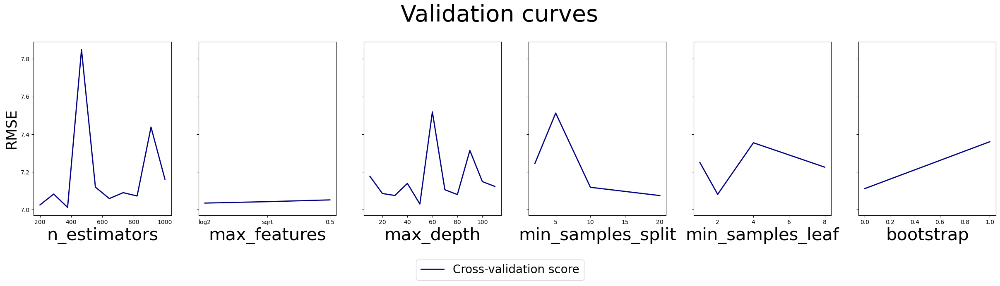

In [72]:
results = ['mean_test_score',
           'std_test_score'
           ]

fig, axes = plt.subplots(1, len(random_grid), 
                         figsize = (5*len(random_grid), 7),
                         sharey='row')
axes[0].set_ylabel("RMSE", fontsize=25)
lw = 2

for idx, (param_name, param_range) in enumerate(random_grid.items()):
    grouped_df = rf_random_df.groupby(f'param_{param_name}')[results]\
        .agg({
              'mean_test_score': 'mean',
              'std_test_score': pooled_var})

    previous_group = rf_random_df.groupby(f'param_{param_name}')[results]
    axes[idx].set_xlabel(param_name, fontsize=30)
    if param_name == "max_features":
        param_range = ['log2', 'sqrt', '0.5']
    
    if None in param_range:
        param_range.remove(None)

    axes[idx].plot(param_range,
                -grouped_df['mean_test_score'],
                label="Cross-validation score",
                color="navy",
                lw=lw)
    # axes[idx].fill_between(param_range,
    #                 grouped_df['mean_test_score'] - grouped_df['std_test_score'],
    #                 grouped_df['mean_test_score'] + grouped_df['std_test_score'],
    #                 alpha=0.2,
    #                 color="navy",
    #                 lw=lw)


handles, labels = axes[0].get_legend_handles_labels()
fig.suptitle('Validation curves', fontsize=40)
fig.legend(handles, labels, loc=8, ncol=2, fontsize=20)

fig.subplots_adjust(bottom=0.25, top=0.85)  
plt.show()


In [27]:
rf_random.best_params_

{'n_estimators': 911,
 'min_samples_split': 5,
 'min_samples_leaf': 8,
 'max_features': 0.5,
 'max_depth': 90,
 'bootstrap': True}

In [ ]:
# [CV 1/3] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200;, score=-6.474 total time= 3.0min
# [CV 3/3] END bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=200;, score=-6.572 total time= 3.4min
# [CV 2/3] END bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=200;, score=-8.005 total time= 3.4min
# [CV 1/3] END bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=200;, score=-6.506 total time= 3.4min
# [CV 2/3] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200;, score=-8.003 total time= 2.9min
# [CV 3/3] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200;, score=-6.563 total time= 2.9min
# [CV 1/3] END bootstrap=True, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=20, n_estimators=200;, score=-6.483 total time= 3.3min
# [CV 2/3] END bootstrap=True, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=20, n_estimators=200;, score=-8.001 total time= 3.4min
# [CV 3/3] END bootstrap=True, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=20, n_estimators=200;, score=-6.576 total time= 3.3min
# [CV 1/3] END bootstrap=True, max_depth=90, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=288;, score=-6.501 total time= 4.9min
# [CV 2/3] END bootstrap=True, max_depth=90, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=288;, score=-8.004 total time= 4.8min
# [CV 3/3] END bootstrap=True, max_depth=90, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=288;, score=-6.565 total time= 4.6min
# [CV 1/3] END bootstrap=False, max_depth=70, max_features=0.5, min_samples_leaf=8, min_samples_split=2, n_estimators=555;, score=-6.448 total time=24.2min
# [CV 2/3] END bootstrap=False, max_depth=70, max_features=0.5, min_samples_leaf=8, min_samples_split=2, n_estimators=555;, score=-8.068 total time=23.6min
# [CV 2/3] END bootstrap=False, max_depth=90, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=911;, score=-9.731 total time=76.0min
# [CV 1/3] END bootstrap=False, max_depth=90, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=911;, score=-8.487 total time=76.4min
# [CV 3/3] END bootstrap=False, max_depth=90, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=911;, score=-8.465 total time=77.6min
# [CV 3/3] END bootstrap=False, max_depth=70, max_features=0.5, min_samples_leaf=8, min_samples_split=2, n_estimators=555;, score=-6.598 total time=24.3min
# [CV 1/3] END bootstrap=False, max_depth=60, max_features=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=555;, score=-6.460 total time=25.4min
# [CV 2/3] END bootstrap=False, max_depth=60, max_features=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=555;, score=-8.077 total time=25.7min
# [CV 3/3] END bootstrap=False, max_depth=60, max_features=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=555;, score=-6.610 total time=26.4min
# [CV 1/3] END bootstrap=True, max_depth=90, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=555;, score=-6.690 total time=31.5min
# [CV 2/3] END bootstrap=True, max_depth=90, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=555;, score=-8.170 total time=30.3min
# [CV 3/3] END bootstrap=True, max_depth=90, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=555;, score=-6.825 total time=31.6min
# [CV 1/3] END bootstrap=True, max_depth=10, max_features=0.5, min_samples_leaf=8, min_samples_split=10, n_estimators=733;, score=-6.438 total time=11.5min
# [CV 1/3] END bootstrap=True, max_depth=100, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=644;, score=-6.733 total time=40.9min
# [CV 2/3] END bootstrap=True, max_depth=10, max_features=0.5, min_samples_leaf=8, min_samples_split=10, n_estimators=733;, score=-8.058 total time=11.6min
# [CV 3/3] END bootstrap=True, max_depth=10, max_features=0.5, min_samples_leaf=8, min_samples_split=10, n_estimators=733;, score=-6.599 total time=12.0min
# [CV 2/3] END bootstrap=True, max_depth=100, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=644;, score=-8.236 total time=40.6min
# [CV 3/3] END bootstrap=True, max_depth=100, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=644;, score=-6.866 total time=41.9min
# [CV 1/3] END bootstrap=False, max_depth=100, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=733;, score=-6.499 total time=18.2min
# [CV 2/3] END bootstrap=False, max_depth=100, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=733;, score=-8.005 total time=18.5min
# [CV 3/3] END bootstrap=False, max_depth=100, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=733;, score=-6.592 total time=18.0min
# [CV 1/3] END bootstrap=True, max_depth=90, max_features=0.5, min_samples_leaf=8, min_samples_split=5, n_estimators=911;, score=-6.407 total time=26.8min
# [CV 1/3] END bootstrap=True, max_depth=70, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=733;, score=-6.709 total time=44.8min
# [CV 2/3] END bootstrap=True, max_depth=70, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=733;, score=-8.208 total time=44.3min
# [CV 3/3] END bootstrap=True, max_depth=70, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=733;, score=-6.844 total time=44.8min
# [CV 2/3] END bootstrap=True, max_depth=90, max_features=0.5, min_samples_leaf=8, min_samples_split=5, n_estimators=911;, score=-8.040 total time=27.0min
# [CV 1/3] END bootstrap=False, max_depth=110, max_features=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=466;, score=-6.471 total time=22.7min
# [CV 2/3] END bootstrap=False, max_depth=110, max_features=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=466;, score=-8.098 total time=23.4min
# [CV 3/3] END bootstrap=True, max_depth=90, max_features=0.5, min_samples_leaf=8, min_samples_split=5, n_estimators=911;, score=-6.555 total time=26.5min
# [CV 3/3] END bootstrap=False, max_depth=110, max_features=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=466;, score=-6.622 total time=21.9min
# [CV 1/3] END bootstrap=False, max_depth=70, max_features=log2, min_samples_leaf=4, min_samples_split=20, n_estimators=733;, score=-6.492 total time=17.1min
# [CV 2/3] END bootstrap=False, max_depth=70, max_features=log2, min_samples_leaf=4, min_samples_split=20, n_estimators=733;, score=-8.002 total time=17.7min
# [CV 3/3] END bootstrap=False, max_depth=70, max_features=log2, min_samples_leaf=4, min_samples_split=20, n_estimators=733;, score=-6.588 total time=16.8min
# [CV 1/3] END bootstrap=False, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=288;, score=-6.489 total time= 6.6min
# [CV 2/3] END bootstrap=False, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=288;, score=-8.034 total time= 7.1min
# [CV 3/3] END bootstrap=False, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=288;, score=-6.594 total time= 6.7min
# [CV 1/3] END bootstrap=False, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=377;, score=-6.485 total time= 8.7min

In [ ]:
# Fitting 3 folds for each of 100 candidates, totalling 300 fits
# [CV 1/3] END bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=200;, score=-6.503 total time= 2.5min
# [CV 2/3] END bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=200;, score=-8.011 total time= 2.6min
# [CV 3/3] END bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=200;, score=-6.581 total time= 2.8min
# [CV 1/3] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200;, score=-6.483 total time= 2.3min
# [CV 2/3] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200;, score=-8.011 total time= 2.3min
# [CV 3/3] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200;, score=-6.559 total time= 2.4min
# [CV 2/3] END bootstrap=True, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=20, n_estimators=200;, score=-7.994 total time= 2.4min
# [CV 1/3] END bootstrap=True, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=20, n_estimators=200;, score=-6.482 total time= 2.5min
# [CV 3/3] END bootstrap=True, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=20, n_estimators=200;, score=-6.584 total time= 2.5min
# [CV 2/3] END bootstrap=False, max_depth=90, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=911;, score=-9.731 total time=57.7min
# /home/nasa_jpl/anaconda3/envs/rapids-24.04/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
#   warnings.warn(
# [CV 1/3] END bootstrap=False, max_depth=90, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=911;, score=-8.487 total time=58.1min
# [CV 3/3] END bootstrap=False, max_depth=90, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=911;, score=-8.465 total time=58.3min
# [CV 2/3] END bootstrap=True, max_depth=90, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=288;, score=-8.018 total time= 3.4min
# [CV 1/3] END bootstrap=True, max_depth=90, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=288;, score=-6.479 total time= 3.8min
# [CV 3/3] END bootstrap=True, max_depth=90, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=288;, score=-6.571 total time= 3.7min
# [CV 1/3] END bootstrap=False, max_depth=70, max_features=0.5, min_samples_leaf=8, min_samples_split=2, n_estimators=555;, score=-6.438 total time=18.0min
# [CV 3/3] END bootstrap=False, max_depth=70, max_features=0.5, min_samples_leaf=8, min_samples_split=2, n_estimators=555;, score=-6.599 total time=17.3min
# [CV 2/3] END bootstrap=False, max_depth=70, max_features=0.5, min_samples_leaf=8, min_samples_split=2, n_estimators=555;, score=-8.068 total time=18.9min
# [CV 1/3] END bootstrap=False, max_depth=60, max_features=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=555;, score=-6.459 total time=18.8min
# [CV 2/3] END bootstrap=False, max_depth=60, max_features=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=555;, score=-8.080 total time=20.0min
# [CV 3/3] END bootstrap=False, max_depth=60, max_features=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=555;, score=-6.610 total time=19.6min
# [CV 1/3] END bootstrap=True, max_depth=90, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=555;, score=-6.695 total time=23.5min
# [CV 2/3] END bootstrap=True, max_depth=90, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=555;, score=-8.174 total time=23.6min
# [CV 3/3] END bootstrap=True, max_depth=90, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=555;, score=-6.825 total time=23.5min
# [CV 1/3] END bootstrap=True, max_depth=100, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=644;, score=-6.732 total time=31.1min
# [CV 2/3] END bootstrap=True, max_depth=100, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=644;, score=-8.236 total time=30.9min
# [CV 3/3] END bootstrap=True, max_depth=100, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=644;, score=-6.863 total time=31.0min
# [CV 1/3] END bootstrap=True, max_depth=10, max_features=0.5, min_samples_leaf=8, min_samples_split=10, n_estimators=733;, score=-6.442 total time= 8.8min
# [CV 2/3] END bootstrap=True, max_depth=10, max_features=0.5, min_samples_leaf=8, min_samples_split=10, n_estimators=733;, score=-8.057 total time= 8.5min
# [CV 3/3] END bootstrap=True, max_depth=10, max_features=0.5, min_samples_leaf=8, min_samples_split=10, n_estimators=733;, score=-6.598 total time= 9.0min
# [CV 1/3] END bootstrap=False, max_depth=100, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=733;, score=-6.490 total time=14.1min
# [CV 2/3] END bootstrap=False, max_depth=100, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=733;, score=-7.996 total time=13.7min
# [CV 3/3] END bootstrap=False, max_depth=100, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=733;, score=-6.592 total time=13.5min
# [CV 2/3] END bootstrap=True, max_depth=70, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=733;, score=-8.216 total time=32.4min
# [CV 3/3] END bootstrap=True, max_depth=70, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=733;, score=-6.845 total time=33.7min
# [CV 1/3] END bootstrap=True, max_depth=70, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=733;, score=-6.709 total time=35.3min
# [CV 1/3] END bootstrap=True, max_depth=90, max_features=0.5, min_samples_leaf=8, min_samples_split=5, n_estimators=911;, score=-6.406 total time=20.7min
# [CV 2/3] END bootstrap=True, max_depth=90, max_features=0.5, min_samples_leaf=8, min_samples_split=5, n_estimators=911;, score=-8.043 total time=20.4min
# [CV 3/3] END bootstrap=True, max_depth=90, max_features=0.5, min_samples_leaf=8, min_samples_split=5, n_estimators=911;, score=-6.549 total time=20.5min
# [CV 1/3] END bootstrap=False, max_depth=110, max_features=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=466;, score=-6.471 total time=17.1min
# [CV 2/3] END bootstrap=False, max_depth=110, max_features=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=466;, score=-8.092 total time=16.8min
# [CV 3/3] END bootstrap=False, max_depth=110, max_features=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=466;, score=-6.624 total time=16.9min
# [CV 1/3] END bootstrap=False, max_depth=70, max_features=log2, min_samples_leaf=4, min_samples_split=20, n_estimators=733;, score=-6.488 total time=13.4min
# [CV 2/3] END bootstrap=False, max_depth=70, max_features=log2, min_samples_leaf=4, min_samples_split=20, n_estimators=733;, score=-8.002 total time=12.8min
# [CV 3/3] END bootstrap=False, max_depth=70, max_features=log2, min_samples_leaf=4, min_samples_split=20, n_estimators=733;, score=-6.583 total time=12.7min

#### Loading Optimized Hyperparameter

In [19]:
experienced_hyperparameters = pd.read_csv('run_records.csv')

In [21]:
experienced_hyperparameters.sort_values(by='score')

,bootstrap,max_depth,max_features,min_samples_leaf,min_samples_split,n_estimators,score
36,True,90.0,0.5,8,5,911,6.406
78,True,90.0,0.5,8,5,911,6.407
15,False,70.0,0.5,8,2,555,6.438
69,True,10.0,0.5,8,10,733,6.438
27,True,10.0,0.5,8,10,733,6.442
...,...,...,...,...,...,...,...
11,False,90.0,NaN,8,5,911,8.465
60,False,90.0,NaN,8,5,911,8.487
10,False,90.0,NaN,8,5,911,8.487
9,False,90.0,NaN,8,5,911,9.731


In [19]:
from sklearn.ensemble import RandomForestRegressor

max_depth = 90
bootstrap = True
max_features = 0.5
min_samples_leaf = 8
min_samples_split = 5
n_estimators = 911

regr_rf = RandomForestRegressor(n_estimators=n_estimators,
                                max_depth=max_depth,
                                bootstrap=bootstrap,
                                max_features=max_features,
                                min_samples_leaf=min_samples_leaf,
                                min_samples_split=min_samples_split,
                                random_state=2,
                                n_jobs=-1)

regr_rf.fit(x_train, y_train)

RandomForestRegressor(max_depth=90, max_features=0.5, min_samples_leaf=8,
                      min_samples_split=5, n_estimators=911, n_jobs=-1,
                      random_state=2)

regression_rf metrics:
Train MSE: [3.10008281 2.82545645]
Train MAE: [1.88541491 1.70571642]
Test MSE: [7.72851167 5.87643097]
Test MAE: [5.45354611 4.05777287]


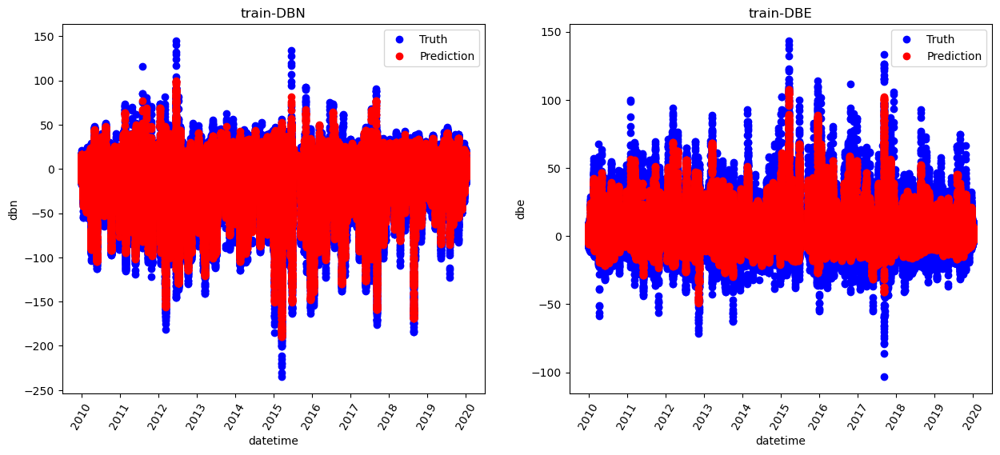

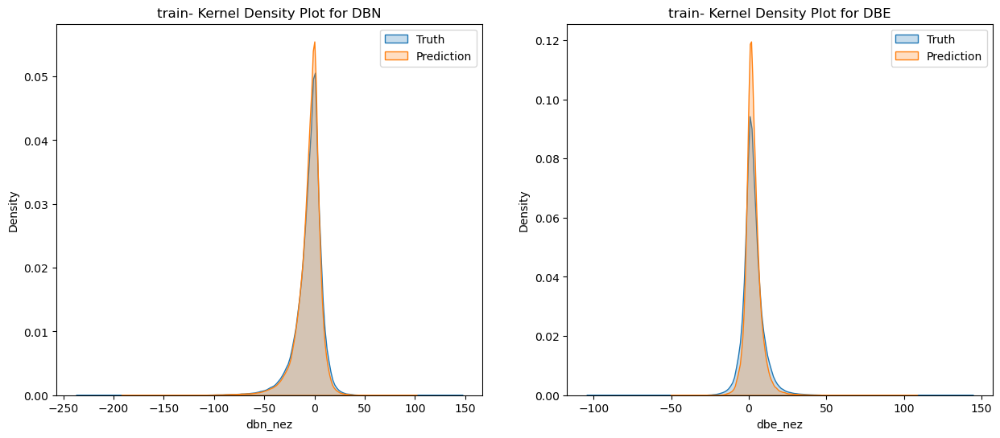

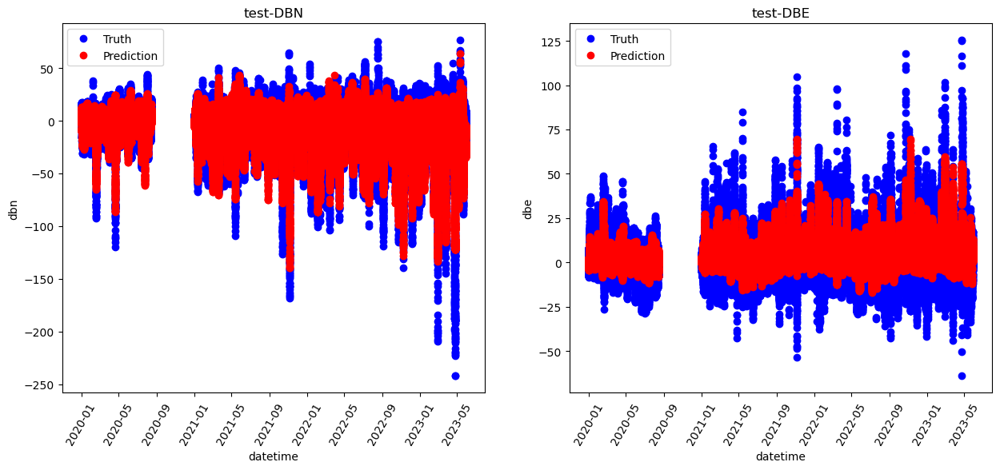

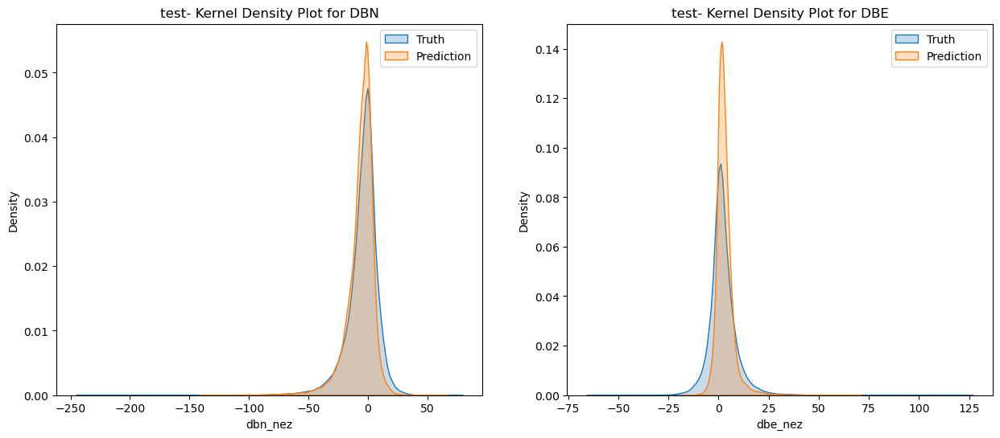

In [20]:
regr_rf, rf_y_train_pred, rf_y_test_pred = experiment(regr_rf, x_train, y_train, x_test, y_test, "regression_rf")
metric_visualization(rf_y_train_pred,
                     rf_y_test_pred,
                     train_sample=train_dataset_subsample,
                     test_sample=test_dataset_subsample,
                     y_train=y_train,
                     y_test=y_test)

regr_rf metrics:
Train MSE: [12.11924878 10.5749656 ]
Train MAE: [7.8808302  6.88618029]
Test MSE: [33.5380903 21.7248513]
Test MAE: [24.70789437 14.61844022]


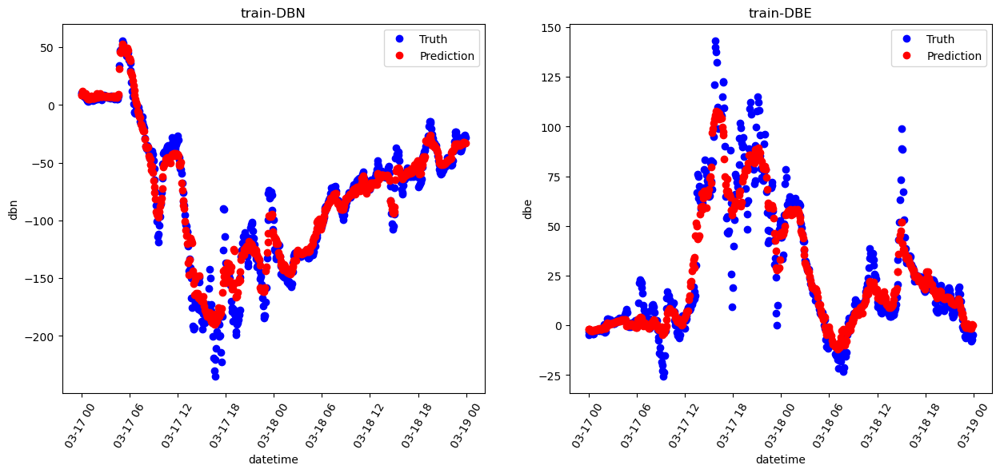

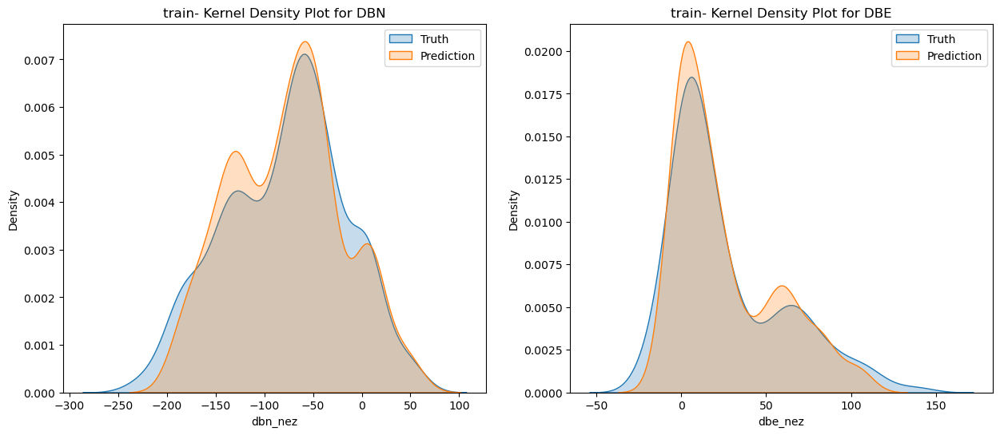

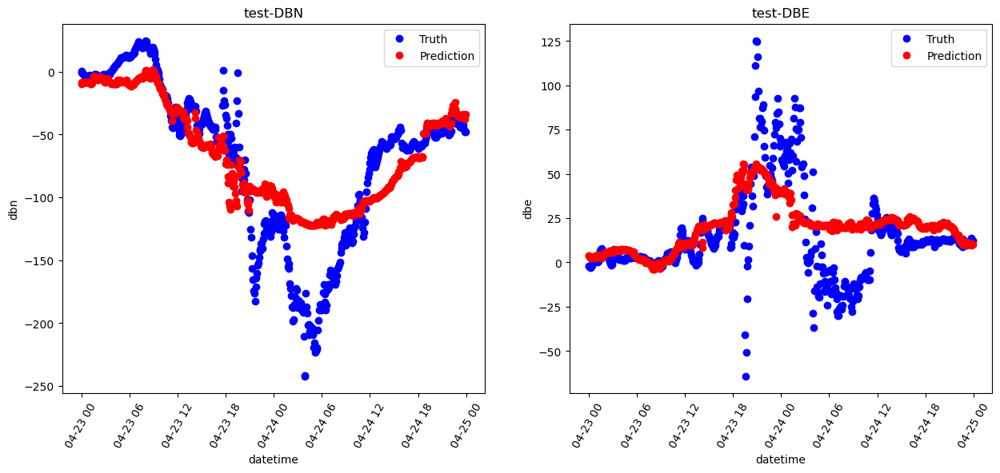

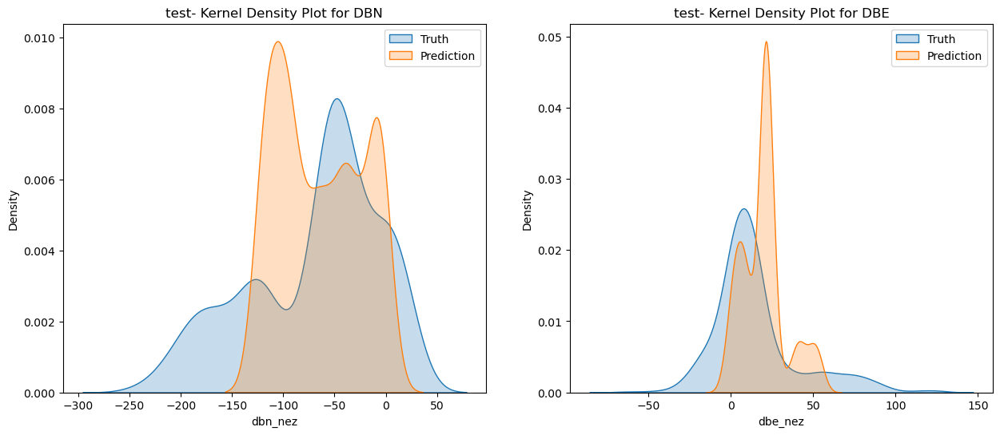

In [21]:
regr_rf, regr_rf_two_days_y_train_pred, regr_rf_two_days_y_test_pred = experiment(regr_rf, two_days_x_train, two_days_y_train, two_days_x_test, two_days_y_test, "regr_rf")
metric_visualization(
        regr_rf_two_days_y_train_pred,
        regr_rf_two_days_y_test_pred,
        targets=["dbn_nez", "dbe_nez"],
        train_sample=two_days_train_data,
        test_sample=two_days_test_data,
        y_train=two_days_y_train,
        y_test=two_days_y_test)

regr_rf metrics:
Train MSE: [25.38088287 19.16039634]
Train MAE: [19.92695295 15.42672522]
Test MSE: [71.80244551 35.97246065]
Test MAE: [67.89394744 32.57743518]


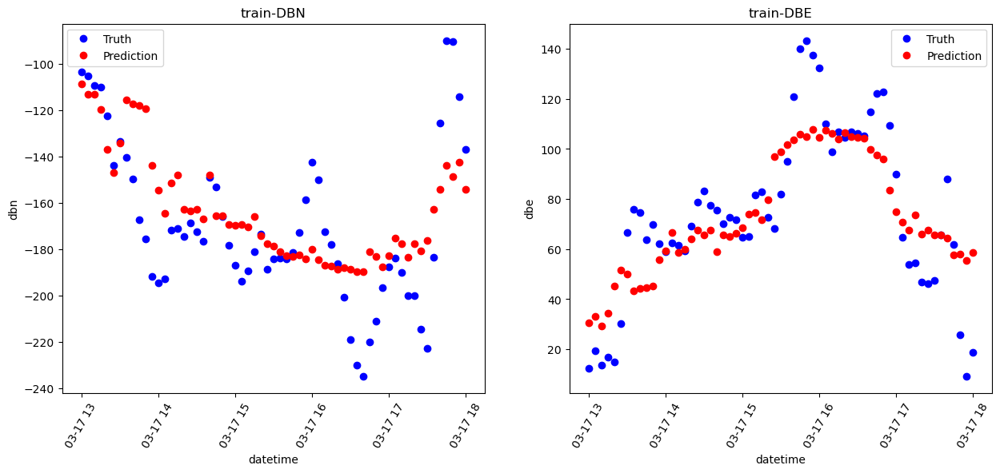

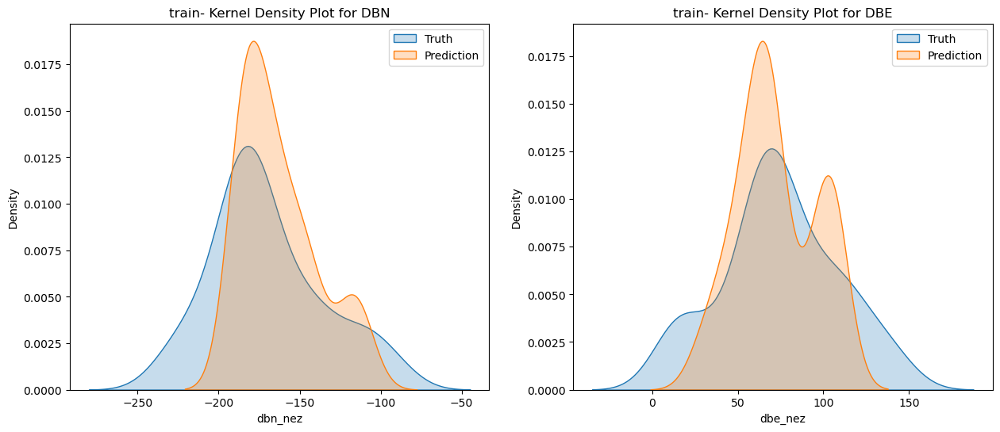

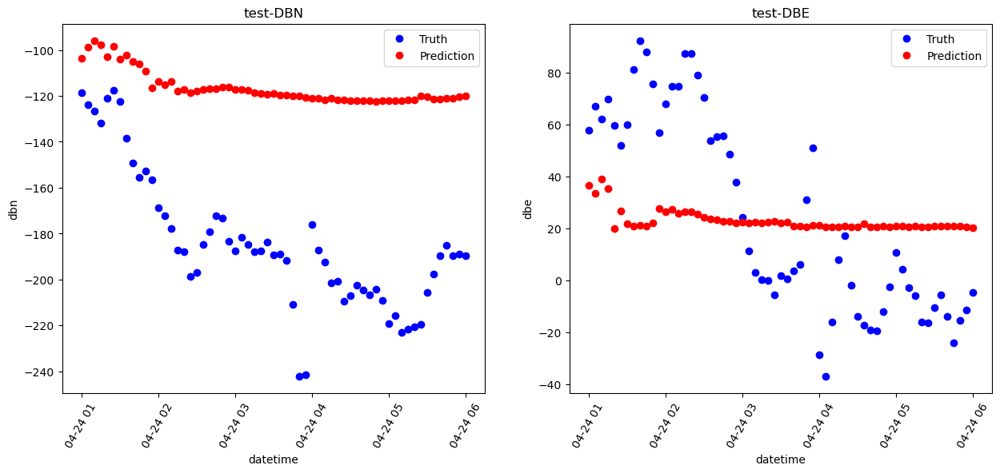

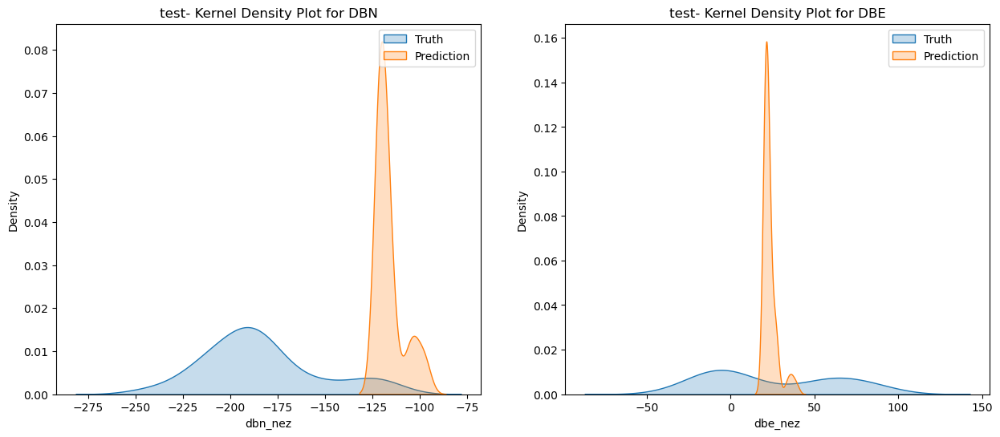

In [22]:
regr_rf, regr_rf_hours_y_train_pred, regr_rf_hours_y_test_pred = experiment(regr_rf, hours_x_train, hours_y_train, hours_x_test, hours_y_test, "regr_rf")
metric_visualization(
        regr_rf_hours_y_train_pred,
        regr_rf_hours_y_test_pred,
        targets=["dbn_nez", "dbe_nez"],
        train_sample=hours_train_data,
        test_sample=hours_test_data,
        y_train=hours_y_train,
        y_test=hours_y_test)